<div style="background-color: #e6f7ff; padding: 10px; font-weight: bold; font-size: 24px; text-align: center">
OBESITY CATEGORY PREDICTION
</div>

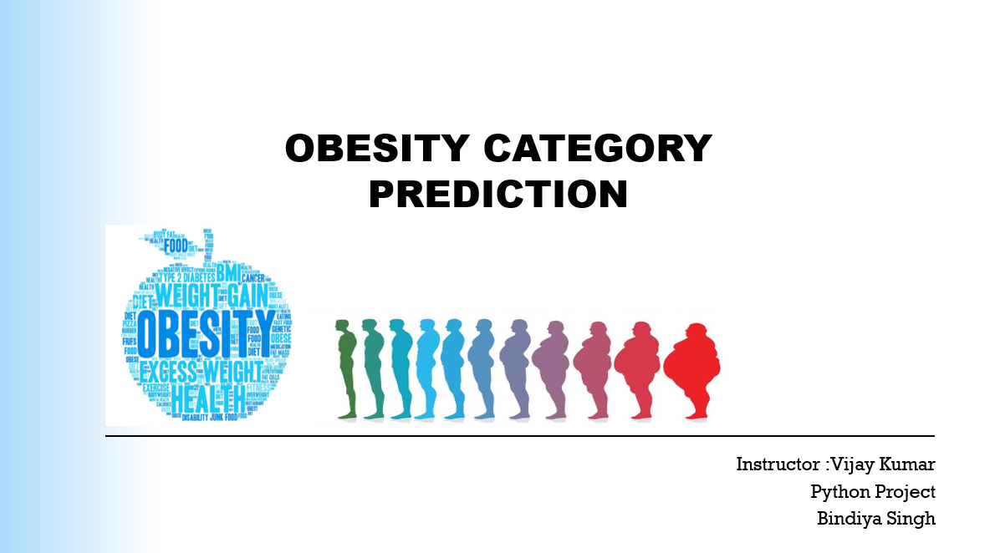

## Table of Content

 - Introduction 
 - Business Problem
 - Objective
 - Business Questions and Hypothesis
 - Exploratory Data Analysis
 - Data Cleaning
 - Feature Engineering
 - Correlation Matrix
 - Model Training and Hyperparameter Tuning
 - Model Evaluation
 - Conclusion

## Decsription of Dataset

The Analysis presents data for the estimation of obesity levels in individuals from the countries of Mexico, Peru, and Colombia, based on their eating habits and physical condition. The data contains 17 attributes and 2111 records, the records are labeled with the class variable NObesity (Obesity Level), which allows classification of the data using the values of Insufficient Weight, Normal Weight, Overweight Level I, Overweight Level II, Obesity Type I, Obesity Type II and Obesity Type III

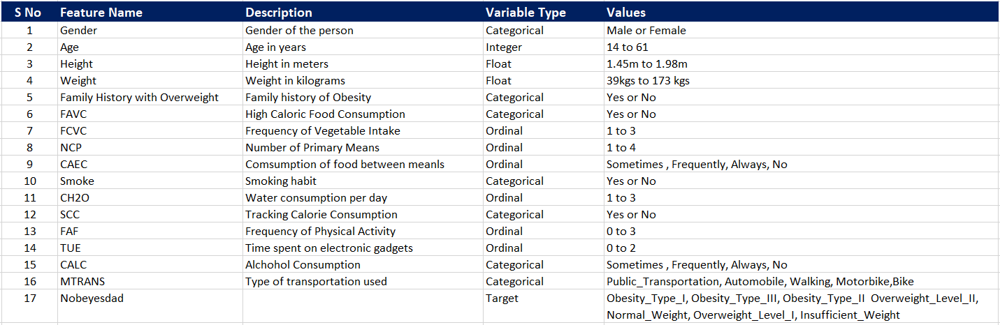

## Business Problem

Obesity is a growing concern worldwide, and its prediction is crucial for preventing and managing related health problems. Obesity is one of the biggest risk factors for a variety of chronic diseases, including heart disease and cancer. The World Health Organization (WHO) defines obesity as an abnormal or excessive deposition of fat that has the potential to severely impact health. Obesity can have a detrimental impact on health (BMI).

## Objective

This analysis aims to develop a reliable and accurate model for predicting obesity based on various demographic and lifestyle factors

## Business questions and Hypotheses
- Between Obesity levels and which features there is a statistical association at a 5% significant level?
- Which features are more important?
- What is the Accuracy, Recall, Precision, and F1 score of the model? 
- Is there a significant difference in obesity prevalence between genders?
- Does age correlate with obesity risk?
- Is there a relationship between height and weight in the dataset?
- Does a family history of overweight influence an individual's obesity status?
- Is there a difference in obesity prevalence between those who consume high-caloric food frequently and those who don't?
- How does the frequency of main meals (FCVC) relate to obesity?
- Does the number of main meals (NCP) have an impact on obesity risk?
- Is there a correlation between smoking habits and obesity?
- How does water intake (CH2O) affect obesity prevalence?
- Does physical activity frequency (FAF) correlate with obesity status?
- Is there an association between transportation mode (MTRANS) and obesity?
- How does calcium intake frequency (CALC) relate to obesity?
- Does calorie consumption monitoring (SCC) influence obesity risk?
- Is there a correlation between obesity and time spent using electronic devices (TUE)?
- How does the frequency of consumption of carbohydrates (CAEC) relate to obesity?

### Libraries Imported

In [771]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from scipy.stats import shapiro

from sklearn.linear_model import LogisticRegression

from xgboost import XGBClassifier

from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier

from sklearn.model_selection import train_test_split
import lightgbm as lgb
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.preprocessing import label_binarize

from statsmodels.stats.multicomp import MultiComparison
from scipy.stats import kruskal
from scipy.stats import f_oneway

import warnings
warnings.filterwarnings("ignore")

from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score , cross_val_predict , GridSearchCV , RandomizedSearchCV

## metric
from sklearn.metrics import accuracy_score , confusion_matrix , classification_report , mean_squared_error

## Ensemble
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier, BaggingClassifier

import xgboost as xgp

### Database Imported

In [772]:
import pandas as pd
df=pd.read_excel('ObesityDataset.xlsx')
df.head()

,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad
0,NaN,21.00,1.62,64.00,yes,no,2.00,3.00,Sometimes,no,2.00,no,0.00,1.00,no,Public_Transportation,Normal_Weight
1,NaN,21.00,1.52,56.00,yes,no,3.00,3.00,Sometimes,yes,3.00,yes,3.00,0.00,Sometimes,Public_Transportation,Normal_Weight
2,Male,23.00,1.80,77.00,yes,no,2.00,3.00,Sometimes,no,2.00,no,2.00,1.00,Frequently,Public_Transportation,Normal_Weight
3,Male,27.00,1.80,87.00,no,no,3.00,3.00,Sometimes,no,2.00,no,2.00,0.00,Frequently,Walking,Overweight_Level_I
4,Male,22.00,1.78,89.80,no,no,2.00,1.00,Sometimes,no,2.00,no,0.00,0.00,Sometimes,Public_Transportation,Overweight_Level_II


In [773]:
df_original = df[:]

In [774]:
df.shape

(2132, 17)

### Duplicate Values 

In [775]:
df.duplicated().sum()

45

In [776]:
df=df.drop_duplicates()
df.duplicated().sum()

0

In [777]:
df.shape

(2087, 17)

In [778]:
df.nunique()

Gender                               2
Age                               1378
Height                            1572
Weight                            1522
family_history_with_overweight       2
FAVC                                 2
FCVC                               810
NCP                                635
CAEC                                 4
SMOKE                                2
CH2O                              1268
SCC                                  2
FAF                               1190
TUE                               1129
CALC                                 4
MTRANS                               5
NObeyesdad                           7
dtype: int64

In [779]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2087 entries, 0 to 2110
Data columns (total 17 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Gender                          2080 non-null   object 
 1   Age                             2063 non-null   float64
 2   Height                          2085 non-null   float64
 3   Weight                          2080 non-null   float64
 4   family_history_with_overweight  2087 non-null   object 
 5   FAVC                            2087 non-null   object 
 6   FCVC                            2087 non-null   float64
 7   NCP                             2087 non-null   float64
 8   CAEC                            2087 non-null   object 
 9   SMOKE                           2087 non-null   object 
 10  CH2O                            2087 non-null   float64
 11  SCC                             2087 non-null   object 
 12  FAF                             2087 no

### Missing Values

In [780]:
df.isna().sum()

Gender                             7
Age                               24
Height                             2
Weight                             7
family_history_with_overweight     0
FAVC                               0
FCVC                               0
NCP                                0
CAEC                               0
SMOKE                              0
CH2O                               0
SCC                                0
FAF                                0
TUE                                0
CALC                               0
MTRANS                             0
NObeyesdad                         0
dtype: int64

In [781]:
df['Gender']=df['Gender'].fillna(df['Gender'].mode()[0])
df['Age']=df['Age'].fillna(df['Age'].mean())
df['Height']=df['Height'].fillna(df['Height'].mean())
df['Weight']=df['Weight'].fillna(df['Weight'].mean())

In [782]:
df.isna().sum()

Gender                            0
Age                               0
Height                            0
Weight                            0
family_history_with_overweight    0
FAVC                              0
FCVC                              0
NCP                               0
CAEC                              0
SMOKE                             0
CH2O                              0
SCC                               0
FAF                               0
TUE                               0
CALC                              0
MTRANS                            0
NObeyesdad                        0
dtype: int64

## EDA

### Univariate Analysis

In [783]:
categorical_columns = [x for x in df.dtypes.index if df.dtypes[x]=='object']

categorical_columns = [x for x in categorical_columns]

for col in categorical_columns:
    print ("="*60)
    print ('Frequency of Categories for variable %s'%col)
    print (df[col].value_counts() )
    print (df[col].value_counts(normalize=True)*100 )

Frequency of Categories for variable Gender
Gender
Male      1059
Female    1028
Name: count, dtype: int64
Gender
Male     50.74
Female   49.26
Name: proportion, dtype: float64
Frequency of Categories for variable family_history_with_overweight
family_history_with_overweight
yes    1722
no      365
Name: count, dtype: int64
family_history_with_overweight
yes   82.51
no    17.49
Name: proportion, dtype: float64
Frequency of Categories for variable FAVC
FAVC
yes    1844
no      243
Name: count, dtype: int64
FAVC
yes   88.36
no    11.64
Name: proportion, dtype: float64
Frequency of Categories for variable CAEC
CAEC
Sometimes     1761
Frequently     236
Always          53
no              37
Name: count, dtype: int64
CAEC
Sometimes    84.38
Frequently   11.31
Always        2.54
no            1.77
Name: proportion, dtype: float64
Frequency of Categories for variable SMOKE
SMOKE
no     2043
yes      44
Name: count, dtype: int64
SMOKE
no    97.89
yes    2.11
Name: proportion, dtype: float64
Fr

In [784]:
categorical_columns

['Gender',
 'family_history_with_overweight',
 'FAVC',
 'CAEC',
 'SMOKE',
 'SCC',
 'CALC',
 'MTRANS',
 'NObeyesdad']

cat_col=(lambda x: x for x in df.columns if df[x].dtype == "object" )
cat_columns=pd.DataFrame({lambda x: x for x in cat_col})
cat_columns

Frequency of Categories for variable Gender
Gender
Male     50.74
Female   49.26
Name: proportion, dtype: float64


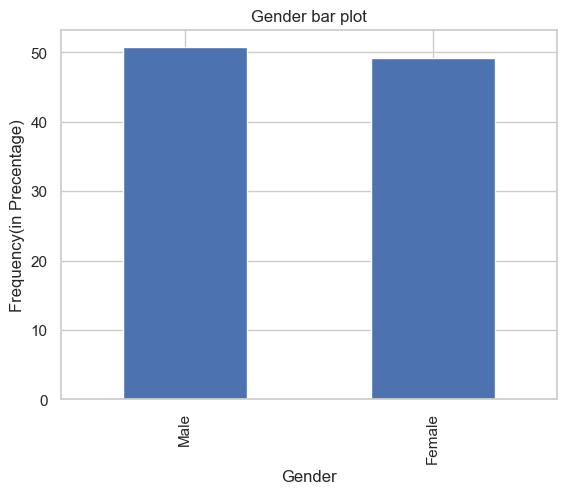

Frequency of Categories for variable family_history_with_overweight
family_history_with_overweight
yes   82.51
no    17.49
Name: proportion, dtype: float64


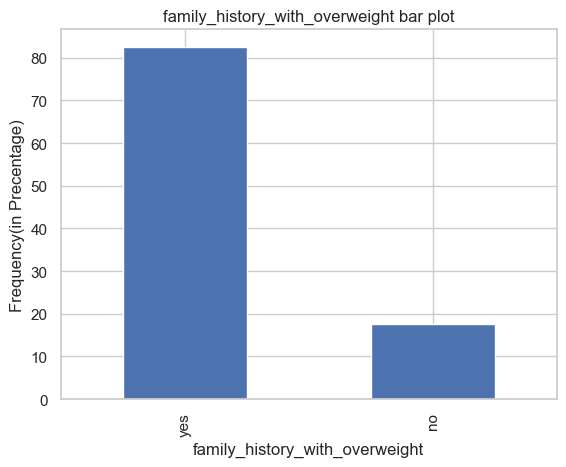

Frequency of Categories for variable FAVC
FAVC
yes   88.36
no    11.64
Name: proportion, dtype: float64


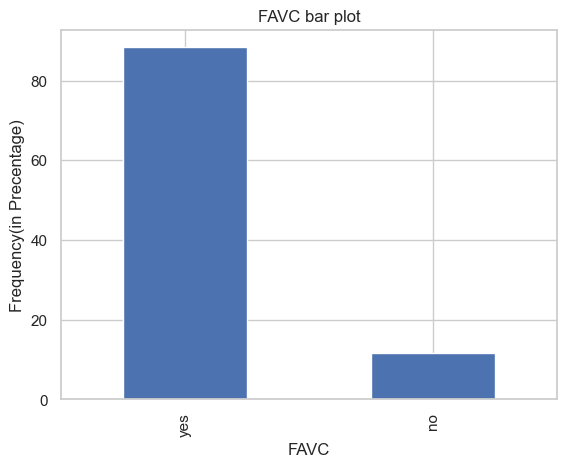

Frequency of Categories for variable CAEC
CAEC
Sometimes    84.38
Frequently   11.31
Always        2.54
no            1.77
Name: proportion, dtype: float64


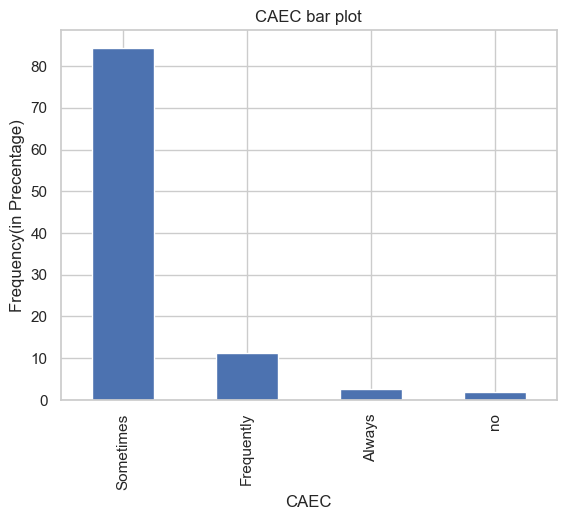

Frequency of Categories for variable SMOKE
SMOKE
no    97.89
yes    2.11
Name: proportion, dtype: float64


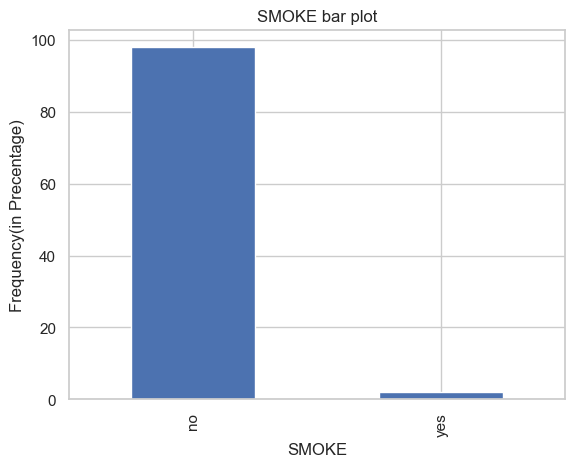

Frequency of Categories for variable SCC
SCC
no    95.40
yes    4.60
Name: proportion, dtype: float64


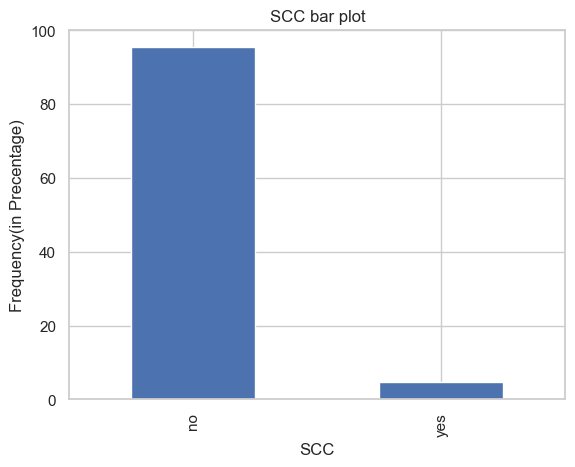

Frequency of Categories for variable CALC
CALC
Sometimes    66.12
no           30.47
Frequently    3.35
Always        0.05
Name: proportion, dtype: float64


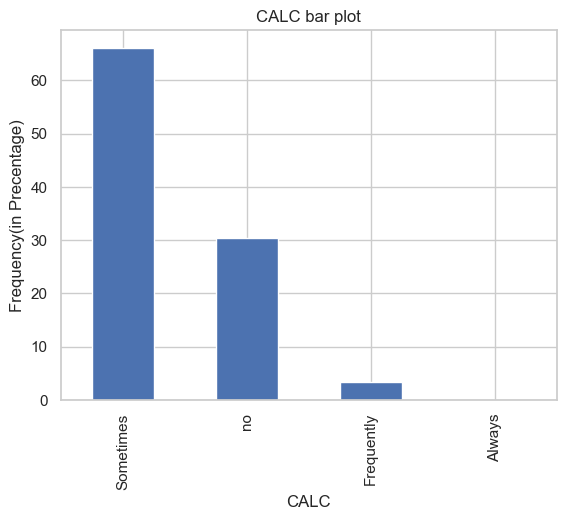

Frequency of Categories for variable MTRANS
MTRANS
Public_Transportation   74.65
Automobile              21.85
Walking                  2.64
Motorbike                0.53
Bike                     0.34
Name: proportion, dtype: float64


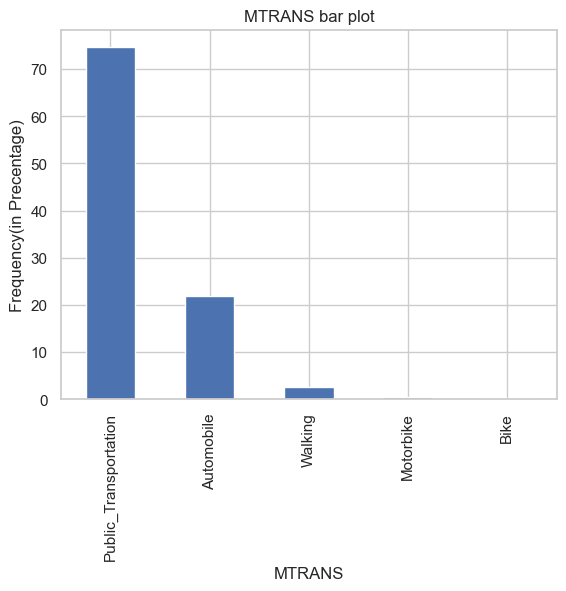

Frequency of Categories for variable NObeyesdad
NObeyesdad
Obesity_Type_I        16.82
Obesity_Type_III      15.52
Obesity_Type_II       14.23
Overweight_Level_II   13.90
Normal_Weight         13.51
Overweight_Level_I    13.22
Insufficient_Weight   12.79
Name: proportion, dtype: float64


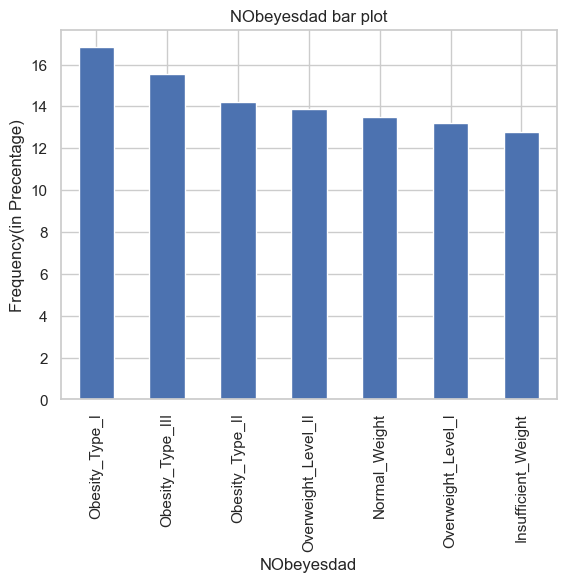

In [785]:
sns.set(style="whitegrid")
pd.options.display.float_format = "{:.2f}".format
for col in categorical_columns:
    print ("="*60)
    print ('Frequency of Categories for variable %s'%col)
    print(df[col].value_counts(normalize=True)*100)
    plt.title(f'{col} bar plot')
    plt.ylabel('Frequency(in Precentage)')
    (df[col].value_counts(normalize=True)*100).plot.bar()
    plt.show()
    print ("="*60)

In [786]:
df.NObeyesdad.value_counts(normalize=True)*100

NObeyesdad
Obesity_Type_I        16.82
Obesity_Type_III      15.52
Obesity_Type_II       14.23
Overweight_Level_II   13.90
Normal_Weight         13.51
Overweight_Level_I    13.22
Insufficient_Weight   12.79
Name: proportion, dtype: float64

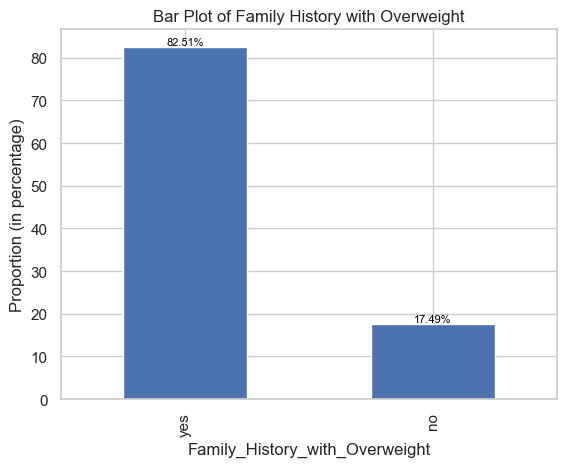

In [787]:
category_counts = df.family_history_with_overweight.value_counts(normalize=True)*100
bar_width=.05
# Plot the bar chart
ax = category_counts.plot.bar()  # You can change the color if desired
bar_width=.05
# Add percentage labels on top of each bar
for i, val in enumerate(category_counts):
    ax.text(i, val, f'{val:.2f}%', ha='center', va='bottom', fontsize=8, color='black')

# Show the plot
plt.xticks(rotation=90)  # Rotate x-axis labels for better visibility
plt.xlabel('Family_History_with_Overweight')
plt.ylabel('Proportion (in percentage)')
plt.title('Bar Plot of Family History with Overweight') # Adjust layout to prevent clipping of labels
plt.show()

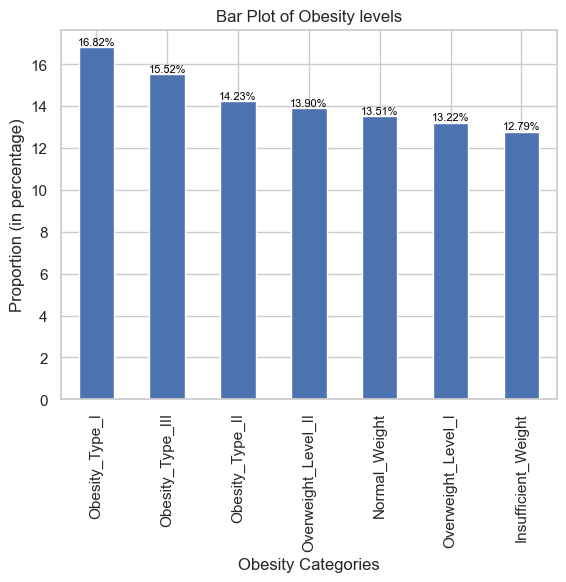

In [788]:
category_counts = df.NObeyesdad.value_counts(normalize=True)*100
bar_width=.20
# Plot the bar chart
ax = category_counts.plot.bar()  
bar_width=.20
# Add percentage labels on top of each bar
for i, val in enumerate(category_counts):
    ax.text(i, val, f'{val:.2f}%', ha='center', va='bottom', fontsize=8, color='black')

# Show the plot
plt.xticks(rotation=90)  # Rotate x-axis labels for better visibility
plt.xlabel('Obesity Categories')
plt.ylabel('Proportion (in percentage)')
plt.title('Bar Plot of Obesity levels') 
plt.show()

In [789]:
df['Gender'].value_counts()

Gender
Male      1059
Female    1028
Name: count, dtype: int64

In [790]:
import plotly.express as px

label_counts = {
    'Male': 1049,
    'Female': 1021
}

# Create a Pie chart using Plotly
fig = px.pie(values=list(label_counts.values()), names=list(label_counts.keys()), title='Label Distribution Male and Female')

fig.update_traces(textposition='inside', textinfo='percent+label+value', hole=0.5)

fig.show()

Statistical description of variable Age
count   2087.00
mean      24.36
std        6.37
min       14.00
25%       19.92
50%       22.85
75%       26.00
max       61.00
Name: Age, dtype: float64


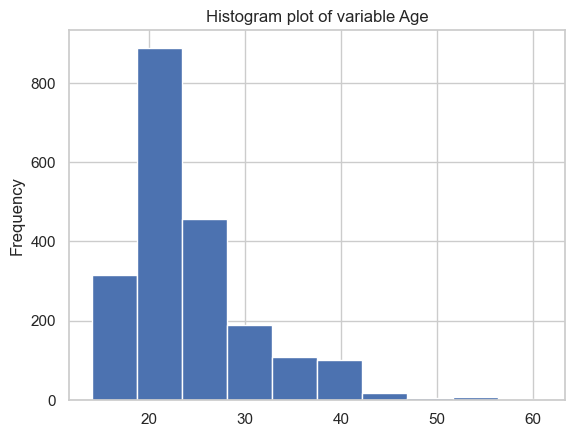

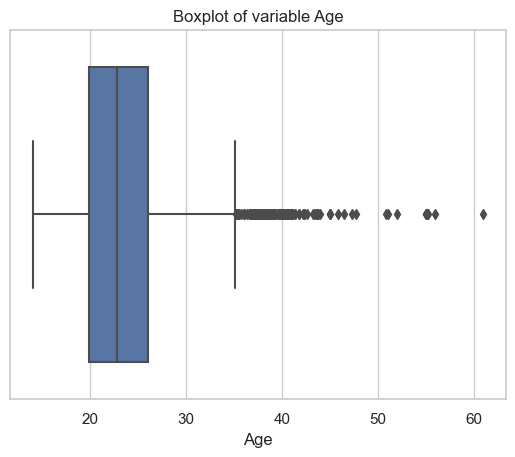

Statistical description of variable Height
count   2087.00
mean       1.70
std        0.09
min        1.45
25%        1.63
50%        1.70
75%        1.77
max        1.98
Name: Height, dtype: float64


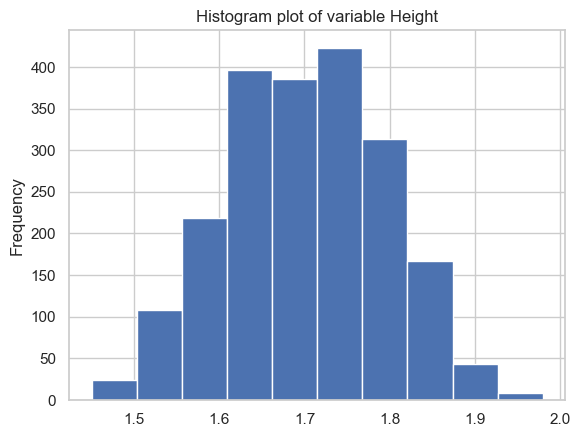

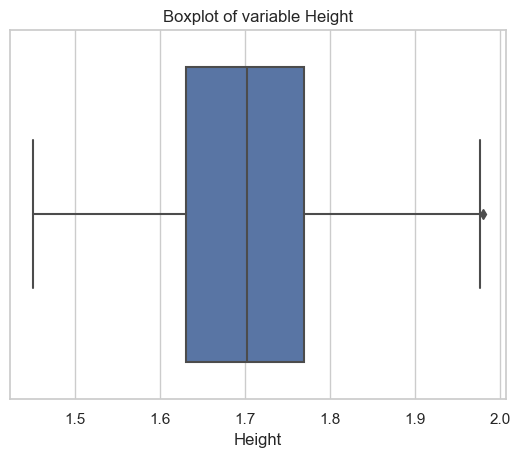

Statistical description of variable Weight
count   2087.00
mean      86.86
std       26.19
min       39.00
25%       66.00
50%       83.10
75%      108.02
max      173.00
Name: Weight, dtype: float64


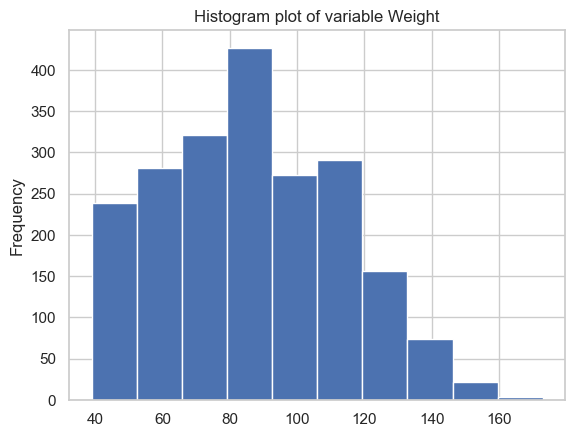

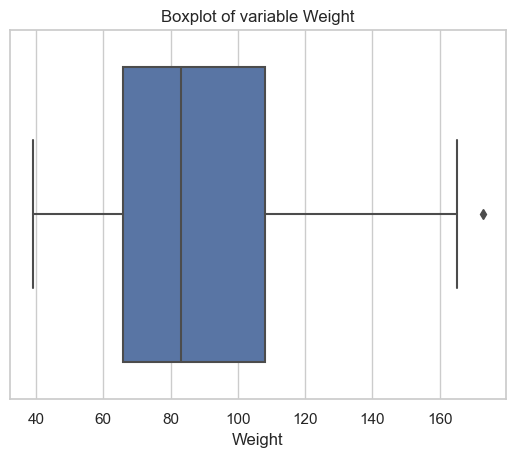

Statistical description of variable FCVC
count   2087.00
mean       2.42
std        0.53
min        1.00
25%        2.00
50%        2.40
75%        3.00
max        3.00
Name: FCVC, dtype: float64


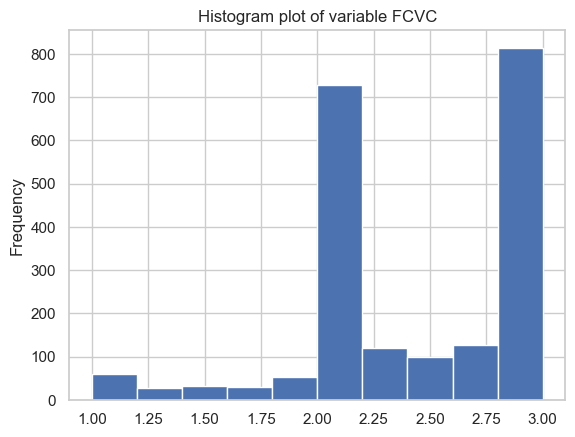

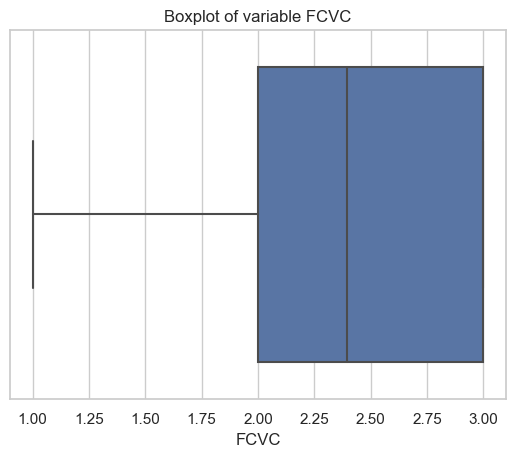

Statistical description of variable NCP
count   2087.00
mean       2.70
std        0.76
min        1.00
25%        2.70
50%        3.00
75%        3.00
max        4.00
Name: NCP, dtype: float64


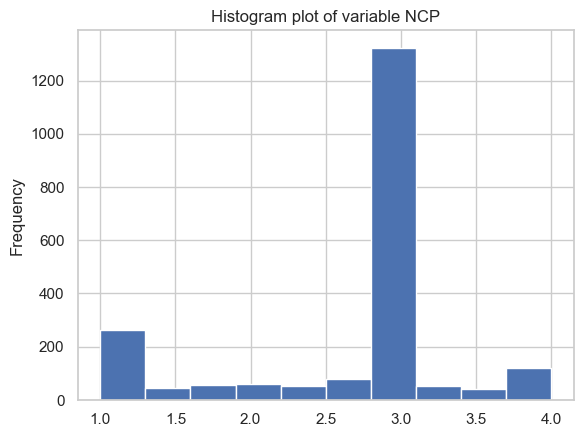

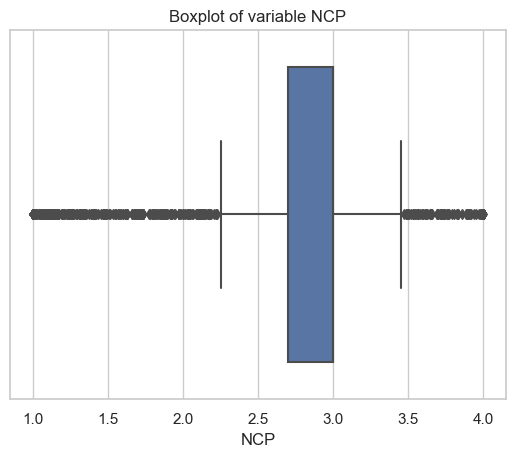

Statistical description of variable CH2O
count   2087.00
mean       2.00
std        0.61
min        1.00
25%        1.59
50%        2.00
75%        2.47
max        3.00
Name: CH2O, dtype: float64


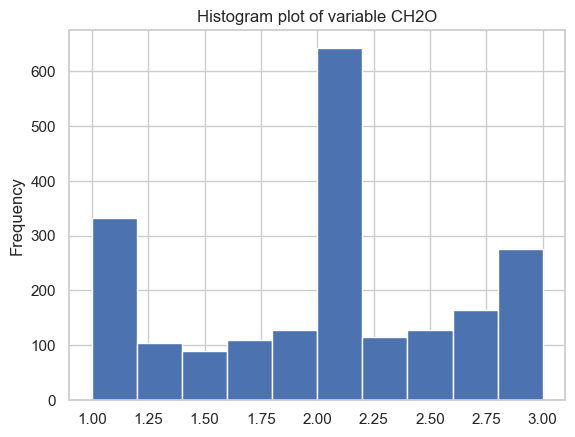

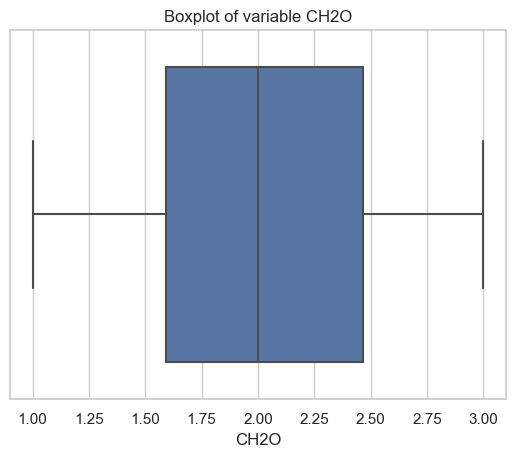

Statistical description of variable FAF
count   2087.00
mean       1.01
std        0.85
min        0.00
25%        0.12
50%        1.00
75%        1.68
max        3.00
Name: FAF, dtype: float64


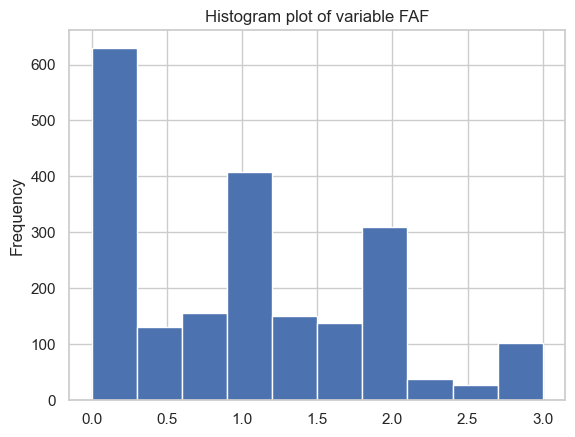

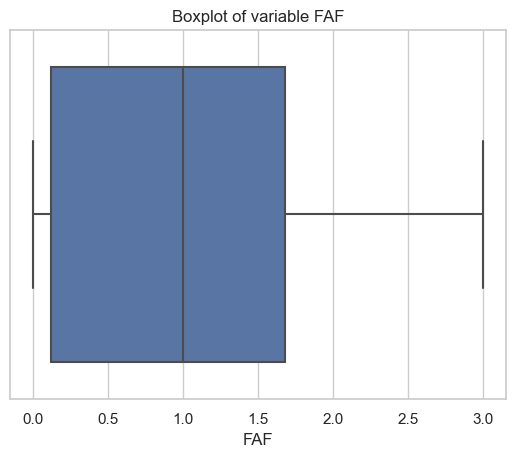

Statistical description of variable TUE
count   2087.00
mean       0.66
std        0.61
min        0.00
25%        0.00
50%        0.63
75%        1.00
max        2.00
Name: TUE, dtype: float64


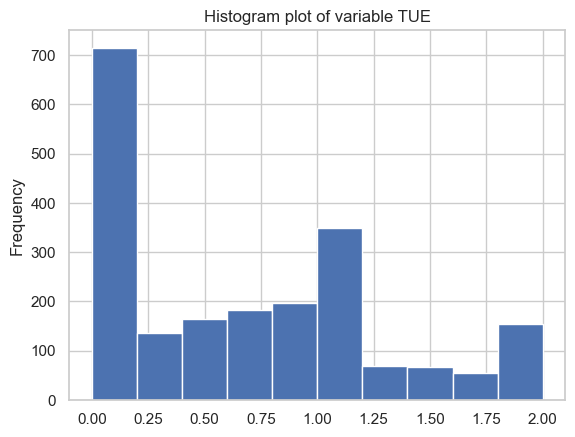

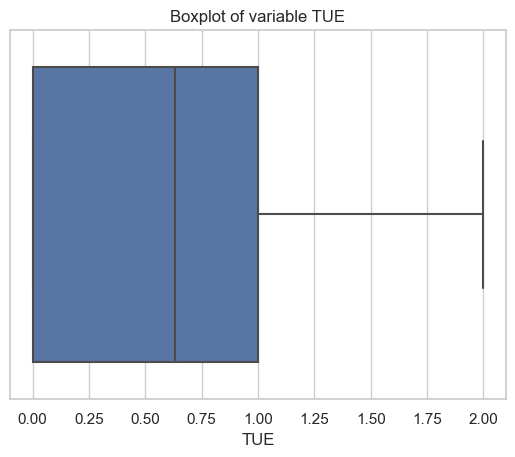

In [791]:
num_col = [x for x in df.dtypes.index if df.dtypes[x] in ['float64']]
for col in num_col:
    print ("="*60)
    print ('Statistical description of variable %s'%col)
    print(df[col].describe())
    plt.title(f'Histogram plot of variable {col}')
    df[col].hist(bins=10)
    plt.ylabel('Frequency')
    plt.show()
    plt.title(f'Boxplot of variable {col}')
    sns.boxplot(x=col,data=df)
    plt.show()
    print ("="*60)

In [792]:
num_col

['Age', 'Height', 'Weight', 'FCVC', 'NCP', 'CH2O', 'FAF', 'TUE']

**Comments: From the above plots we can visualize that**<br>

**Gender:** In the dataset, the majority of the responders are male compared to females.<br>
**Family_history_with_overweight:** 82.51% of the responders have a family history of overweight.<br>
**FAVC:** 88.36% of the responders consume high-caloric food.<br>
**CAEC:** 84.38% have confirmed 'sometimes' they consume food between meals, followed by 11.31% of responders who consume 'frequently'. Only 2% of the responders have said 'Always'.<br>
**Smoke:** 97.89% of the total responders are non-smokers.<br>
**SCC:** 95.40% do not monitor calorie consumption (daily).<br>
**CALC:** 66.12% of responders have said they 'sometimes' consume alcohol.<br>
**MTRANS:** 74.65% of the responders use public transport, followed by 21.85% who use automobiles.<br>
**NObeyesdad:** The maximum number of responders belong to the Obesity_Type_I group.<br>

**Age:** The age of responders ranges from 14 to 61 years old and has outliers in the dataset.<br>
**Height:** The height of responders ranges from 1.45 meters to 1.98 meters. It doesn't have extreme outliers.<br>
**Weight:** The weight of responders ranges from 39 kg to 173 kg. It doesn't have extreme outliers.<br>
**FCVC:** The frequency of consumption of vegetables in the meal by responders ranges from 1 to 3 with no outliers.<br>
**NCP:** The Number of main meal(daily) values range from 1 to 4 with many outliers below the lower whisker and upper whisker.<br>
**CH2O:** The consumtpion of water(daily) ranges from 1 to 3 with no outliers.<br>
**FAF:**  The Physical Activity Frequency values range from 0 to 3 with no outliers and a median at 1.<br>
**TUE:** The time spent by responders using technology device values range from 0 to 2 with no outliers.<br>

## Bivariate and Multivariate Analysis

In [793]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2087 entries, 0 to 2110
Data columns (total 17 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Gender                          2087 non-null   object 
 1   Age                             2087 non-null   float64
 2   Height                          2087 non-null   float64
 3   Weight                          2087 non-null   float64
 4   family_history_with_overweight  2087 non-null   object 
 5   FAVC                            2087 non-null   object 
 6   FCVC                            2087 non-null   float64
 7   NCP                             2087 non-null   float64
 8   CAEC                            2087 non-null   object 
 9   SMOKE                           2087 non-null   object 
 10  CH2O                            2087 non-null   float64
 11  SCC                             2087 non-null   object 
 12  FAF                             2087 no

### Numeric variable v/s Categorical variable 

#### Age by Obesity Levels

In [794]:
df.groupby("NObeyesdad").agg({"Age":["mean","median",'count']})

Age             
                     mean median count
NObeyesdad                            
Insufficient_Weight 19.77  19.21   267
Normal_Weight       21.76  21.00   282
Obesity_Type_I      25.89  22.98   351
Obesity_Type_II     28.24  27.19   297
Obesity_Type_III    23.50  25.37   324
Overweight_Level_I  23.54  21.31   276
Overweight_Level_II 27.00  24.00   290

Text(0.5, 1.0, 'Average Age by Obesity Category')

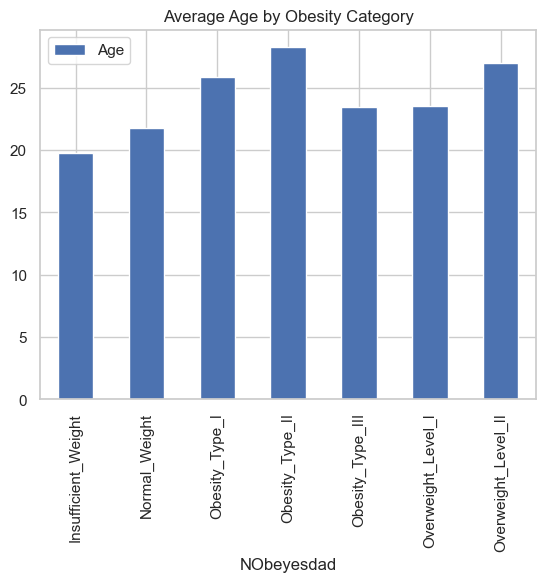

In [795]:
(df.groupby("NObeyesdad").agg({"Age":"mean"})).plot.bar()
plt.title('Average Age by Obesity Category')
#plt.legend(title='Age-Mean',bbox_to_anchor=(1.05, 1), loc='upper left')

In [796]:
ag=df.groupby('NObeyesdad')['Age'].mean()
ag

NObeyesdad
Insufficient_Weight   19.77
Normal_Weight         21.76
Obesity_Type_I        25.89
Obesity_Type_II       28.24
Obesity_Type_III      23.50
Overweight_Level_I    23.54
Overweight_Level_II   27.00
Name: Age, dtype: float64

(array([0, 1, 2, 3, 4, 5, 6]),
 [Text(0, 0, 'Normal_Weight'),
  Text(1, 0, 'Overweight_Level_I'),
  Text(2, 0, 'Overweight_Level_II'),
  Text(3, 0, 'Obesity_Type_I'),
  Text(4, 0, 'Insufficient_Weight'),
  Text(5, 0, 'Obesity_Type_II'),
  Text(6, 0, 'Obesity_Type_III')])

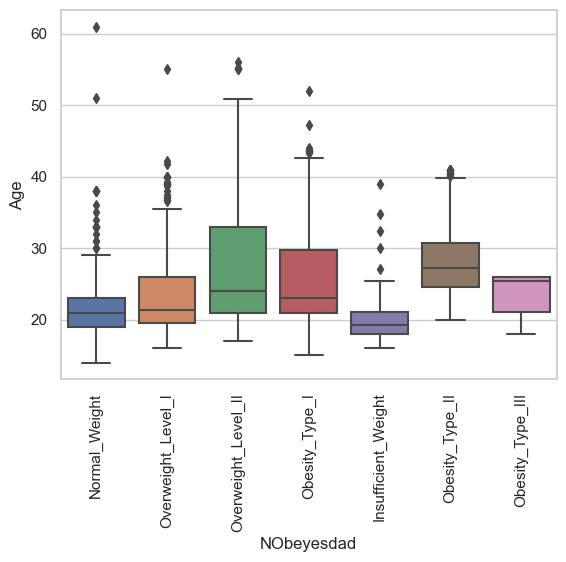

In [797]:
sns.boxplot(df,x='NObeyesdad',y='Age')
plt.xticks(rotation=90)

### Outliers

In [798]:
def outlier_detection(dftemp,var):
    sns.boxplot(x=df[var])
    mean1=df[var].mean()
    std1=df[var].std()
    Min1=mean1-3*std1
    Max1=mean1+3*std1
    print("Mean - 3 * standard deviation:",Min1,"\nMean + 3 * standard deviation:",Max1)
    if ((max(dftemp[var]) <Max1)& (min(dftemp[var])>Min1)):
        print("\nThere is no outlier in '%s' based on 'Mean and Standard Deviation Method' in the dataset that you give to this function" % var)   
    else: print("\nThere are some outliers in '%s' based on 'Mean and Standard Deviation Method' in the dataset that you give to this function" % var)   
    return dftemp[var].describe()

Mean - 3 * standard deviation: 5.248935445887625 
Mean + 3 * standard deviation: 43.46147314160632

There are some outliers in 'Age' based on 'Mean and Standard Deviation Method' in the dataset that you give to this function


count   2087.00
mean      24.36
std        6.37
min       14.00
25%       19.92
50%       22.85
75%       26.00
max       61.00
Name: Age, dtype: float64

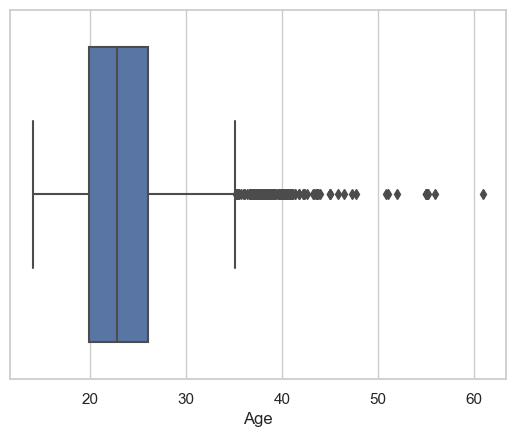

In [799]:
outlier_detection(df,"Age")

In [800]:
#lower outer fence: Q1 - 3*IQR
#upper outer fence: Q3 + 3*IQR
def outlier_analysis(col):
    Q1=df[col].quantile(0.25)
    Q3=df[col].quantile(0.75)
    IQR=Q3-Q1
    #based on Extreme Tukey method
    UOF=Q3+3*(IQR)#UOF is upper inner fence
    LOF=Q1-3*(IQR)#LOF is lower inner fence
    df_out =df[(df[col]<LOF) | (df[col]>UOF)] # I created a new data set that has just include potential outliers
    sns.distplot(df_out[col])#Plotting univariate distributions.By default, this will draw a histogram and fit a kernel density estimate (KDE)
   
    return df_out[col] .describe()

count   17.00
mean    51.09
std      4.93
min     45.00
25%     46.49
50%     51.00
75%     55.02
max     61.00
Name: Age, dtype: float64

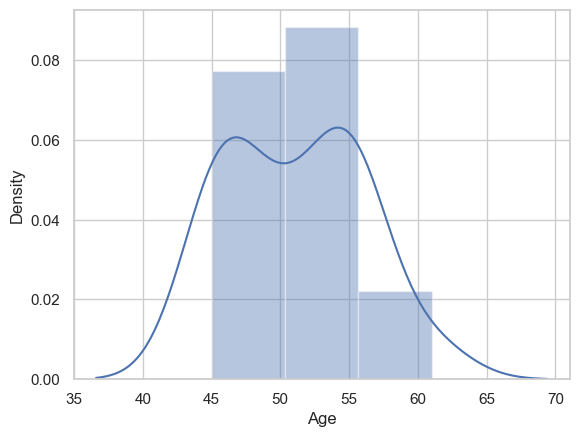

In [801]:
outlier_analysis('Age')

In [802]:
df.Age.quantile([0,0.01,0.50,0.70,0.90,0.95,0.99,1])

0.00   14.00
0.01   16.60
0.50   22.85
0.70   25.97
0.90   33.28
0.95   38.11
0.99   43.59
1.00   61.00
Name: Age, dtype: float64

In [803]:
df_nm=df[:]

In [804]:
df=df_nm[:]

In [805]:
df=df[df['Age']<45]

Mean - 3 * standard deviation: 6.441993331565129 
Mean + 3 * standard deviation: 41.8292816221063

There are some outliers in 'Age' based on 'Mean and Standard Deviation Method' in the dataset that you give to this function


count   2070.00
mean      24.14
std        5.90
min       14.00
25%       19.87
50%       22.81
75%       26.00
max       44.00
Name: Age, dtype: float64

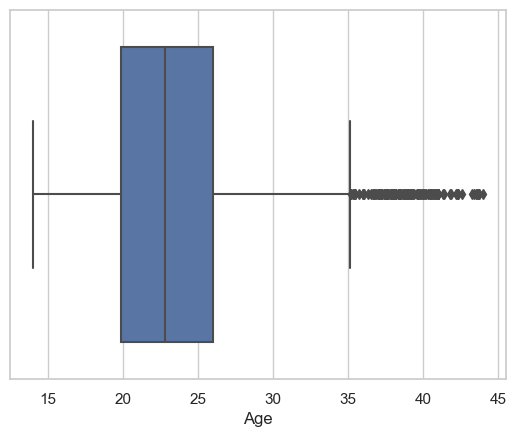

In [806]:
outlier_detection(df,"Age")

#### Normality Check 

<Axes: xlabel='Age', ylabel='Density'>

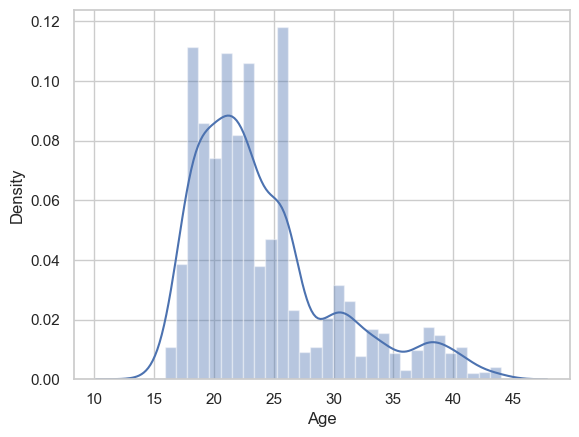

In [807]:
sns.distplot(df.Age)

In [808]:
shapiro(df.Age)

ShapiroResult(statistic=0.8893122985864346, pvalue=3.641384590634878e-36)

#### since p-value is less than 5% we reject null hypotheses and conclude that Age is not normaly distributed

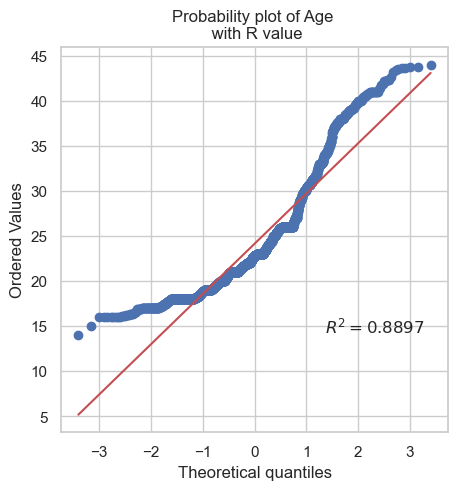

In [809]:
fig = plt.figure(figsize= (5, 5))
ax = fig.add_subplot(111)

normality_plot, stat = stats.probplot(df.Age, plot= plt, rvalue= True)
ax.set_title("Probability plot of Age \n with R value")
ax.set

plt.show()

#### Normalize Age Column

In [810]:
normalized_Age, lambda_value = stats.boxcox(df['Age'])

df['Age_norm'] = normalized_Age

print("\nAfter Normalization:")
print(df['Age_norm'].describe())


After Normalization:
count   2070.00
mean       0.68
std        0.00
min        0.68
25%        0.68
50%        0.68
75%        0.69
max        0.69
Name: Age_norm, dtype: float64


In [811]:
stats.normaltest(df.Age_norm)# after Normalizing the Age column

NormaltestResult(statistic=96.7402252993965, pvalue=9.842988715240087e-22)

<Axes: xlabel='Age_norm', ylabel='Density'>

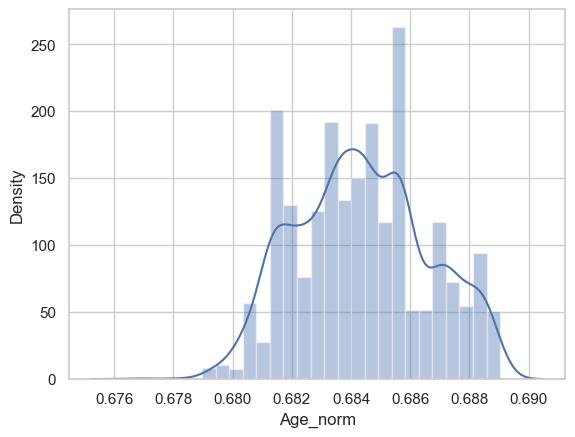

In [812]:
sns.distplot(df.Age_norm)

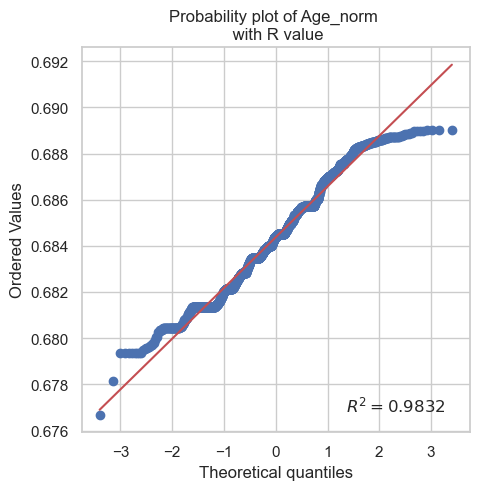

In [813]:
fig = plt.figure(figsize= (5, 5))
ax = fig.add_subplot(111)

normality_plot, stat = stats.probplot(df.Age_norm, plot= plt, rvalue= True)
ax.set_title("Probability plot of Age_norm \n with R value")
ax.set

plt.show()

#### Continuous Vs. Categorical : Here since Obesity levels have more than two levels so I will run ANOVA t test after checking its assumptions

In [814]:
df.groupby(['NObeyesdad']).agg({'Age_norm':'describe'})

Age_norm                                   
                       count mean  std  min  25%  50%  75%  max
NObeyesdad                                                     
Insufficient_Weight   267.00 0.68 0.00 0.68 0.68 0.68 0.68 0.69
Normal_Weight         280.00 0.68 0.00 0.68 0.68 0.68 0.68 0.69
Obesity_Type_I        349.00 0.68 0.00 0.68 0.68 0.68 0.69 0.69
Obesity_Type_II       297.00 0.69 0.00 0.68 0.69 0.69 0.69 0.69
Obesity_Type_III      324.00 0.68 0.00 0.68 0.68 0.69 0.69 0.69
Overweight_Level_I    275.00 0.68 0.00 0.68 0.68 0.68 0.69 0.69
Overweight_Level_II   278.00 0.69 0.00 0.68 0.68 0.68 0.69 0.69

#### We are ready to test statistically whether different category samples have a different mean using the ANOVA T-Test. 
-  H0 : no statistically significant difference among the category means
-  Ha : Atleast one population mean is different from the rest

**Assumptions:**

- Assumption 1: Samples are mutually exclusive. Assumption met
- Assumption 2: The data from each group following a normal distribution. 
- Assumption 3: All samples have the same variances (Homogeneity of Variance).
- Besides that we dont have significant outliers.

In [815]:
## Subsetting data 
Insufficient_Weight=df[df['NObeyesdad']=='Insufficient_Weight']['Age_norm']
Normal_Weight=df[df['NObeyesdad']=='Normal_Weight']['Age_norm']
Obesity_Type_I=df[df['NObeyesdad']=='Obesity_Type_I']['Age_norm']
Obesity_Type_II=df[df['NObeyesdad']=='Obesity_Type_II']['Age_norm']
Obesity_Type_III=df[df['NObeyesdad']=='Obesity_Type_III']['Age_norm']
Overweight_Level_I=df[df['NObeyesdad']=='Overweight_Level_I']['Age_norm']
Overweight_Level_II=df[df['NObeyesdad']=='Overweight_Level_II']['Age_norm']

In [816]:
#H0: Equality of Varinace
#Ha: No Equality of Variance
from scipy import stats
stats.levene(Insufficient_Weight,Normal_Weight,Obesity_Type_I,Obesity_Type_II,Obesity_Type_III,Overweight_Level_I,Overweight_Level_II)

LeveneResult(statistic=26.502812046826605, pvalue=1.5259301278549814e-30)

In [817]:
from scipy.stats import f_oneway
groups = {}
for name, group in df.groupby('NObeyesdad'):
    groups[name] = group['Age_norm'].tolist()

# Perform one-way ANOVA test
f_statistic, p_value = f_oneway(groups['Obesity_Type_I'], groups['Obesity_Type_III'], groups['Obesity_Type_II'], groups['Overweight_Level_II'], groups['Normal_Weight'], groups['Overweight_Level_I'], groups['Insufficient_Weight'])

# Print the results
print("F-statistic:", f_statistic)
print("p-value:", p_value)

# Interpret the results
if p_value < 0.05:
    print("The means of the groups are significantly different (reject the null hypothesis)")
else:
    print("The means of the groups are not significantly different (fail to reject the null hypothesis)")

F-statistic: 110.85925620690595
p-value: 2.045678515120411e-121
The means of the groups are significantly different (reject the null hypothesis)


### Height v/s Obesity Category

In [818]:
df.groupby("NObeyesdad").agg({"Height":["mean","median",'count']})

Height             
                      mean median count
NObeyesdad                             
Insufficient_Weight   1.69   1.70   267
Normal_Weight         1.68   1.66   280
Obesity_Type_I        1.69   1.68   349
Obesity_Type_II       1.77   1.77   297
Obesity_Type_III      1.69   1.67   324
Overweight_Level_I    1.69   1.70   275
Overweight_Level_II   1.70   1.70   278

Text(0.5, 1.0, 'Average Height by Obesity Category')

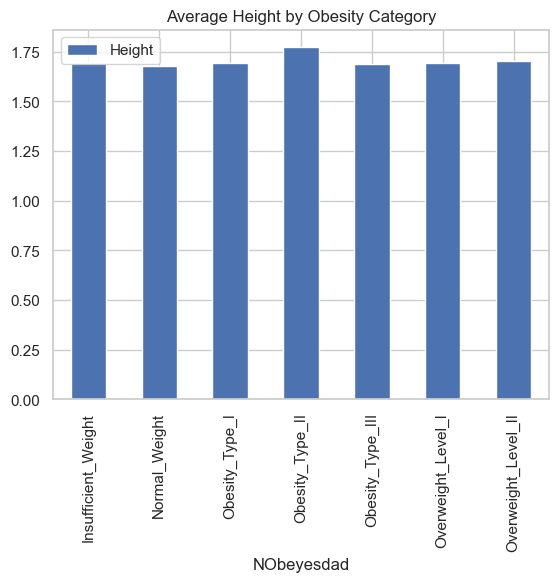

In [819]:
(df.groupby("NObeyesdad").agg({"Height":"mean"})).plot.bar()
plt.title('Average Height by Obesity Category')
#plt.legend(title='Age-Mean',bbox_to_anchor=(1.05, 1), loc='upper left')

In [820]:
ag=df.groupby('NObeyesdad')['Height'].mean()
ag

NObeyesdad
Insufficient_Weight   1.69
Normal_Weight         1.68
Obesity_Type_I        1.69
Obesity_Type_II       1.77
Obesity_Type_III      1.69
Overweight_Level_I    1.69
Overweight_Level_II   1.70
Name: Height, dtype: float64

(array([0, 1, 2, 3, 4, 5, 6]),
 [Text(0, 0, 'Normal_Weight'),
  Text(1, 0, 'Overweight_Level_I'),
  Text(2, 0, 'Overweight_Level_II'),
  Text(3, 0, 'Obesity_Type_I'),
  Text(4, 0, 'Insufficient_Weight'),
  Text(5, 0, 'Obesity_Type_II'),
  Text(6, 0, 'Obesity_Type_III')])

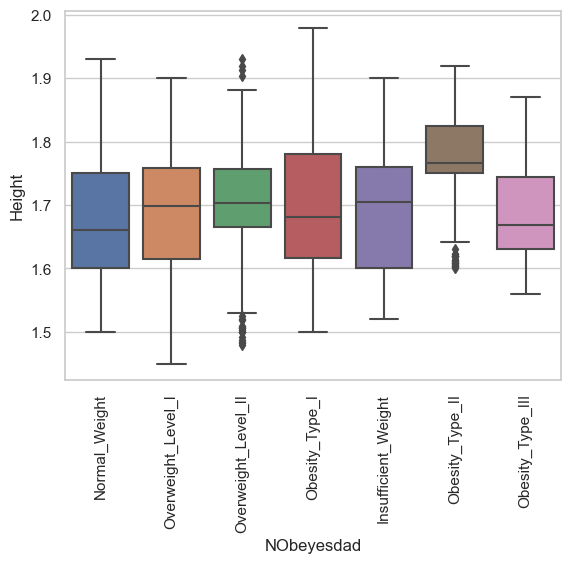

In [821]:
sns.boxplot(df,x='NObeyesdad',y='Height')
plt.xticks(rotation=90)

### Outliers

Mean - 3 * standard deviation: 1.4224484077981518 
Mean + 3 * standard deviation: 1.9830357868190238

There is no outlier in 'Height' based on 'Mean and Standard Deviation Method' in the dataset that you give to this function


count   2070.00
mean       1.70
std        0.09
min        1.45
25%        1.63
50%        1.70
75%        1.77
max        1.98
Name: Height, dtype: float64

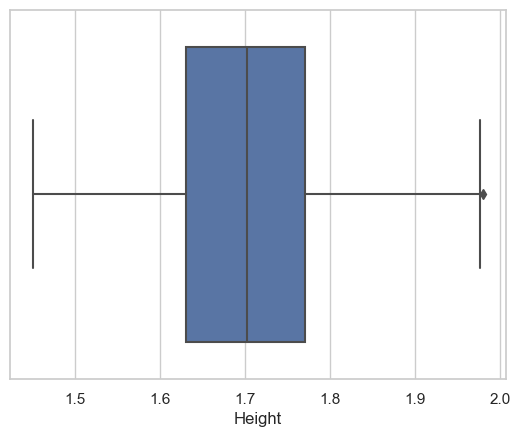

In [822]:
outlier_detection(df,"Height")

In [823]:
df.Height.quantile([0,0.01,0.50,0.70,0.90,0.95,0.99,1])

0.00   1.45
0.01   1.50
0.50   1.70
0.70   1.76
0.90   1.82
0.95   1.85
0.99   1.91
1.00   1.98
Name: Height, dtype: float64

#### Normality Check 

<Axes: xlabel='Height', ylabel='Density'>

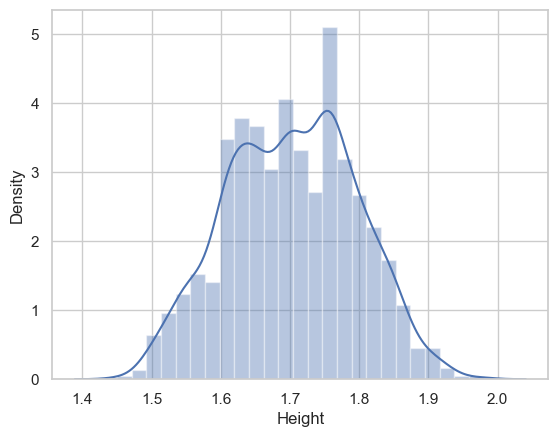

In [824]:
sns.distplot(df.Height)

In [825]:
from scipy import stats
from scipy.stats import shapiro
shapiro(df.Height)

ShapiroResult(statistic=0.9932470043718171, pvalue=3.749130631118464e-08)

#### since p-value is less than 5% we reject null hypotheses and conclude that Age is not normaly distributed

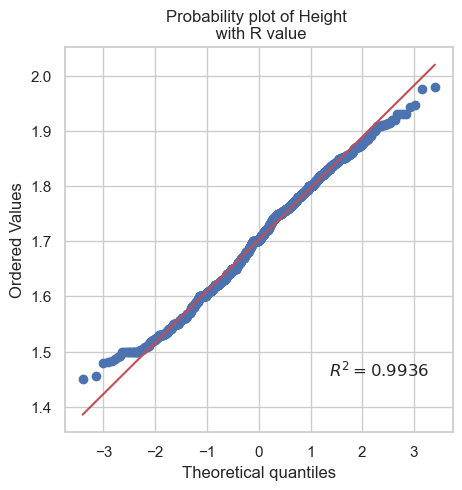

In [826]:
fig = plt.figure(figsize= (5, 5))
ax = fig.add_subplot(111)

normality_plot, stat = stats.probplot(df.Height, plot= plt, rvalue= True)
ax.set_title("Probability plot of Height \n with R value")
ax.set

plt.show()

#### Normalize Height Column

In [827]:
normalized_Age, lambda_value = stats.boxcox(df['Height'])

df['Height_norm'] = normalized_Age

print("\nAfter Normalization:")
print(df['Height_norm'].describe())


After Normalization:
count   2070.00
mean       0.73
std        0.10
min        0.46
25%        0.65
50%        0.73
75%        0.80
max        1.03
Name: Height_norm, dtype: float64


In [828]:
shapiro(df.Height_norm)# after Normalizing the Age column

ShapiroResult(statistic=0.9932936303915817, pvalue=4.134536847834865e-08)

<Axes: xlabel='Height_norm', ylabel='Density'>

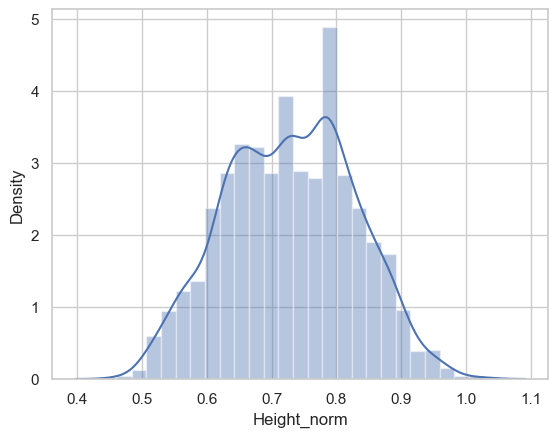

In [829]:
sns.distplot(df.Height_norm)

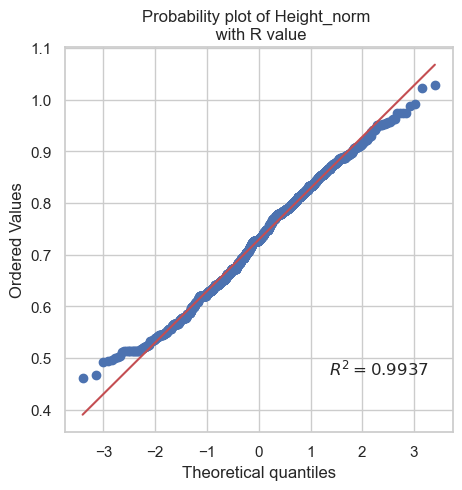

In [830]:
fig = plt.figure(figsize= (5, 5))
ax = fig.add_subplot(111)

normality_plot, stat = stats.probplot(df.Height_norm, plot= plt, rvalue= True)
ax.set_title("Probability plot of Height_norm \n with R value")
ax.set

plt.show()

We have used boxcox transformation method to normalize Height column. 

#### Continuous Vs. Categorical : Here since Obesity levels have more than two levels so I will run ANOVA t test after checking its assumptions

In [831]:
df.groupby(['NObeyesdad']).agg({'Height_norm':'describe'})

Height_norm                                   
                          count mean  std  min  25%  50%  75%  max
NObeyesdad                                                        
Insufficient_Weight      267.00 0.72 0.10 0.53 0.62 0.73 0.79 0.94
Normal_Weight            280.00 0.70 0.10 0.51 0.62 0.68 0.78 0.97
Obesity_Type_I           349.00 0.72 0.11 0.51 0.64 0.71 0.81 1.03
Obesity_Type_II          297.00 0.80 0.08 0.62 0.78 0.80 0.86 0.96
Obesity_Type_III         324.00 0.71 0.07 0.58 0.65 0.69 0.77 0.91
Overweight_Level_I       275.00 0.72 0.10 0.46 0.63 0.72 0.79 0.94
Overweight_Level_II      278.00 0.73 0.10 0.49 0.69 0.73 0.79 0.97

#### We are ready to test statistically whether different category samples have a different mean using the ANOVA T-Test. 
-  H0 : no statistically significant difference among the category means
-  Ha : Atleast one population mean is different from the rest

Assumptions:

Assumption 1: Samples are mutually exclusive. Assumption met
Assumption 2: The data from each group following a normal distribution. 
Assumption 3: All samples have the same variances (Homogeneity of Variance).
Besides that we dont have significant outliers.

In [832]:
## Subsetting data 
Insufficient_Weight=df[df['NObeyesdad']=='Insufficient_Weight']['Height_norm']
Normal_Weight=df[df['NObeyesdad']=='Normal_Weight']['Height_norm']
Obesity_Type_I=df[df['NObeyesdad']=='Obesity_Type_I']['Height_norm']
Obesity_Type_II=df[df['NObeyesdad']=='Obesity_Type_II']['Height_norm']
Obesity_Type_III=df[df['NObeyesdad']=='Obesity_Type_III']['Height_norm']
Overweight_Level_I=df[df['NObeyesdad']=='Overweight_Level_I']['Height_norm']
Overweight_Level_II=df[df['NObeyesdad']=='Overweight_Level_II']['Height_norm']

In [833]:
#H0: Equality of Varinace
#Ha: No Equality of Variance
from scipy import stats
stats.levene(Insufficient_Weight,Normal_Weight,Obesity_Type_I,Obesity_Type_II,Obesity_Type_III,Overweight_Level_I,Overweight_Level_II)

LeveneResult(statistic=16.665264317411456, pvalue=7.434228239298552e-19)

In [834]:
.10/.07

1.4285714285714286

### Since the ratio of the sample standard deviations falls within 0.5 to 2, then it may be that the assumption is not violated.

In [835]:
from scipy.stats import f_oneway
groups = {}
for name, group in df.groupby('NObeyesdad'):
    groups[name] = group['Height_norm'].tolist()

# Perform one-way ANOVA test
f_statistic, p_value = f_oneway(groups['Obesity_Type_I'], groups['Obesity_Type_III'], groups['Obesity_Type_II'], groups['Overweight_Level_II'], groups['Normal_Weight'], groups['Overweight_Level_I'], groups['Insufficient_Weight'])

# Print the results
print("F-statistic:", f_statistic)
print("p-value:", p_value)

# Interpret the results
if p_value < 0.05:
    print("The means of the groups are significantly different (reject the null hypothesis)")
else:
    print("The means of the groups are not significantly different (fail to reject the null hypothesis)")

F-statistic: 37.170805743090085
p-value: 5.338952846352676e-43
The means of the groups are significantly different (reject the null hypothesis)


In [836]:
from statsmodels.stats.multicomp import MultiComparison
mul_comp = MultiComparison(df['Height_norm'],df['NObeyesdad'])
mul_result = mul_comp.tukeyhsd()
print(mul_result)

             Multiple Comparison of Means - Tukey HSD, FWER=0.05              
       group1              group2       meandiff p-adj   lower   upper  reject
------------------------------------------------------------------------------
Insufficient_Weight       Normal_Weight  -0.0173 0.3333 -0.0413  0.0066  False
Insufficient_Weight      Obesity_Type_I   0.0004    1.0 -0.0224  0.0232  False
Insufficient_Weight     Obesity_Type_II   0.0835    0.0  0.0599  0.1072   True
Insufficient_Weight    Obesity_Type_III  -0.0066 0.9801 -0.0298  0.0165  False
Insufficient_Weight  Overweight_Level_I  -0.0028 0.9999 -0.0269  0.0212  False
Insufficient_Weight Overweight_Level_II   0.0108 0.8386 -0.0132  0.0348  False
      Normal_Weight      Obesity_Type_I   0.0177 0.2307 -0.0047  0.0402  False
      Normal_Weight     Obesity_Type_II   0.1009    0.0  0.0775  0.1242   True
      Normal_Weight    Obesity_Type_III   0.0107 0.8123 -0.0122  0.0335  False
      Normal_Weight  Overweight_Level_I   0.0145 0.5

# Weight v/s Obesity Category

In [837]:
weight_gen=df.groupby(["NObeyesdad",'Gender']).agg({"Weight":["mean"]})
weight_gen

Weight
                             mean
NObeyesdad          Gender       
Insufficient_Weight Female  46.80
                    Male    55.56
Normal_Weight       Female  56.22
                    Male    67.45
Obesity_Type_I      Female  82.30
                    Male   101.21
Obesity_Type_II     Female  96.75
                    Male   115.43
Obesity_Type_III    Female 120.78
                    Male   173.00
Overweight_Level_I  Female  69.58
                    Male    79.89
Overweight_Level_II Female  74.27
                    Male    86.32

In [838]:
pivot_df = pd.pivot_table(weight_gen,index='NObeyesdad', columns='Gender', values='Weight')
pivot_df

mean       
Gender              Female   Male
NObeyesdad                       
Insufficient_Weight  46.80  55.56
Normal_Weight        56.22  67.45
Obesity_Type_I       82.30 101.21
Obesity_Type_II      96.75 115.43
Obesity_Type_III    120.78 173.00
Overweight_Level_I   69.58  79.89
Overweight_Level_II  74.27  86.32

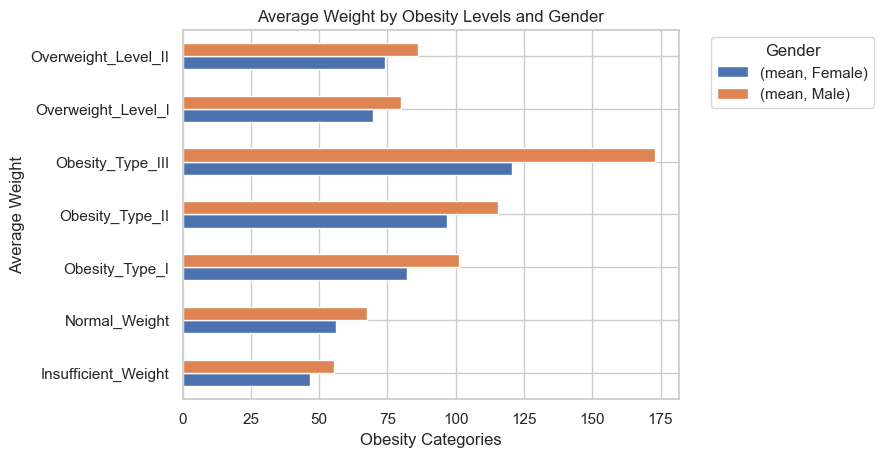

In [839]:
sns.set(style="whitegrid")
pivot_df.plot.barh()

plt.xlabel('Obesity Categories')
plt.ylabel('Average Weight')
plt.title('Average Weight by Obesity Levels and Gender')
plt.legend(title='Gender',bbox_to_anchor=(1.05, 1),loc='upper left')
plt.show()

(df.groupby(["NObeyesdad",'Gender']).agg({"Weight":"mean"})).plot(kind='bar',stacked=True)
plt.title('Average Weight by Obesity Category')
plt.ylabel('Average Weight')
#plt.legend(title='Age-Mean',bbox_to_anchor=(1.05, 1), loc='upper left')

In [840]:
ag=df.groupby('NObeyesdad')['Weight'].mean()
ag

NObeyesdad
Insufficient_Weight    50.01
Normal_Weight          62.20
Obesity_Type_I         92.92
Obesity_Type_II       115.31
Obesity_Type_III      120.94
Overweight_Level_I     74.45
Overweight_Level_II    82.07
Name: Weight, dtype: float64

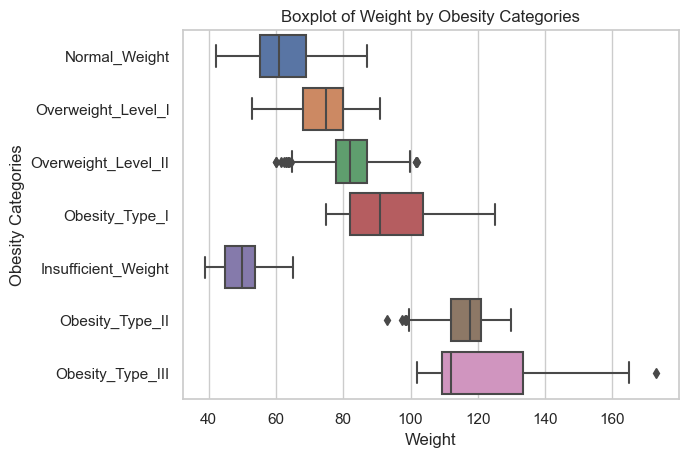

In [841]:
sns.boxplot(data=df, y='NObeyesdad', x='Weight', orient='h')
plt.xlabel('Weight')
plt.ylabel('Obesity Categories')
plt.title('Boxplot of Weight by Obesity Categories')
plt.show()

### Outliers

Mean - 3 * standard deviation: 8.084674402780507 
Mean + 3 * standard deviation: 165.75092774728174

There are some outliers in 'Weight' based on 'Mean and Standard Deviation Method' in the dataset that you give to this function


count   2070.00
mean      86.92
std       26.28
min       39.00
25%       65.45
50%       83.18
75%      108.14
max      173.00
Name: Weight, dtype: float64

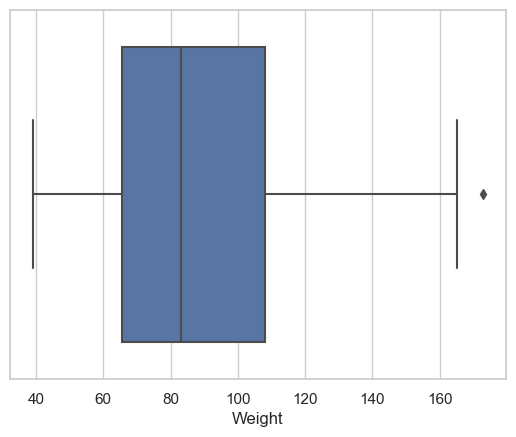

In [842]:
outlier_detection(df,"Weight")

In [843]:
df.Weight.quantile([0,0.01,0.50,0.70,0.90,0.95,0.99,1])

0.00    39.00
0.01    41.99
0.50    83.18
0.70   104.77
0.90   121.00
0.95   132.09
0.99   150.42
1.00   173.00
Name: Weight, dtype: float64

We just have 1 value as extreme outlier in "Weight" column, we will go ahaed with it .

#### Normality Check 

<Axes: xlabel='Weight', ylabel='Density'>

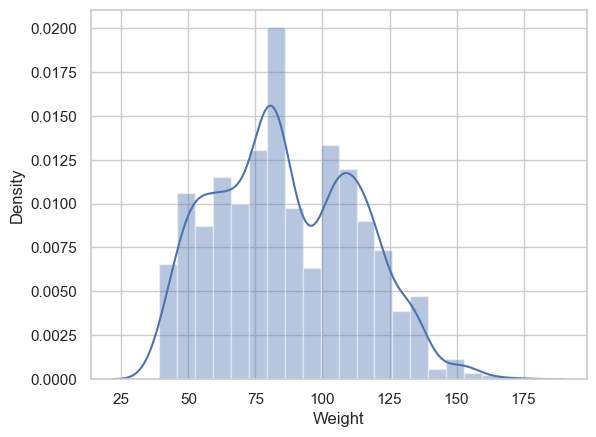

In [844]:
sns.distplot(df.Weight)

In [845]:
shapiro(df.Weight)

ShapiroResult(statistic=0.9766262316748888, pvalue=6.642564314669186e-18)

#### since p-value is less than 5% we reject null hypotheses and conclude that Age is not normaly distributed

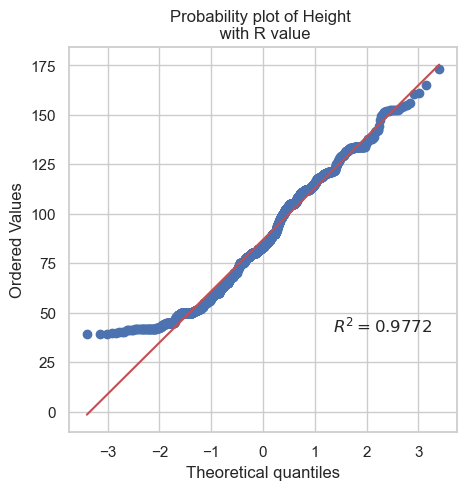

In [846]:
fig = plt.figure(figsize= (5, 5))
ax = fig.add_subplot(111)

normality_plot, stat = stats.probplot(df.Weight, plot= plt, rvalue= True)
ax.set_title("Probability plot of Height \n with R value")
ax.set

plt.show()

#### Normalize Height Column

In [847]:
normalized_Age, lambda_value = stats.boxcox(df['Weight'])

df['Weight_norm'] = normalized_Age

print("\nAfter Normalization:")
print(df['Weight_norm'].describe())


After Normalization:
count   2070.00
mean      15.63
std        2.65
min       10.09
25%       13.55
50%       15.46
75%       17.84
max       22.91
Name: Weight_norm, dtype: float64


In [848]:
shapiro(df.Weight_norm)# after Normalizing the Weight column

ShapiroResult(statistic=0.9806096221479854, pvalue=3.652284781609325e-16)

<Axes: xlabel='Weight_norm', ylabel='Density'>

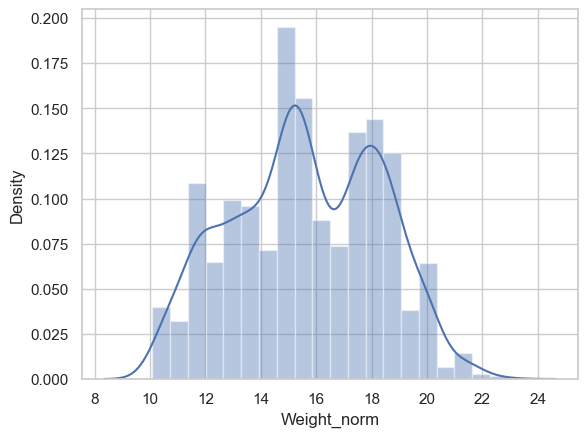

In [849]:
sns.distplot(df.Weight_norm)

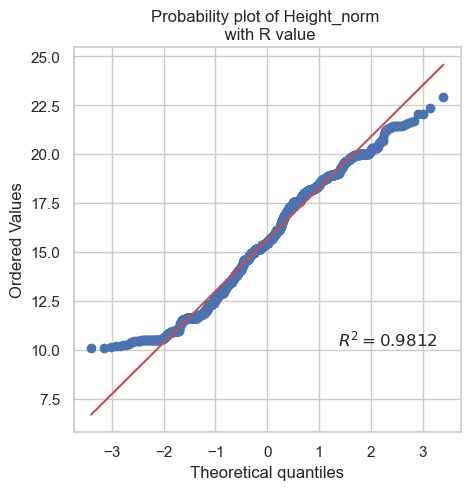

In [850]:
fig = plt.figure(figsize= (5, 5))
ax = fig.add_subplot(111)

normality_plot, stat = stats.probplot(df.Weight_norm, plot= plt, rvalue= True)
ax.set_title("Probability plot of Height_norm \n with R value")
ax.set

plt.show()

#### Continuous Vs. Categorical : Here since Obesity levels have more than two levels so I will run ANOVA t test after checking its assumptions

In [851]:
df.groupby(['NObeyesdad']).agg({'Weight_norm':'describe'})

Weight_norm                                         
                          count  mean  std   min   25%   50%   75%   max
NObeyesdad                                                              
Insufficient_Weight      267.00 11.62 0.79 10.09 10.93 11.64 12.13 13.49
Normal_Weight            280.00 13.12 1.10 10.58 12.32 13.02 13.95 15.85
Obesity_Type_I           349.00 16.39 1.10 14.61 15.36 16.24 17.44 19.28
Obesity_Type_II          297.00 18.45 0.70 16.44 18.18 18.68 18.93 19.69
Obesity_Type_III         324.00 18.90 1.28 17.28 17.96 18.18 19.97 22.91
Overweight_Level_I       275.00 14.52 0.94 12.03 13.84 14.61 15.14 16.24
Overweight_Level_II      278.00 15.33 0.89 12.90 14.93 15.34 15.85 17.28

#### We are ready to test statistically whether different category samples have a different mean using the ANOVA T-Test. 
-  H0 : no statistically significant difference among the category means
-  Ha : Atleast one population mean is different from the rest

Assumptions:

Assumption 1: Samples are mutually exclusive. Assumption met
Assumption 2: The data from each group following a normal distribution. 
Assumption 3: All samples have the same variances (Homogeneity of Variance).
Besides that we dont have significant outliers.

In [852]:
## Subsetting data 
Insufficient_Weight=df[df['NObeyesdad']=='Insufficient_Weight']['Weight_norm']
Normal_Weight=df[df['NObeyesdad']=='Normal_Weight']['Weight_norm']
Obesity_Type_I=df[df['NObeyesdad']=='Obesity_Type_I']['Weight_norm']
Obesity_Type_II=df[df['NObeyesdad']=='Obesity_Type_II']['Weight_norm']
Obesity_Type_III=df[df['NObeyesdad']=='Obesity_Type_III']['Weight_norm']
Overweight_Level_I=df[df['NObeyesdad']=='Overweight_Level_I']['Weight_norm']
Overweight_Level_II=df[df['NObeyesdad']=='Overweight_Level_II']['Weight_norm']

In [853]:
#H0: Equality of Varinace
#Ha: No Equality of Variance

stats.levene(Insufficient_Weight,Normal_Weight,Obesity_Type_I,Obesity_Type_II,Obesity_Type_III,Overweight_Level_I,Overweight_Level_II)

LeveneResult(statistic=29.036753024055038, pvalue=1.589443258354685e-33)

In [854]:
1.28/.70

1.8285714285714287

### Since the ratio of the sample standard deviations falls within 0.5 to 2, then it may be that the assumption is not violated.

In [855]:
from scipy.stats import f_oneway
groups = {}
for name, group in df.groupby('NObeyesdad'):
    groups[name] = group['Weight_norm'].tolist()

# Perform one-way ANOVA test
f_statistic, p_value = f_oneway(groups['Obesity_Type_I'], groups['Obesity_Type_III'], groups['Obesity_Type_II'], groups['Overweight_Level_II'], groups['Normal_Weight'], groups['Overweight_Level_I'], groups['Insufficient_Weight'])

# Print the results
print("F-statistic:", f_statistic)
print("p-value:", p_value)

# Interpret the results
if p_value < 0.05:
    print("The means of the groups are significantly different (reject the null hypothesis)")
else:
    print("The means of the groups are not significantly different (fail to reject the null hypothesis)")

F-statistic: 2076.269058214888
p-value: 0.0
The means of the groups are significantly different (reject the null hypothesis)


In [856]:
from statsmodels.stats.multicomp import MultiComparison
mul_comp = MultiComparison(df['Weight_norm'],df['NObeyesdad'])
mul_result = mul_comp.tukeyhsd()
print(mul_result)

             Multiple Comparison of Means - Tukey HSD, FWER=0.05             
       group1              group2       meandiff p-adj  lower   upper  reject
-----------------------------------------------------------------------------
Insufficient_Weight       Normal_Weight    1.506   0.0  1.2536  1.7584   True
Insufficient_Weight      Obesity_Type_I   4.7767   0.0  4.5368  5.0166   True
Insufficient_Weight     Obesity_Type_II    6.833   0.0  6.5842  7.0819   True
Insufficient_Weight    Obesity_Type_III   7.2832   0.0  7.0393  7.5271   True
Insufficient_Weight  Overweight_Level_I   2.9041   0.0  2.6505  3.1576   True
Insufficient_Weight Overweight_Level_II   3.7094   0.0  3.4566  3.9623   True
      Normal_Weight      Obesity_Type_I   3.2707   0.0   3.034  3.5075   True
      Normal_Weight     Obesity_Type_II    5.327   0.0  5.0812  5.5728   True
      Normal_Weight    Obesity_Type_III   5.7772   0.0  5.5364  6.0179   True
      Normal_Weight  Overweight_Level_I   1.3981   0.0  1.1475  

# FCVC ( Frequency Concumption of Vegetables) v/s Obesity Category

In [857]:
df.FCVC.nunique()

805

In [858]:
df.groupby("NObeyesdad").agg({"FCVC":["mean","median",'count']})

FCVC             
                    mean median count
NObeyesdad                           
Insufficient_Weight 2.47   2.70   267
Normal_Weight       2.33   2.00   280
Obesity_Type_I      2.18   2.00   349
Obesity_Type_II     2.39   2.43   297
Obesity_Type_III    3.00   3.00   324
Overweight_Level_I  2.28   2.03   275
Overweight_Level_II 2.26   2.00   278

Text(0.5, 1.0, 'Average FCVC by Obesity Category')

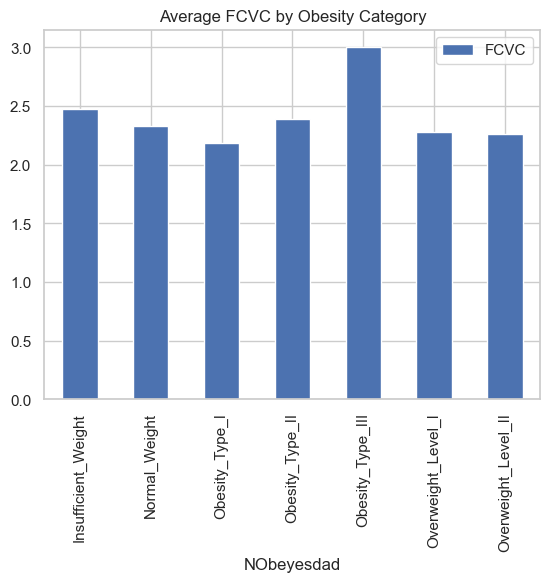

In [859]:
(df.groupby("NObeyesdad").agg({"FCVC":"mean"})).plot.bar()
plt.title('Average FCVC by Obesity Category')
#plt.legend(title='Age-Mean',bbox_to_anchor=(1.05, 1), loc='upper left')

In [860]:
ag=df.groupby('NObeyesdad')['FCVC'].mean()
ag

NObeyesdad
Insufficient_Weight   2.47
Normal_Weight         2.33
Obesity_Type_I        2.18
Obesity_Type_II       2.39
Obesity_Type_III      3.00
Overweight_Level_I    2.28
Overweight_Level_II   2.26
Name: FCVC, dtype: float64

(array([0, 1, 2, 3, 4, 5, 6]),
 [Text(0, 0, 'Normal_Weight'),
  Text(1, 0, 'Overweight_Level_I'),
  Text(2, 0, 'Overweight_Level_II'),
  Text(3, 0, 'Obesity_Type_I'),
  Text(4, 0, 'Insufficient_Weight'),
  Text(5, 0, 'Obesity_Type_II'),
  Text(6, 0, 'Obesity_Type_III')])

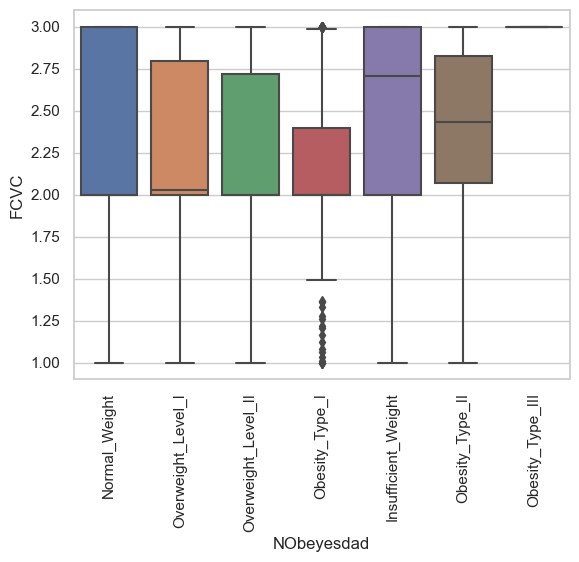

In [861]:
sns.boxplot(df,x='NObeyesdad',y='FCVC')
plt.xticks(rotation=90)

### Outliers

Mean - 3 * standard deviation: 0.8155387583410536 
Mean + 3 * standard deviation: 4.0281542793401055

There is no outlier in 'FCVC' based on 'Mean and Standard Deviation Method' in the dataset that you give to this function


count   2070.00
mean       2.42
std        0.54
min        1.00
25%        2.00
50%        2.40
75%        3.00
max        3.00
Name: FCVC, dtype: float64

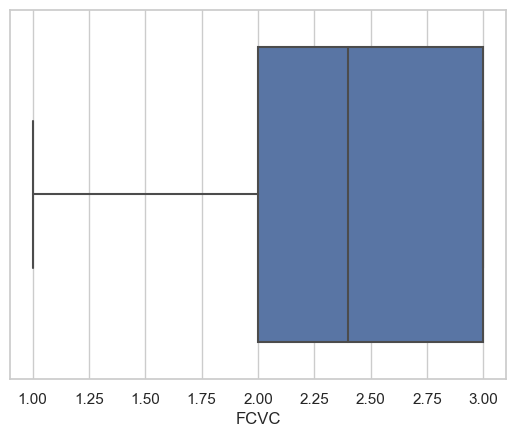

In [862]:
outlier_detection(df,"FCVC")

In [863]:
df.FCVC.quantile([0,0.01,0.50,0.70,0.90,0.95,0.99,1])

0.00   1.00
0.01   1.00
0.50   2.40
0.70   3.00
0.90   3.00
0.95   3.00
0.99   3.00
1.00   3.00
Name: FCVC, dtype: float64

#### Normality Check 

<Axes: xlabel='FCVC', ylabel='Density'>

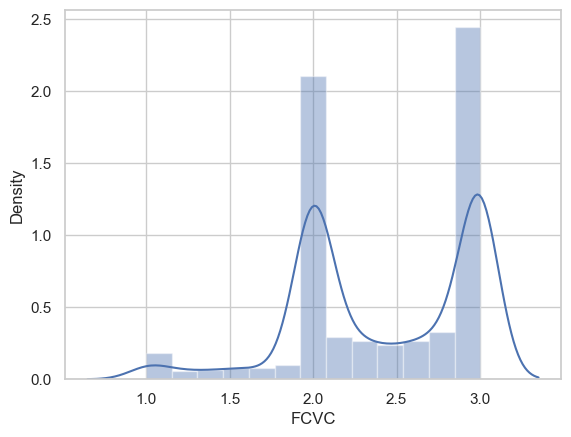

In [864]:
sns.distplot(df.FCVC)

In [865]:
shapiro(df.FCVC)

ShapiroResult(statistic=0.845799260156795, pvalue=6.216237383235522e-41)

#### since p-value is less than 5% we reject null hypotheses and conclude that FCVC is not normaly distributed . But as per CLT (N>30) we can conclude that the data is normally distributed.

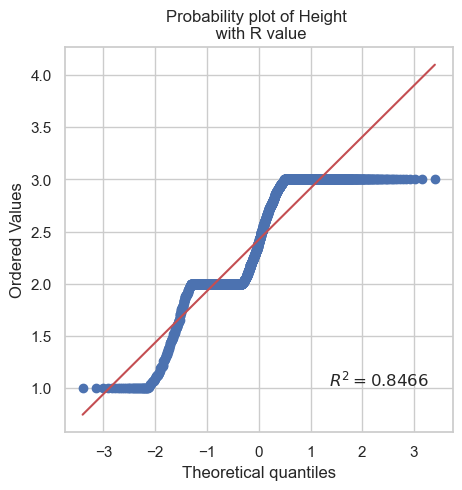

In [866]:
fig = plt.figure(figsize= (5, 5))
ax = fig.add_subplot(111)

normality_plot, stat = stats.probplot(df.FCVC, plot= plt, rvalue= True)
ax.set_title("Probability plot of Height \n with R value")
ax.set

plt.show()

#### Continuous Vs. Categorical : Here since Obesity levels have more than two levels so I will run ANOVA t test after checking its assumptions

In [867]:
df.groupby(['NObeyesdad']).agg({'FCVC':'describe'})

FCVC                                   
                     count mean  std  min  25%  50%  75%  max
NObeyesdad                                                   
Insufficient_Weight 267.00 2.47 0.59 1.00 2.00 2.70 3.00 3.00
Normal_Weight       280.00 2.33 0.59 1.00 2.00 2.00 3.00 3.00
Obesity_Type_I      349.00 2.18 0.43 1.00 2.00 2.00 2.40 3.00
Obesity_Type_II     297.00 2.39 0.49 1.00 2.07 2.43 2.83 3.00
Obesity_Type_III    324.00 3.00 0.00 3.00 3.00 3.00 3.00 3.00
Overweight_Level_I  275.00 2.28 0.49 1.00 2.00 2.03 2.80 3.00
Overweight_Level_II 278.00 2.26 0.46 1.00 2.00 2.00 2.72 3.00

#### We are ready to test statistically whether different category samples have a different mean using the ANOVA T-Test. 
-  H0 : no statistically significant difference among the category means
-  Ha : Atleast one population mean is different from the rest

Assumptions:

Assumption 1: Samples are mutually exclusive. Assumption met
Assumption 2: The data from each group following a normal distribution. 
Assumption 3: All samples have the same variances (Homogeneity of Variance).
Besides that we dont have significant outliers.

In [868]:
## Subsetting data 
Insufficient_Weight=df[df['NObeyesdad']=='Insufficient_Weight']['FCVC']
Normal_Weight=df[df['NObeyesdad']=='Normal_Weight']['FCVC']
Obesity_Type_I=df[df['NObeyesdad']=='Obesity_Type_I']['FCVC']
Obesity_Type_II=df[df['NObeyesdad']=='Obesity_Type_II']['FCVC']
Obesity_Type_III=df[df['NObeyesdad']=='Obesity_Type_III']['FCVC']
Overweight_Level_I=df[df['NObeyesdad']=='Overweight_Level_I']['FCVC']
Overweight_Level_II=df[df['NObeyesdad']=='Overweight_Level_II']['FCVC']

In [869]:
#H0: Equality of Varinace
#Ha: No Equality of Variance
from scipy import stats
stats.levene(Insufficient_Weight,Normal_Weight,Obesity_Type_I,Obesity_Type_II,Obesity_Type_III,Overweight_Level_I,Overweight_Level_II)

LeveneResult(statistic=61.60856822082552, pvalue=1.8190611834007632e-70)

In [870]:
from scipy.stats import f_oneway
groups = {}
for name, group in df.groupby('NObeyesdad'):
    groups[name] = group['FCVC'].tolist()

# Perform one-way ANOVA test
f_statistic, p_value = f_oneway(groups['Obesity_Type_I'], groups['Obesity_Type_III'], groups['Obesity_Type_II'], groups['Overweight_Level_II'], groups['Normal_Weight'], groups['Overweight_Level_I'], groups['Insufficient_Weight'])

# Print the results
print("F-statistic:", f_statistic)
print("p-value:", p_value)

# Interpret the results
if p_value < 0.05:
    print("The means of the groups are significantly different (reject the null hypothesis)")
else:
    print("The means of the groups are not significantly different (fail to reject the null hypothesis)")

F-statistic: 110.40686072295361
p-value: 5.676679512171333e-121
The means of the groups are significantly different (reject the null hypothesis)


In [871]:
mul_comp = MultiComparison(df['FCVC'],df['NObeyesdad'])
mul_result = mul_comp.tukeyhsd()
print(mul_result)

             Multiple Comparison of Means - Tukey HSD, FWER=0.05              
       group1              group2       meandiff p-adj   lower   upper  reject
------------------------------------------------------------------------------
Insufficient_Weight       Normal_Weight  -0.1427 0.0066 -0.2604 -0.0249   True
Insufficient_Weight      Obesity_Type_I  -0.2907    0.0 -0.4026 -0.1787   True
Insufficient_Weight     Obesity_Type_II  -0.0835 0.3393 -0.1996  0.0326  False
Insufficient_Weight    Obesity_Type_III   0.5252    0.0  0.4114   0.639   True
Insufficient_Weight  Overweight_Level_I  -0.1994    0.0 -0.3177 -0.0811   True
Insufficient_Weight Overweight_Level_II  -0.2114    0.0 -0.3294 -0.0934   True
      Normal_Weight      Obesity_Type_I   -0.148 0.0015 -0.2585 -0.0375   True
      Normal_Weight     Obesity_Type_II   0.0591 0.7317 -0.0555  0.1738  False
      Normal_Weight    Obesity_Type_III   0.6679    0.0  0.5555  0.7802   True
      Normal_Weight  Overweight_Level_I  -0.0567 0.7

# NCP v/s Obesity Category

In [872]:
df.NCP.value_counts()

NCP
3.00    1185
1.00     178
4.00      68
2.78       2
3.99       2
        ... 
2.76       1
3.05       1
3.12       1
3.34       1
1.09       1
Name: count, Length: 634, dtype: int64

In [873]:
df.groupby("NObeyesdad").agg({"NCP":["mean","median",'count']})

NCP             
                    mean median count
NObeyesdad                           
Insufficient_Weight 2.94   3.00   267
Normal_Weight       2.75   3.00   280
Obesity_Type_I      2.44   3.00   349
Obesity_Type_II     2.74   3.00   297
Obesity_Type_III    3.00   3.00   324
Overweight_Level_I  2.58   3.00   275
Overweight_Level_II 2.47   2.91   278

Text(0.5, 1.0, 'Average NCP by Obesity Category')

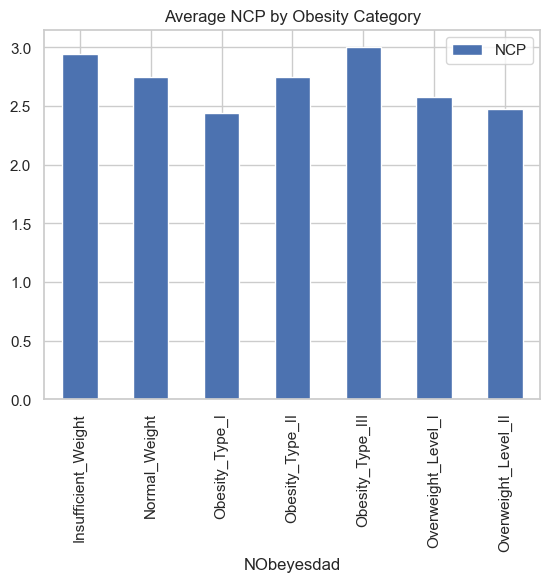

In [874]:
(df.groupby("NObeyesdad").agg({"NCP":"mean"})).plot.bar()
plt.title('Average NCP by Obesity Category')
#plt.legend(title='Age-Mean',bbox_to_anchor=(1.05, 1), loc='upper left')

In [875]:
ag=df.groupby('NObeyesdad')['NCP'].mean()
ag

NObeyesdad
Insufficient_Weight   2.94
Normal_Weight         2.75
Obesity_Type_I        2.44
Obesity_Type_II       2.74
Obesity_Type_III      3.00
Overweight_Level_I    2.58
Overweight_Level_II   2.47
Name: NCP, dtype: float64

(array([0, 1, 2, 3, 4, 5, 6]),
 [Text(0, 0, 'Normal_Weight'),
  Text(1, 0, 'Overweight_Level_I'),
  Text(2, 0, 'Overweight_Level_II'),
  Text(3, 0, 'Obesity_Type_I'),
  Text(4, 0, 'Insufficient_Weight'),
  Text(5, 0, 'Obesity_Type_II'),
  Text(6, 0, 'Obesity_Type_III')])

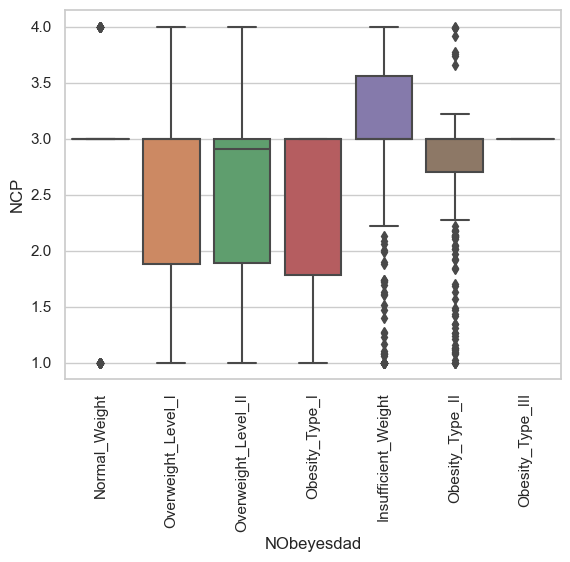

In [876]:
sns.boxplot(df,x='NObeyesdad',y='NCP')
plt.xticks(rotation=90)

### Outliers

Mean - 3 * standard deviation: 0.4037964475978453 
Mean + 3 * standard deviation: 4.996147347571236

There is no outlier in 'NCP' based on 'Mean and Standard Deviation Method' in the dataset that you give to this function


count   2070.00
mean       2.70
std        0.77
min        1.00
25%        2.69
50%        3.00
75%        3.00
max        4.00
Name: NCP, dtype: float64

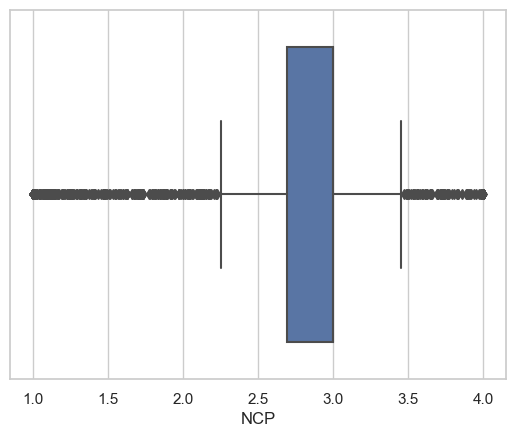

In [877]:
outlier_detection(df,"NCP")

In [878]:
df.NCP.quantile([0,0.01,0.50,0.70,0.90,0.95,0.99,1])

0.00   1.00
0.01   1.00
0.50   3.00
0.70   3.00
0.90   3.13
0.95   3.76
0.99   4.00
1.00   4.00
Name: NCP, dtype: float64

#### Normality Check 

<Axes: xlabel='NCP', ylabel='Density'>

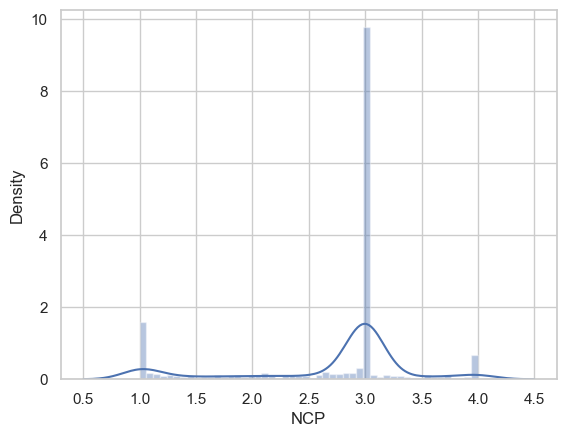

In [879]:
sns.distplot(df.NCP)

In [880]:
shapiro(df.NCP)

ShapiroResult(statistic=0.74029258502695, pvalue=4.721185561949023e-49)

#### since p-value is less than 5% we reject null hypotheses and conclude that NCP is not normaly distributed . But as per CLT (N>30) we can conclude that the data is normally distributed.

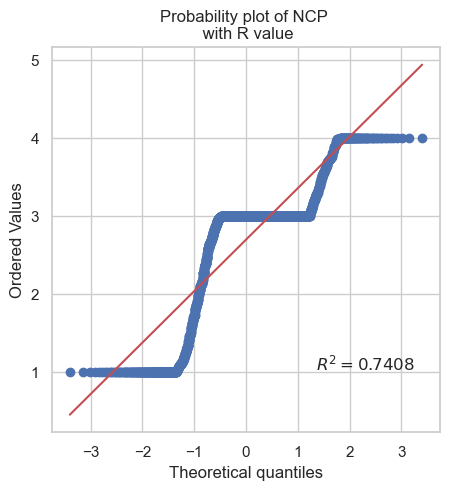

In [881]:
fig = plt.figure(figsize= (5, 5))
ax = fig.add_subplot(111)

normality_plot, stat = stats.probplot(df.NCP, plot= plt, rvalue= True)
ax.set_title("Probability plot of NCP \n with R value")
ax.set

plt.show()

In [882]:
df.groupby(['NObeyesdad']).agg({'NCP':'describe'})

NCP                                   
                     count mean  std  min  25%  50%  75%  max
NObeyesdad                                                   
Insufficient_Weight 267.00 2.94 0.88 1.00 3.00 3.00 3.56 4.00
Normal_Weight       280.00 2.75 0.87 1.00 3.00 3.00 3.00 4.00
Obesity_Type_I      349.00 2.44 0.79 1.00 1.78 3.00 3.00 3.00
Obesity_Type_II     297.00 2.74 0.58 1.00 2.70 3.00 3.00 4.00
Obesity_Type_III    324.00 3.00 0.00 3.00 3.00 3.00 3.00 3.00
Overweight_Level_I  275.00 2.58 0.92 1.00 1.88 3.00 3.00 4.00
Overweight_Level_II 278.00 2.47 0.76 1.00 1.89 2.91 3.00 4.00

#### We are ready to test statistically whether different category samples have a different mean using the ANOVA T-Test. 
-  H0 : no statistically significant difference among the category means
-  Ha : Atleast one population mean is different from the rest

Assumptions:

Assumption 1: Samples are mutually exclusive. Assumption met
Assumption 2: The data from each group following a normal distribution. 
Assumption 3: All samples have the same variances (Homogeneity of Variance).
Besides that we dont have significant outliers.

In [883]:
## Subsetting data 
Insufficient_Weight=df[df['NObeyesdad']=='Insufficient_Weight']['NCP']
Normal_Weight=df[df['NObeyesdad']=='Normal_Weight']['NCP']
Obesity_Type_I=df[df['NObeyesdad']=='Obesity_Type_I']['NCP']
Obesity_Type_II=df[df['NObeyesdad']=='Obesity_Type_II']['NCP']
Obesity_Type_III=df[df['NObeyesdad']=='Obesity_Type_III']['NCP']
Overweight_Level_I=df[df['NObeyesdad']=='Overweight_Level_I']['NCP']
Overweight_Level_II=df[df['NObeyesdad']=='Overweight_Level_II']['NCP']

In [884]:
#H0: Equality of Varinace
#Ha: No Equality of Variance
stats.levene(Insufficient_Weight,Normal_Weight,Obesity_Type_I,Obesity_Type_II,Obesity_Type_III,Overweight_Level_I,Overweight_Level_II)

LeveneResult(statistic=38.17799893217312, pvalue=3.677147549886453e-44)

In [885]:
kw_statistic, p_value = kruskal(
    Insufficient_Weight,Normal_Weight,Obesity_Type_I,Obesity_Type_II,Obesity_Type_III,Overweight_Level_I,Overweight_Level_II
)

# Print the result
print("Kruskal-Wallis Test:")
print("Test Statistic:", kw_statistic)
print("p-value:", p_value)

Kruskal-Wallis Test:
Test Statistic: 242.40492707576786
p-value: 1.720275087547693e-49


# CH2O v/s Obesity Category

In [886]:
df.groupby("NObeyesdad").agg({"CH2O":["mean","median",'count']})

CH2O             
                    mean median count
NObeyesdad                           
Insufficient_Weight 1.88   2.00   267
Normal_Weight       1.85   2.00   280
Obesity_Type_I      2.11   2.02   349
Obesity_Type_II     1.88   2.00   297
Obesity_Type_III    2.21   2.43   324
Overweight_Level_I  2.01   2.00   275
Overweight_Level_II 2.05   2.00   278

Text(0.5, 1.0, 'Average CH2O by Obesity Category')

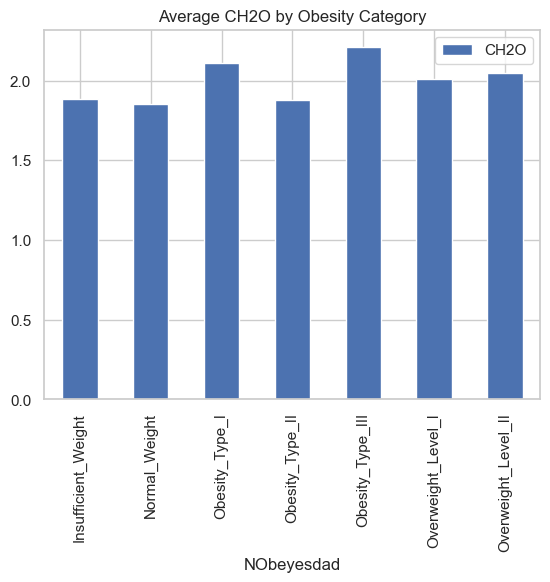

In [887]:
(df.groupby("NObeyesdad").agg({"CH2O":"mean"})).plot.bar()
plt.title('Average CH2O by Obesity Category')
#plt.legend(title='Age-Mean',bbox_to_anchor=(1.05, 1), loc='upper left')

In [888]:
ag=df.groupby('NObeyesdad')['CH2O'].mean()
ag

NObeyesdad
Insufficient_Weight   1.88
Normal_Weight         1.85
Obesity_Type_I        2.11
Obesity_Type_II       1.88
Obesity_Type_III      2.21
Overweight_Level_I    2.01
Overweight_Level_II   2.05
Name: CH2O, dtype: float64

(array([0, 1, 2, 3, 4, 5, 6]),
 [Text(0, 0, 'Normal_Weight'),
  Text(1, 0, 'Overweight_Level_I'),
  Text(2, 0, 'Overweight_Level_II'),
  Text(3, 0, 'Obesity_Type_I'),
  Text(4, 0, 'Insufficient_Weight'),
  Text(5, 0, 'Obesity_Type_II'),
  Text(6, 0, 'Obesity_Type_III')])

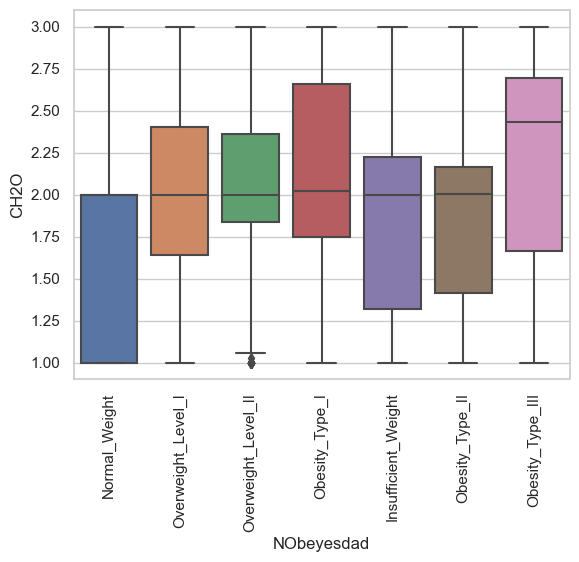

In [889]:
sns.boxplot(df,x='NObeyesdad',y='CH2O')
plt.xticks(rotation=90)

### Outliers

Mean - 3 * standard deviation: 0.18252955640279556 
Mean + 3 * standard deviation: 3.830580188524741

There is no outlier in 'CH2O' based on 'Mean and Standard Deviation Method' in the dataset that you give to this function


count   2070.00
mean       2.01
std        0.61
min        1.00
25%        1.59
50%        2.00
75%        2.47
max        3.00
Name: CH2O, dtype: float64

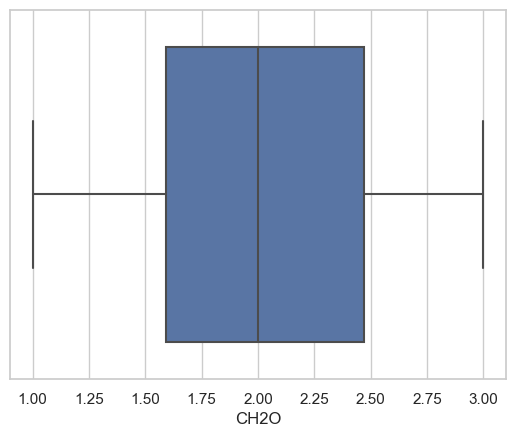

In [890]:
outlier_detection(df,"CH2O")

In [891]:
df.CH2O.quantile([0,0.01,0.50,0.70,0.90,0.95,0.99,1])

0.00   1.00
0.01   1.00
0.50   2.00
0.70   2.32
0.90   2.88
0.95   3.00
0.99   3.00
1.00   3.00
Name: CH2O, dtype: float64

#### Normality Check 

<Axes: xlabel='CH2O', ylabel='Density'>

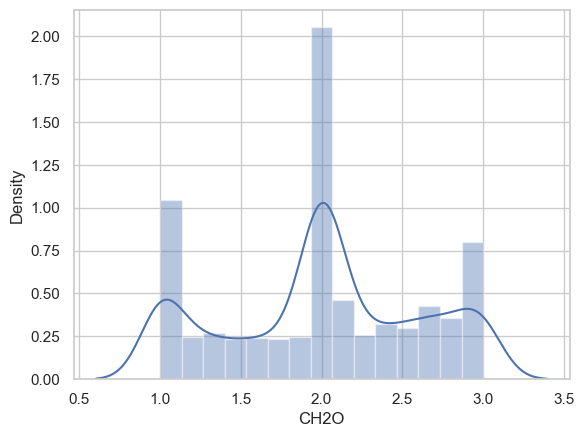

In [892]:
sns.distplot(df.CH2O)

In [893]:
shapiro(df.CH2O)

ShapiroResult(statistic=0.935337949325357, pvalue=4.3395034688906664e-29)

#### since p-value is less than 5% we reject null hypotheses and conclude that CH2O is not normaly distributed

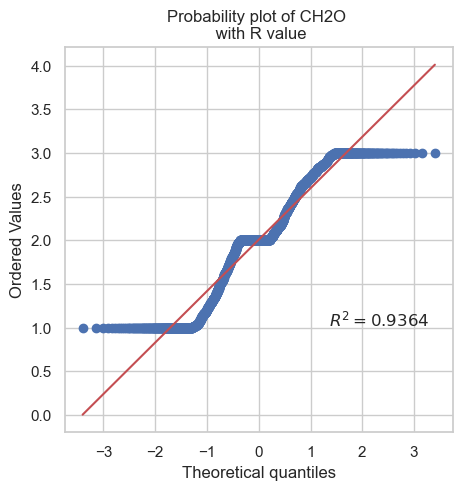

In [894]:
fig = plt.figure(figsize= (5, 5))
ax = fig.add_subplot(111)

normality_plot, stat = stats.probplot(df.CH2O, plot= plt, rvalue= True)
ax.set_title("Probability plot of CH2O \n with R value")
ax.set

plt.show()

#### Continuous Vs. Categorical : Here since Obesity levels have more than two levels so I will run ANOVA t test after checking its assumptions

In [895]:
df.groupby(['NObeyesdad']).agg({'CH2O':'describe'})

CH2O                                   
                     count mean  std  min  25%  50%  75%  max
NObeyesdad                                                   
Insufficient_Weight 267.00 1.88 0.60 1.00 1.32 2.00 2.22 3.00
Normal_Weight       280.00 1.85 0.64 1.00 1.00 2.00 2.00 3.00
Obesity_Type_I      349.00 2.11 0.63 1.00 1.75 2.02 2.66 3.00
Obesity_Type_II     297.00 1.88 0.55 1.00 1.41 2.00 2.17 3.00
Obesity_Type_III    324.00 2.21 0.60 1.00 1.67 2.43 2.69 3.00
Overweight_Level_I  275.00 2.01 0.59 1.00 1.64 2.00 2.40 3.00
Overweight_Level_II 278.00 2.05 0.55 1.00 1.84 2.00 2.36 3.00

#### We are ready to test statistically whether different category samples have a different mean using the ANOVA T-Test. 
-  H0 : no statistically significant difference among the category means
-  Ha : Atleast one population mean is different from the rest

Assumptions:

Assumption 1: Samples are mutually exclusive. Assumption met
Assumption 2: The data from each group following a normal distribution. 
Assumption 3: All samples have the same variances (Homogeneity of Variance).
Besides that we dont have significant outliers.

In [896]:
## Subsetting data 
Insufficient_Weight=df[df['NObeyesdad']=='Insufficient_Weight']['CH2O']
Normal_Weight=df[df['NObeyesdad']=='Normal_Weight']['CH2O']
Obesity_Type_I=df[df['NObeyesdad']=='Obesity_Type_I']['CH2O']
Obesity_Type_II=df[df['NObeyesdad']=='Obesity_Type_II']['CH2O']
Obesity_Type_III=df[df['NObeyesdad']=='Obesity_Type_III']['CH2O']
Overweight_Level_I=df[df['NObeyesdad']=='Overweight_Level_I']['CH2O']
Overweight_Level_II=df[df['NObeyesdad']=='Overweight_Level_II']['CH2O']

In [897]:
#H0: Equality of Varinace
#Ha: No Equality of Variance
from scipy import stats
stats.levene(Insufficient_Weight,Normal_Weight,Obesity_Type_I,Obesity_Type_II,Obesity_Type_III,Overweight_Level_I,Overweight_Level_II)

LeveneResult(statistic=3.5297401171858884, pvalue=0.001766897916131623)

In [898]:
.64/.55

1.1636363636363636

### Since the ratio of the sample standard deviations falls within 0.5 to 2, then it may be that the assumption is not violated.

In [899]:

groups = {}
for name, group in df.groupby('NObeyesdad'):
    groups[name] = group['CH2O'].tolist()

# Perform one-way ANOVA test
f_statistic, p_value = f_oneway(groups['Obesity_Type_I'], groups['Obesity_Type_III'], groups['Obesity_Type_II'], groups['Overweight_Level_II'], groups['Normal_Weight'], groups['Overweight_Level_I'], groups['Insufficient_Weight'])

# Print the results
print("F-statistic:", f_statistic)
print("p-value:", p_value)

# Interpret the results
if p_value < 0.05:
    print("The means of the groups are significantly different (reject the null hypothesis)")
else:
    print("The means of the groups are not significantly different (fail to reject the null hypothesis)")

F-statistic: 15.568718953023692
p-value: 1.515957280426162e-17
The means of the groups are significantly different (reject the null hypothesis)


In [900]:
from statsmodels.stats.multicomp import MultiComparison
mul_comp = MultiComparison(df['CH2O'],df['NObeyesdad'])
mul_result = mul_comp.tukeyhsd()
print(mul_result)

             Multiple Comparison of Means - Tukey HSD, FWER=0.05              
       group1              group2       meandiff p-adj   lower   upper  reject
------------------------------------------------------------------------------
Insufficient_Weight       Normal_Weight  -0.0303  0.997 -0.1806  0.1201  False
Insufficient_Weight      Obesity_Type_I   0.2295    0.0  0.0866  0.3724   True
Insufficient_Weight     Obesity_Type_II  -0.0062    1.0 -0.1544   0.142  False
Insufficient_Weight    Obesity_Type_III   0.3246    0.0  0.1794  0.4699   True
Insufficient_Weight  Overweight_Level_I   0.1235  0.193 -0.0275  0.2745  False
Insufficient_Weight Overweight_Level_II   0.1621 0.0254  0.0115  0.3127   True
      Normal_Weight      Obesity_Type_I   0.2598    0.0  0.1188  0.4008   True
      Normal_Weight     Obesity_Type_II   0.0241  0.999 -0.1223  0.1705  False
      Normal_Weight    Obesity_Type_III   0.3549    0.0  0.2115  0.4983   True
      Normal_Weight  Overweight_Level_I   0.1538 0.0

## FAF(Pysical activity frequency) v/s Obesity Category

In [901]:
df.FAF.describe()

count   2070.00
mean       1.01
std        0.85
min        0.00
25%        0.13
50%        1.00
75%        1.68
max        3.00
Name: FAF, dtype: float64

In [902]:
df.groupby("NObeyesdad").agg({"FAF":["mean","median",'count']})

FAF             
                    mean median count
NObeyesdad                           
Insufficient_Weight 1.27   1.37   267
Normal_Weight       1.25   1.00   280
Obesity_Type_I      0.99   1.00   349
Obesity_Type_II     0.97   0.99   297
Obesity_Type_III    0.66   0.22   324
Overweight_Level_I  1.05   0.99   275
Overweight_Level_II 0.97   0.97   278

Text(0.5, 1.0, 'Average FAF by Obesity Category')

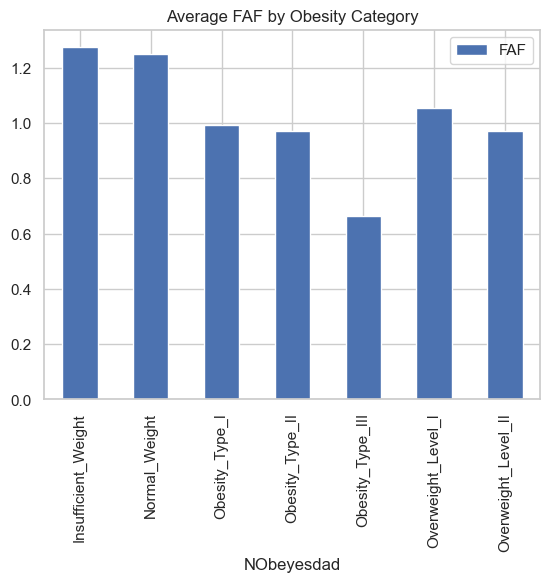

In [903]:
(df.groupby("NObeyesdad").agg({"FAF":"mean"})).plot.bar()
plt.title('Average FAF by Obesity Category')
#plt.legend(title='Age-Mean',bbox_to_anchor=(1.05, 1), loc='upper left')

In [904]:
ag=df.groupby('NObeyesdad')['FAF'].mean()
ag

NObeyesdad
Insufficient_Weight   1.27
Normal_Weight         1.25
Obesity_Type_I        0.99
Obesity_Type_II       0.97
Obesity_Type_III      0.66
Overweight_Level_I    1.05
Overweight_Level_II   0.97
Name: FAF, dtype: float64

(array([0, 1, 2, 3, 4, 5, 6]),
 [Text(0, 0, 'Normal_Weight'),
  Text(1, 0, 'Overweight_Level_I'),
  Text(2, 0, 'Overweight_Level_II'),
  Text(3, 0, 'Obesity_Type_I'),
  Text(4, 0, 'Insufficient_Weight'),
  Text(5, 0, 'Obesity_Type_II'),
  Text(6, 0, 'Obesity_Type_III')])

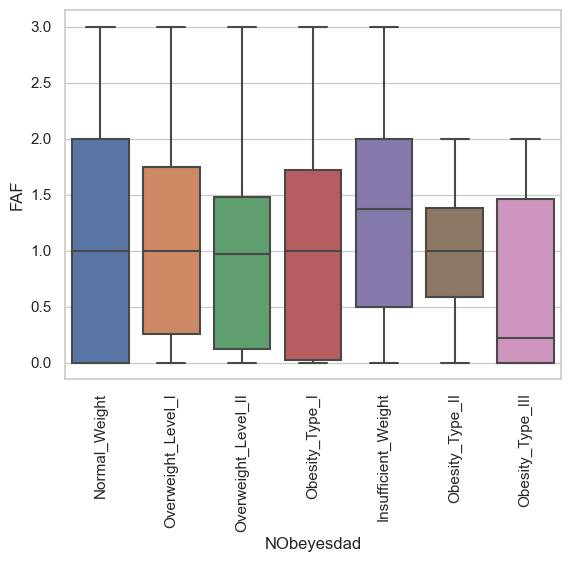

In [905]:
sns.boxplot(df,x='NObeyesdad',y='FAF')
plt.xticks(rotation=90)

### Outliers

Mean - 3 * standard deviation: -1.5473730573767261 
Mean + 3 * standard deviation: 3.576323236120688

There is no outlier in 'FAF' based on 'Mean and Standard Deviation Method' in the dataset that you give to this function


count   2070.00
mean       1.01
std        0.85
min        0.00
25%        0.13
50%        1.00
75%        1.68
max        3.00
Name: FAF, dtype: float64

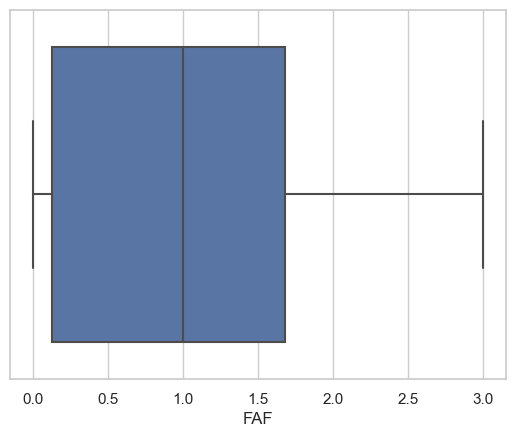

In [906]:
outlier_detection(df,"FAF")

In [907]:
df.FAF.quantile([0,0.01,0.50,0.70,0.90,0.95,0.99,1])

0.00   0.00
0.01   0.00
0.50   1.00
0.70   1.48
0.90   2.00
0.95   2.69
0.99   3.00
1.00   3.00
Name: FAF, dtype: float64

#### Normality Check 

<Axes: xlabel='FAF', ylabel='Density'>

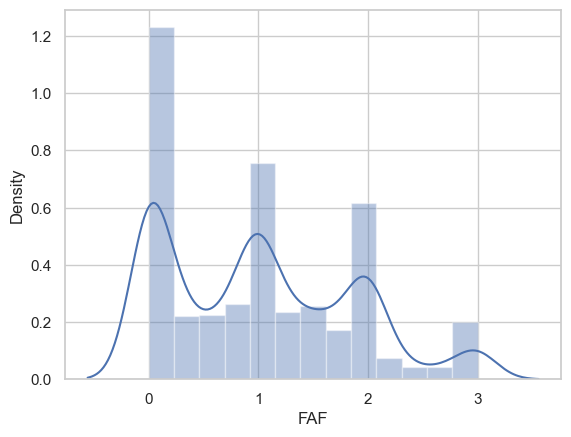

In [908]:
sns.distplot(df.FAF)

In [909]:
from scipy import stats
from scipy.stats import shapiro
shapiro(df.FAF)

ShapiroResult(statistic=0.9154826408432791, pvalue=1.6345412428367884e-32)

#### since p-value is less than 5% we reject null hypotheses and conclude that FAF is not normaly distributed

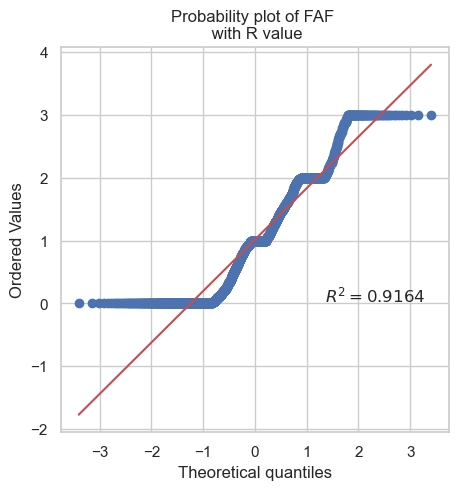

In [910]:
fig = plt.figure(figsize= (5, 5))
ax = fig.add_subplot(111)

normality_plot, stat = stats.probplot(df.FAF, plot= plt, rvalue= True)
ax.set_title("Probability plot of FAF \n with R value")
ax.set

plt.show()

In [911]:
df1=df[df.FAF==0]
df.FAF.describe()

count   2070.00
mean       1.01
std        0.85
min        0.00
25%        0.13
50%        1.00
75%        1.68
max        3.00
Name: FAF, dtype: float64

#### Continuous Vs. Categorical : Here since Obesity levels have more than two levels so I will run ANOVA t test after checking its assumptions

In [912]:
df.groupby(['NObeyesdad']).agg({'FAF':'describe'})

FAF                                   
                     count mean  std  min  25%  50%  75%  max
NObeyesdad                                                   
Insufficient_Weight 267.00 1.27 0.85 0.00 0.50 1.37 2.00 3.00
Normal_Weight       280.00 1.25 1.02 0.00 0.00 1.00 2.00 3.00
Obesity_Type_I      349.00 0.99 0.89 0.00 0.03 1.00 1.72 3.00
Obesity_Type_II     297.00 0.97 0.58 0.00 0.58 0.99 1.38 2.00
Obesity_Type_III    324.00 0.66 0.73 0.00 0.00 0.22 1.46 2.00
Overweight_Level_I  275.00 1.05 0.87 0.00 0.25 0.99 1.74 3.00
Overweight_Level_II 278.00 0.97 0.84 0.00 0.12 0.97 1.47 3.00

#### We are ready to test statistically whether different category samples have a different mean using the ANOVA T-Test. 
-  H0 : no statistically significant difference among the category means
-  Ha : Atleast one population mean is different from the rest

Assumptions:

Assumption 1: Samples are mutually exclusive. Assumption met
Assumption 2: The data from each group following a normal distribution. 
Assumption 3: All samples have the same variances (Homogeneity of Variance).
Besides that we dont have significant outliers.

In [913]:
## Subsetting data 
Insufficient_Weight=df[df['NObeyesdad']=='Insufficient_Weight']['FAF']
Normal_Weight=df[df['NObeyesdad']=='Normal_Weight']['FAF']
Obesity_Type_I=df[df['NObeyesdad']=='Obesity_Type_I']['FAF']
Obesity_Type_II=df[df['NObeyesdad']=='Obesity_Type_II']['FAF']
Obesity_Type_III=df[df['NObeyesdad']=='Obesity_Type_III']['FAF']
Overweight_Level_I=df[df['NObeyesdad']=='Overweight_Level_I']['FAF']
Overweight_Level_II=df[df['NObeyesdad']=='Overweight_Level_II']['FAF']

In [914]:
#H0: Equality of Varinace
#Ha: No Equality of Variance
from scipy import stats
stats.levene(Insufficient_Weight,Normal_Weight,Obesity_Type_I,Obesity_Type_II,Obesity_Type_III,Overweight_Level_I,Overweight_Level_II)

LeveneResult(statistic=12.99137394693534, pvalue=1.8093244389329913e-14)

In [915]:
1.02/.58

1.7586206896551726

### Since the ratio of the sample standard deviations falls within 0.5 to 2, then it may be that the assumption is not violated.

In [916]:
from scipy.stats import f_oneway
groups = {}
for name, group in df.groupby('NObeyesdad'):
    groups[name] = group['FAF'].tolist()

# Perform one-way ANOVA test
f_statistic, p_value = f_oneway(groups['Obesity_Type_I'], groups['Obesity_Type_III'], groups['Obesity_Type_II'], groups['Overweight_Level_II'], groups['Normal_Weight'], groups['Overweight_Level_I'], groups['Insufficient_Weight'])

# Print the results
print("F-statistic:", f_statistic)
print("p-value:", p_value)

# Interpret the results
if p_value < 0.05:
    print("The means of the groups are significantly different (reject the null hypothesis)")
else:
    print("The means of the groups are not significantly different (fail to reject the null hypothesis)")

F-statistic: 17.907139049677095
p-value: 2.4485354628904785e-20
The means of the groups are significantly different (reject the null hypothesis)


In [917]:
from statsmodels.stats.multicomp import MultiComparison
mul_comp = MultiComparison(df['FAF'],df['NObeyesdad'])
mul_result = mul_comp.tukeyhsd()
print(mul_result)

             Multiple Comparison of Means - Tukey HSD, FWER=0.05              
       group1              group2       meandiff p-adj   lower   upper  reject
------------------------------------------------------------------------------
Insufficient_Weight       Normal_Weight  -0.0235 0.9999  -0.234  0.1869  False
Insufficient_Weight      Obesity_Type_I  -0.2811 0.0007 -0.4812 -0.0811   True
Insufficient_Weight     Obesity_Type_II  -0.3017 0.0004 -0.5092 -0.0942   True
Insufficient_Weight    Obesity_Type_III  -0.6087    0.0 -0.8121 -0.4053   True
Insufficient_Weight  Overweight_Level_I  -0.2209 0.0338 -0.4323 -0.0095   True
Insufficient_Weight Overweight_Level_II  -0.3021 0.0005 -0.5129 -0.0912   True
      Normal_Weight      Obesity_Type_I  -0.2576 0.0023  -0.455 -0.0602   True
      Normal_Weight     Obesity_Type_II  -0.2781 0.0013 -0.4831 -0.0732   True
      Normal_Weight    Obesity_Type_III  -0.5852    0.0  -0.786 -0.3844   True
      Normal_Weight  Overweight_Level_I  -0.1974 0.0

## TUE (Time using Technology Devices) v/s Obesity Category

In [918]:
df.TUE.describe()

count   2070.00
mean       0.67
std        0.61
min        0.00
25%        0.00
50%        0.64
75%        1.00
max        2.00
Name: TUE, dtype: float64

In [919]:
df.groupby("NObeyesdad").agg({"TUE":["mean","median",'count']})

TUE             
                    mean median count
NObeyesdad                           
Insufficient_Weight 0.85   1.00   267
Normal_Weight       0.68   1.00   280
Obesity_Type_I      0.68   0.54   349
Obesity_Type_II     0.52   0.34   297
Obesity_Type_III    0.60   0.66   324
Overweight_Level_I  0.65   0.43   275
Overweight_Level_II 0.73   0.80   278

Text(0.5, 1.0, 'Average TUE by Obesity Category')

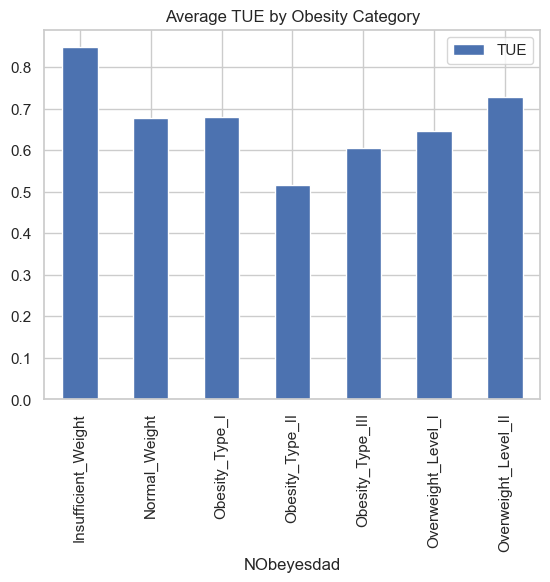

In [920]:
(df.groupby("NObeyesdad").agg({"TUE":"mean"})).plot.bar()
plt.title('Average TUE by Obesity Category')
#plt.legend(title='Age-Mean',bbox_to_anchor=(1.05, 1), loc='upper left')

In [921]:
ag=df.groupby('NObeyesdad')['TUE'].mean()
ag

NObeyesdad
Insufficient_Weight   0.85
Normal_Weight         0.68
Obesity_Type_I        0.68
Obesity_Type_II       0.52
Obesity_Type_III      0.60
Overweight_Level_I    0.65
Overweight_Level_II   0.73
Name: TUE, dtype: float64

(array([0, 1, 2, 3, 4, 5, 6]),
 [Text(0, 0, 'Normal_Weight'),
  Text(1, 0, 'Overweight_Level_I'),
  Text(2, 0, 'Overweight_Level_II'),
  Text(3, 0, 'Obesity_Type_I'),
  Text(4, 0, 'Insufficient_Weight'),
  Text(5, 0, 'Obesity_Type_II'),
  Text(6, 0, 'Obesity_Type_III')])

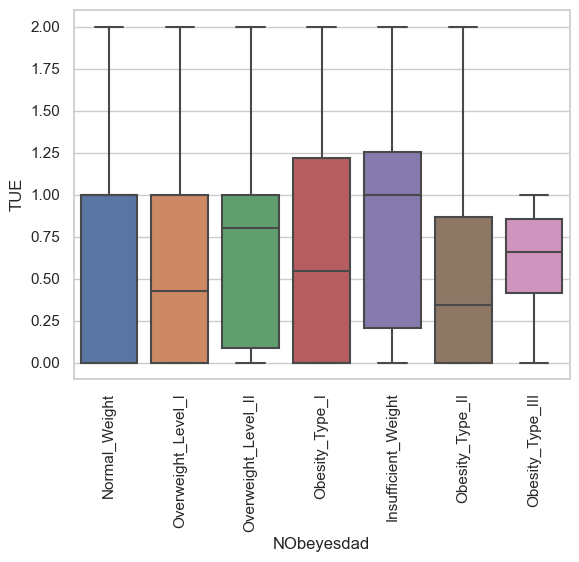

In [922]:
sns.boxplot(df,x='NObeyesdad',y='TUE')
plt.xticks(rotation=90)

### Outliers

Mean - 3 * standard deviation: -1.1553760433119766 
Mean + 3 * standard deviation: 2.491371178577677

There is no outlier in 'TUE' based on 'Mean and Standard Deviation Method' in the dataset that you give to this function


count   2070.00
mean       0.67
std        0.61
min        0.00
25%        0.00
50%        0.64
75%        1.00
max        2.00
Name: TUE, dtype: float64

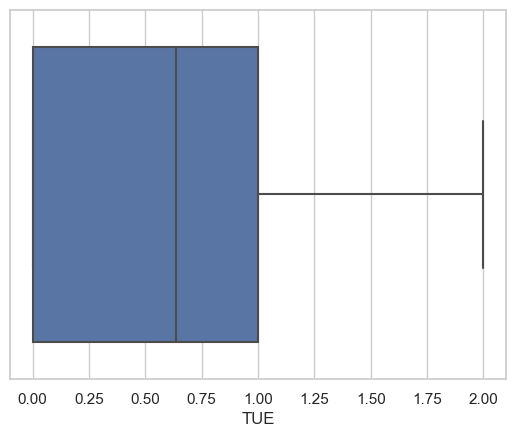

In [923]:
outlier_detection(df,"TUE")

In [924]:
df.TUE.quantile([0,0.01,0.50,0.70,0.90,0.95,0.99,1])

0.00   0.00
0.01   0.00
0.50   0.64
0.70   1.00
0.90   1.61
0.95   2.00
0.99   2.00
1.00   2.00
Name: TUE, dtype: float64

#### Normality Check 

<Axes: xlabel='TUE', ylabel='Density'>

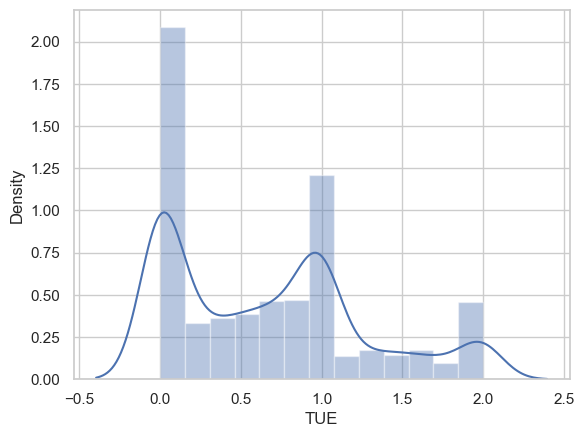

In [925]:
sns.distplot(df.TUE)

In [926]:
from scipy import stats
from scipy.stats import shapiro
shapiro(df.TUE)

ShapiroResult(statistic=0.8907853664643065, pvalue=5.590621877268359e-36)

#### since p-value is less than 5% we reject null hypotheses and conclude that TUE is not normaly distributed

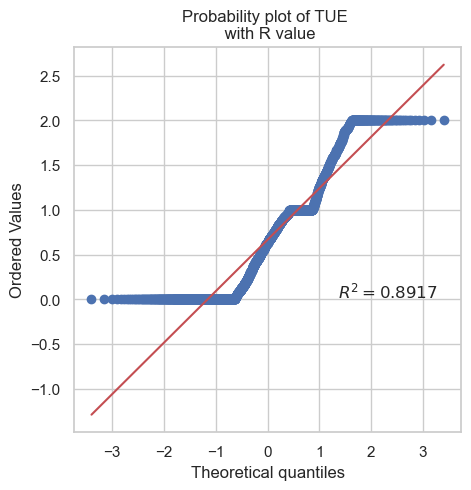

In [927]:
fig = plt.figure(figsize= (5, 5))
ax = fig.add_subplot(111)

normality_plot, stat = stats.probplot(df.TUE, plot= plt, rvalue= True)
ax.set_title("Probability plot of TUE \n with R value")
ax.set

plt.show()

#### Continuous Vs. Categorical : Here since Obesity levels have more than two levels so I will run ANOVA t test after checking its assumptions

In [928]:
df.groupby(['NObeyesdad']).agg({'TUE':'describe'})

TUE                                   
                     count mean  std  min  25%  50%  75%  max
NObeyesdad                                                   
Insufficient_Weight 267.00 0.85 0.64 0.00 0.21 1.00 1.26 2.00
Normal_Weight       280.00 0.68 0.69 0.00 0.00 1.00 1.00 2.00
Obesity_Type_I      349.00 0.68 0.69 0.00 0.00 0.54 1.22 2.00
Obesity_Type_II     297.00 0.52 0.56 0.00 0.00 0.34 0.86 2.00
Obesity_Type_III    324.00 0.60 0.28 0.00 0.41 0.66 0.85 1.00
Overweight_Level_I  275.00 0.65 0.68 0.00 0.00 0.43 1.00 2.00
Overweight_Level_II 278.00 0.73 0.58 0.00 0.09 0.80 1.00 2.00

#### We are ready to test statistically whether different category samples have a different mean using the ANOVA T-Test. 
-  H0 : no statistically significant difference among the category means
-  Ha : Atleast one population mean is different from the rest

Assumptions:

Assumption 1: Samples are mutually exclusive. Assumption met
Assumption 2: The data from each group following a normal distribution. 
Assumption 3: All samples have the same variances (Homogeneity of Variance).
Besides that we dont have significant outliers.

In [929]:
## Subsetting data 
Insufficient_Weight=df[df['NObeyesdad']=='Insufficient_Weight']['TUE']
Normal_Weight=df[df['NObeyesdad']=='Normal_Weight']['TUE']
Obesity_Type_I=df[df['NObeyesdad']=='Obesity_Type_I']['TUE']
Obesity_Type_II=df[df['NObeyesdad']=='Obesity_Type_II']['TUE']
Obesity_Type_III=df[df['NObeyesdad']=='Obesity_Type_III']['TUE']
Overweight_Level_I=df[df['NObeyesdad']=='Overweight_Level_I']['TUE']
Overweight_Level_II=df[df['NObeyesdad']=='Overweight_Level_II']['TUE']

In [930]:
#H0: Equality of Varinace
#Ha: No Equality of Variance
stats.levene(Insufficient_Weight,Normal_Weight,Obesity_Type_I,Obesity_Type_II,Obesity_Type_III,Overweight_Level_I,Overweight_Level_II)

LeveneResult(statistic=35.05325459706771, pvalue=1.50843249314108e-40)

In [931]:
.69/.28

2.464285714285714

In [932]:


kw_statistic, p_value = kruskal(
    Insufficient_Weight,Normal_Weight,Obesity_Type_I,Obesity_Type_II,Obesity_Type_III,Overweight_Level_I,Overweight_Level_II
)

# Print the result
print("Kruskal-Wallis Test:")
print("Test Statistic:", kw_statistic)
print("p-value:", p_value)

Kruskal-Wallis Test:
Test Statistic: 47.537256598193586
p-value: 1.4618309099877524e-08


In [933]:
df_grp=df[:]

In [934]:
from scipy.stats import chi2_contingency
def chi_square(c1,c2):
    chi_2, p_val, dof, exp_val = chi2_contingency(pd.crosstab(df[c1],df[c2],margins = False))# make sure margins = False
    print("Actual values:\n")
    print(pd.crosstab(df[c1],df[c2],margins = False))
    print("="*100)
    print("Expected values: \n")
    print(exp_val)
    print("="*100)
    #print('\nChi-square is : %f'%chi_2, '\n\np_value is : %f'%p_val, '\n\ndegree of freedom is : %i'%dof)
    print(f'\nChi-square is : {chi_2}', f'\n\np_value is : {p_val}', f'\n\ndegree of freedom is :{dof}')
    print("="*100)
    if exp_val.min()<5 or np.sum(exp_val)<30 : print("\n********************************************\nWarning :We have some small expected \
values or the total number of observations is not enough to get any conclusion\n******************************************** ")
        #Note for sum of all values in dataframe use df.values.sum() and for numpy.ndarray use np.sum(arr)
    elif p_val < 0.05:# consider significan level is 5%
        print(F"\nThere is statistically significant correlation between {c1} and {c2} at 0.05 significant level")
    else:
        print(F"\nThere is no correlation between the two variables( we don't have enough evidence to conclude there is a a statistically significant relationship between {c1} and {c2}")        

##### The highest average age of the responder is close to 30years and is in Obesity_Type_II category

#### Weight by Obesity levels

In [935]:
df.groupby("NObeyesdad").agg({"Weight":["mean","median",'count']})

Weight             
                      mean median count
NObeyesdad                             
Insufficient_Weight  50.01  50.00   267
Normal_Weight        62.20  61.00   280
Obesity_Type_I       92.92  90.92   349
Obesity_Type_II     115.31 117.79   297
Obesity_Type_III    120.94 112.05   324
Overweight_Level_I   74.45  75.00   275
Overweight_Level_II  82.07  82.00   278

Text(0.5, 1.0, 'Average Weight by Obesity Category')

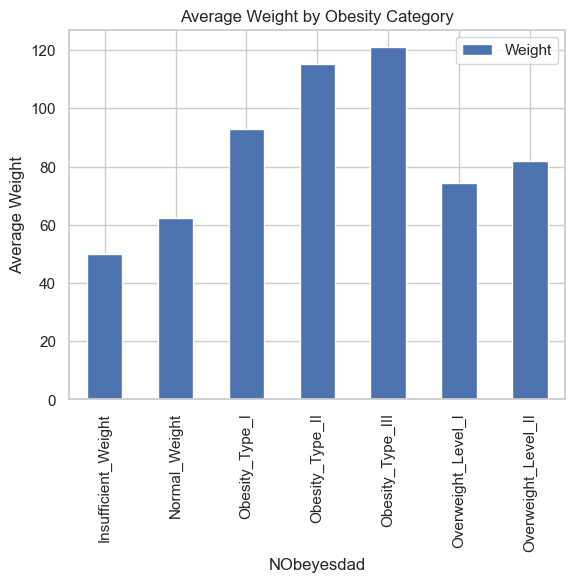

In [936]:
(df.groupby("NObeyesdad").agg({"Weight":"mean"})).plot.bar()
plt.ylabel('Average Weight')
plt.title('Average Weight by Obesity Category')

#### Height by Obesity Levels

In [937]:
df_grp.Height.describe()

count   2070.00
mean       1.70
std        0.09
min        1.45
25%        1.63
50%        1.70
75%        1.77
max        1.98
Name: Height, dtype: float64

In [938]:
df.groupby("NObeyesdad").agg({"Height":["mean","median",'count']})

Height             
                      mean median count
NObeyesdad                             
Insufficient_Weight   1.69   1.70   267
Normal_Weight         1.68   1.66   280
Obesity_Type_I        1.69   1.68   349
Obesity_Type_II       1.77   1.77   297
Obesity_Type_III      1.69   1.67   324
Overweight_Level_I    1.69   1.70   275
Overweight_Level_II   1.70   1.70   278

Text(0.5, 1.0, 'Average Height by Obesity Category')

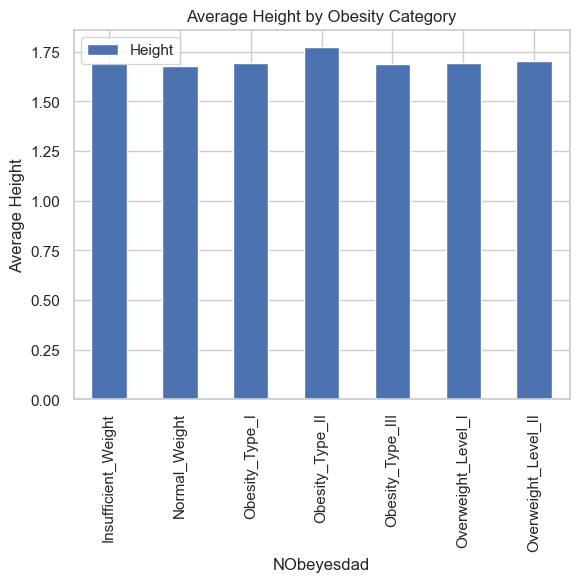

In [939]:
(df.groupby("NObeyesdad").agg({"Height":"mean"})).plot.bar()
plt.ylabel('Average Height')
plt.title('Average Height by Obesity Category')

### FCVC by Obesity Category

In [940]:
df.FCVC.describe() # Frequency of consumption of vegetables

count   2070.00
mean       2.42
std        0.54
min        1.00
25%        2.00
50%        2.40
75%        3.00
max        3.00
Name: FCVC, dtype: float64

In [941]:
df.groupby("NObeyesdad").agg({"FCVC":["mean","median",'count']})

FCVC             
                    mean median count
NObeyesdad                           
Insufficient_Weight 2.47   2.70   267
Normal_Weight       2.33   2.00   280
Obesity_Type_I      2.18   2.00   349
Obesity_Type_II     2.39   2.43   297
Obesity_Type_III    3.00   3.00   324
Overweight_Level_I  2.28   2.03   275
Overweight_Level_II 2.26   2.00   278

<Axes: xlabel='NObeyesdad'>

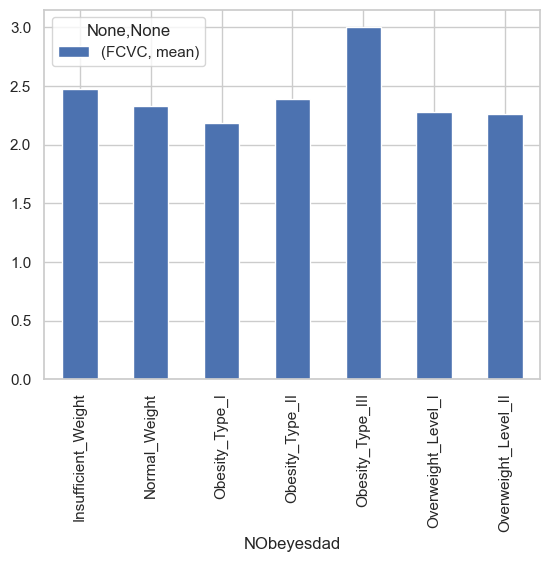

In [942]:
(df.groupby("NObeyesdad").agg({"FCVC":["mean"]})).plot.bar()

#### Average frequency consumption of vegatables are highest in Obesity_type_III

## Categorical v/s Categorical 

In [943]:
category_cols = df.select_dtypes(include='object').columns

# Perform chi-square test for all combinations of category and object columns
results = {}
for col1 in category_cols:
    for col2 in category_cols:
        contingency_table = pd.crosstab(df[col1], df[col2])
        chi2, p, dof, expected = chi2_contingency(contingency_table)
        results[(col1, col2)] = {'chi2': chi2, 'p-value': p}
        
# Print the results
for key, value in results.items():
    print(f"Chi-square test between {key[0]} and {key[1]}:")
    print(f"Chi2 value: {value['chi2']}")
    print(f"P-value: {value['p-value']}")
    print("="*100)

Chi-square test between Gender and Gender:
Chi2 value: 2066.001201068144
P-value: 0.0
Chi-square test between Gender and family_history_with_overweight:
Chi2 value: 27.718309276049546
P-value: 1.4032825348421838e-07
Chi-square test between Gender and FAVC:
Chi2 value: 6.1932225341237235
P-value: 0.012824045665009873
Chi-square test between Gender and CAEC:
Chi2 value: 29.781964342901773
P-value: 1.5337534643137825e-06
Chi-square test between Gender and SMOKE:
Chi2 value: 7.574366292673611
P-value: 0.005920419101520303
Chi-square test between Gender and SCC:
Chi2 value: 16.326230900021628
P-value: 5.332074359077816e-05
Chi-square test between Gender and CALC:
Chi2 value: 5.5789907995349175
P-value: 0.13398969118305223
Chi-square test between Gender and MTRANS:
Chi2 value: 62.61639398402559
P-value: 8.172134960302233e-13
Chi-square test between Gender and NObeyesdad:
Chi2 value: 659.1485960530829
P-value: 4.029147228695315e-139
Chi-square test between family_history_with_overweight and G

### Gender v/s family_history_with_overweight

family_history_with_overweight   no  yes
Gender                                  
Female                          224  797
Male                            137  912


Text(0, 0.5, 'Count')

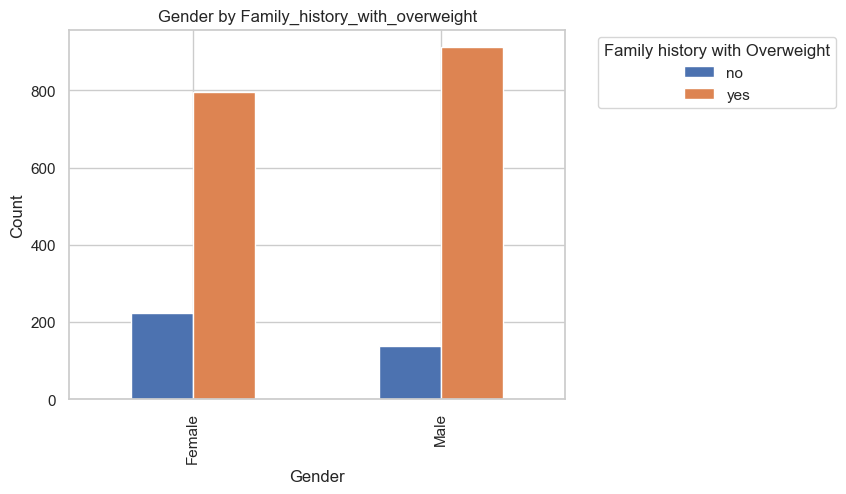

In [944]:
Gender_fh = pd.crosstab(df.Gender,df.family_history_with_overweight)
Gender_fh.plot.bar()
print(Gender_fh)
plt.title('Gender by Family_history_with_overweight')
plt.legend(title='Family history with Overweight',bbox_to_anchor=(1.05, 1),loc='upper left')
plt.ylabel('Count')

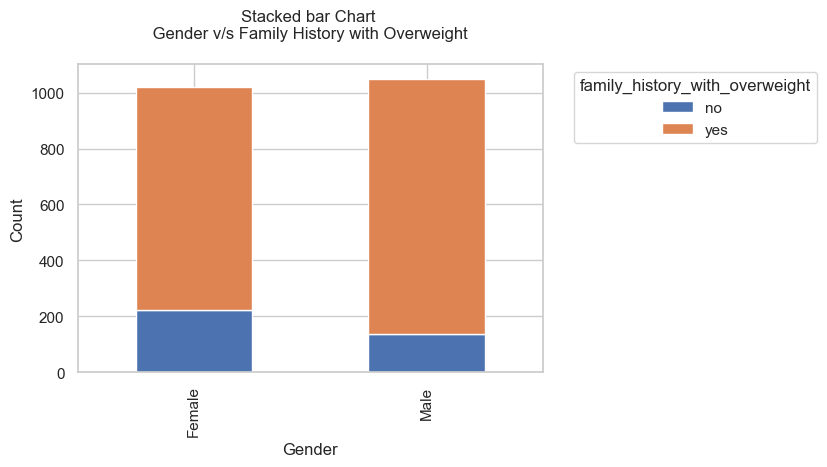

In [945]:
sns.set(style="whitegrid")
Gender_fh.plot(kind='bar', stacked=True, figsize=(6, 4))
bar_width=.05
plt.xlabel('Gender')
plt.ylabel('Count')
plt.legend(title='family_history_with_overweight',bbox_to_anchor=(1.05, 1), loc='upper left')
plt.title('Stacked bar Chart \n Gender v/s Family History with Overweight \n ')
plt.show()

In [946]:
df.head()

,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad,Age_norm,Height_norm,Weight_norm
0,Male,21.00,1.62,64.00,yes,no,2.00,3.00,Sometimes,no,2.00,no,0.00,1.00,no,Public_Transportation,Normal_Weight,0.68,0.64,13.38
1,Male,21.00,1.52,56.00,yes,no,3.00,3.00,Sometimes,yes,3.00,yes,3.00,0.00,Sometimes,Public_Transportation,Normal_Weight,0.68,0.53,12.41
2,Male,23.00,1.80,77.00,yes,no,2.00,3.00,Sometimes,no,2.00,no,2.00,1.00,Frequently,Public_Transportation,Normal_Weight,0.68,0.83,14.82
3,Male,27.00,1.80,87.00,no,no,3.00,3.00,Sometimes,no,2.00,no,2.00,0.00,Frequently,Walking,Overweight_Level_I,0.69,0.83,15.85
4,Male,22.00,1.78,89.80,no,no,2.00,1.00,Sometimes,no,2.00,no,0.00,0.00,Sometimes,Public_Transportation,Overweight_Level_II,0.68,0.81,16.13


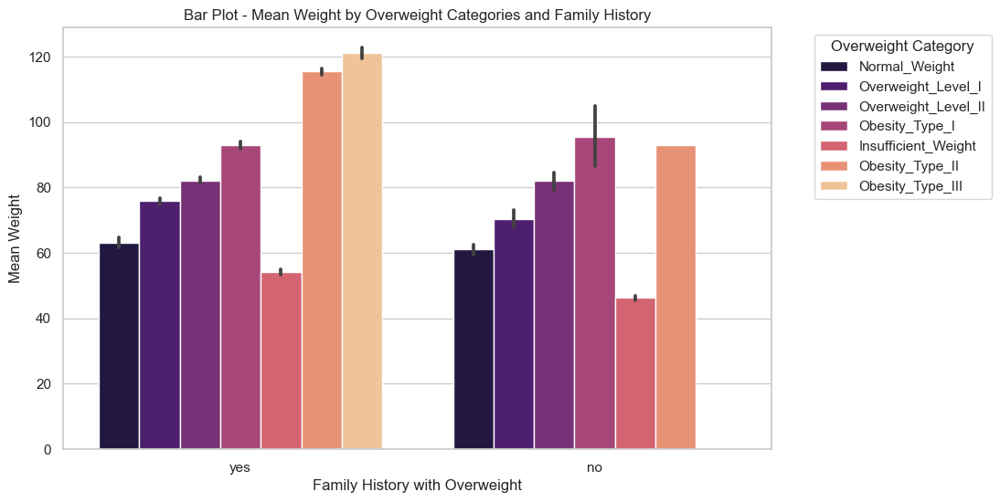

In [947]:
plt.figure(figsize=(10, 6))
sns.barplot(data=df, x='family_history_with_overweight', y='Weight', hue='NObeyesdad', palette='magma')
plt.title('Bar Plot - Mean Weight by Overweight Categories and Family History')
plt.xlabel('Family History with Overweight')
plt.ylabel('Mean Weight')
plt.legend(title='Overweight Category',bbox_to_anchor=(1.05, 1),loc='upper left')
plt.show()

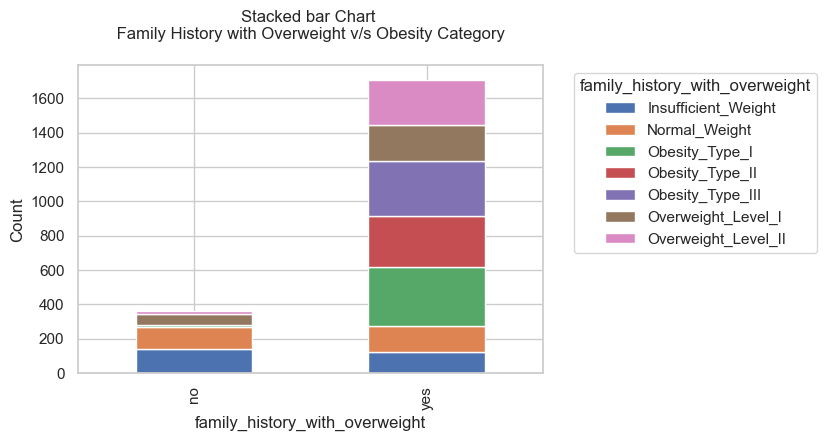

In [948]:
dd = pd.crosstab(df.family_history_with_overweight,df.NObeyesdad)
sns.set(style="whitegrid")
dd.plot(kind='bar', stacked=True, figsize=(6, 4))
bar_width=.05
plt.xlabel('family_history_with_overweight')
plt.ylabel('Count')
plt.legend(title='family_history_with_overweight',bbox_to_anchor=(1.05, 1), loc='upper left')
plt.title('Stacked bar Chart \n Family History with Overweight v/s Obesity Category \n ')
plt.show()

In [949]:
chi_square('Gender','family_history_with_overweight')

Actual values:

family_history_with_overweight   no  yes
Gender                                  
Female                          224  797
Male                            137  912
Expected values: 

[[178.05845411 842.94154589]
 [182.94154589 866.05845411]]

Chi-square is : 27.718309276049546 

p_value is : 1.4032825348421838e-07 

degree of freedom is :1

There is statistically significant correlation between Gender and family_history_with_overweight at 0.05 significant level


In [950]:
chi_square('Gender','NObeyesdad')

Actual values:

NObeyesdad  Insufficient_Weight  Normal_Weight  Obesity_Type_I  \
Gender                                                           
Female                      169            131             153   
Male                         98            149             196   

NObeyesdad  Obesity_Type_II  Obesity_Type_III  Overweight_Level_I  \
Gender                                                              
Female                    2               323                 145   
Male                    295                 1                 130   

NObeyesdad  Overweight_Level_II  
Gender                           
Female                       98  
Male                        180  
Expected values: 

[[131.6942029  138.10628019 172.13961353 146.49130435 159.80869565
  135.64009662 137.11980676]
 [135.3057971  141.89371981 176.86038647 150.50869565 164.19130435
  139.35990338 140.88019324]]

Chi-square is : 659.1485960530829 

p_value is : 4.029147228695315e-139 

degree of freedom i

### Gender and FAVC (Consumption of High-Caloric Food)

FAVC     no  yes
Gender          
Female  137  884
Male    103  946


Text(0, 0.5, 'Count')

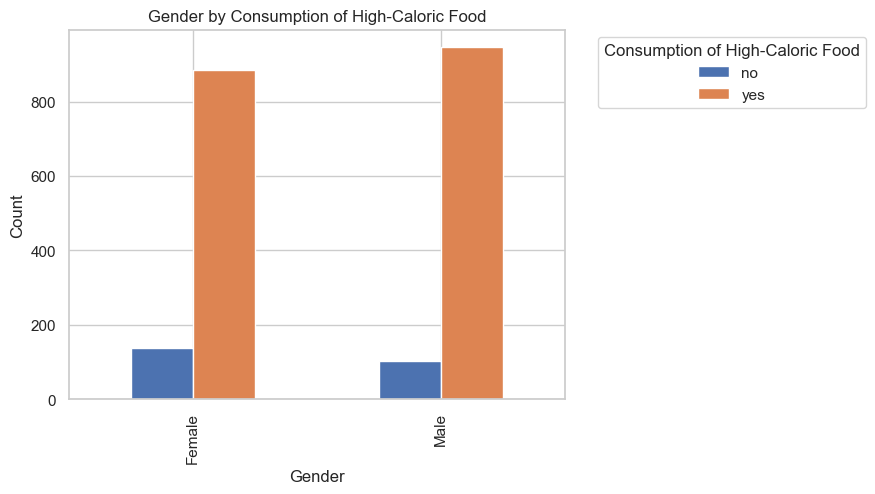

In [951]:
gender_favc = pd.crosstab(df.Gender,df.FAVC)
gender_favc.plot.bar()
print(gender_favc)
plt.title('Gender by Consumption of High-Caloric Food')
plt.legend(title='Consumption of High-Caloric Food',bbox_to_anchor=(1.05, 1),loc='upper left')
plt.ylabel('Count')

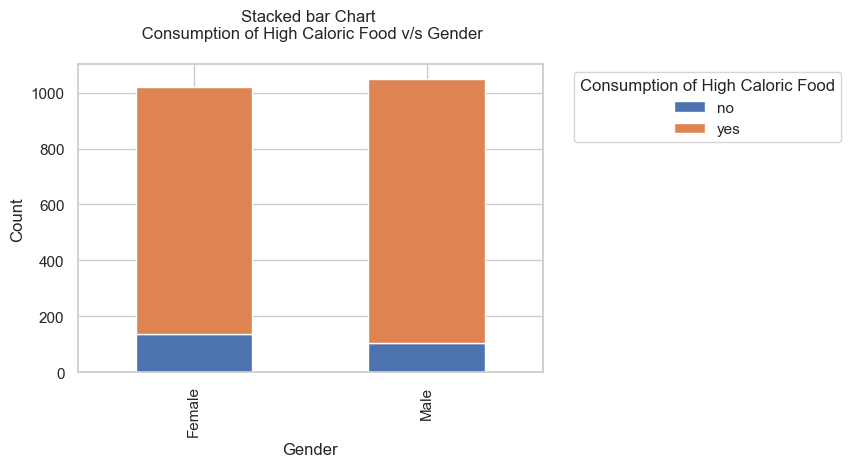

In [952]:
sns.set(style="whitegrid")
gender_favc.plot(kind='bar', stacked=True, figsize=(6, 4))
bar_width=.05
plt.xlabel('Gender')
plt.ylabel('Count')
plt.legend(title='Consumption of High Caloric Food',bbox_to_anchor=(1.05, 1), loc='upper left')
plt.title('Stacked bar Chart \n Consumption of High Caloric Food v/s Gender\n ')
plt.show()

In [953]:
chi_square('Gender','FAVC')

Actual values:

FAVC     no  yes
Gender          
Female  137  884
Male    103  946
Expected values: 

[[118.37681159 902.62318841]
 [121.62318841 927.37681159]]

Chi-square is : 6.1932225341237235 

p_value is : 0.012824045665009873 

degree of freedom is :1

There is statistically significant correlation between Gender and FAVC at 0.05 significant level


### Gender and CAEC (Consumption of Food Between Meals)

CAEC    Always  Frequently  Sometimes  no
Gender                                   
Female      21         153        832  15
Male        31          80        916  22


Text(0, 0.5, 'Count')

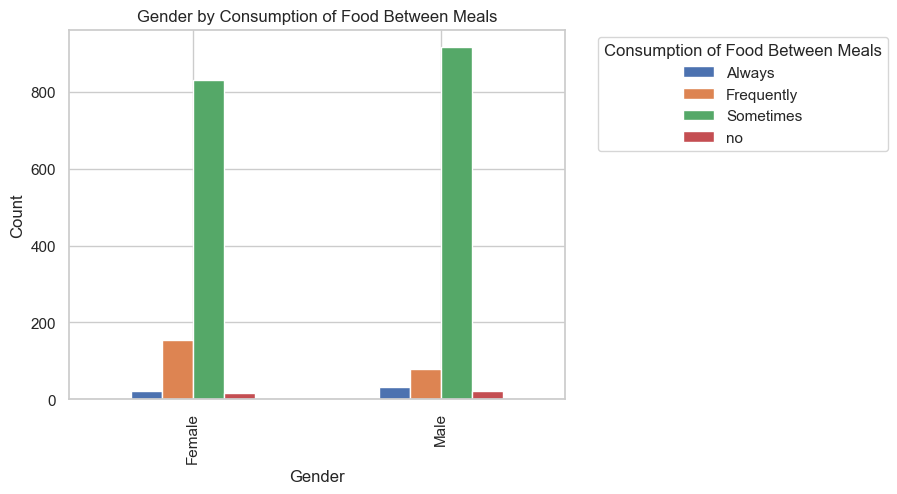

In [954]:
gender_caec = pd.crosstab(df.Gender,df.CAEC)
gender_caec.plot.bar()
print(gender_caec)
plt.title('Gender by Consumption of Food Between Meals')
plt.legend(title='Consumption of Food Between Meals',bbox_to_anchor=(1.05, 1),loc='upper left')
plt.ylabel('Count')

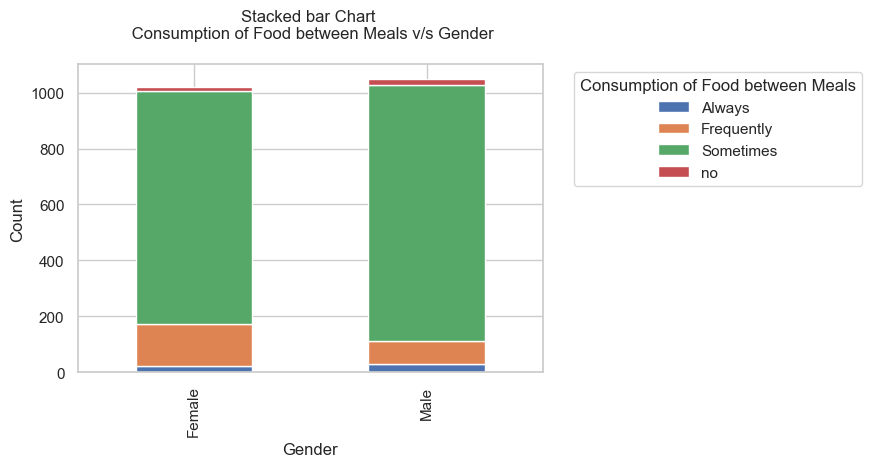

In [955]:
gender_caec.plot(kind='bar', stacked=True, figsize=(6, 4))
bar_width=.05
plt.xlabel('Gender')
plt.ylabel('Count')
plt.legend(title='Consumption of Food between Meals',bbox_to_anchor=(1.05, 1), loc='upper left')
plt.title('Stacked bar Chart \n Consumption of Food between Meals v/s Gender\n ')
plt.show()

In [956]:
chi_square('Gender','CAEC')

Actual values:

CAEC    Always  Frequently  Sometimes  no
Gender                                   
Female      21         153        832  15
Male        31          80        916  22
Expected values: 

[[ 25.64830918 114.92415459 862.17777778  18.24975845]
 [ 26.35169082 118.07584541 885.82222222  18.75024155]]

Chi-square is : 29.781964342901773 

p_value is : 1.5337534643137825e-06 

degree of freedom is :3

There is statistically significant correlation between Gender and CAEC at 0.05 significant level


### Gender and MTRANS (Mode of Transportation)

MTRANS  Automobile  Bike  Motorbike  Public_Transportation  Walking
Gender                                                             
Female         159     0          1                    841       20
Male           283     7         10                    715       34


Text(0, 0.5, 'Count')

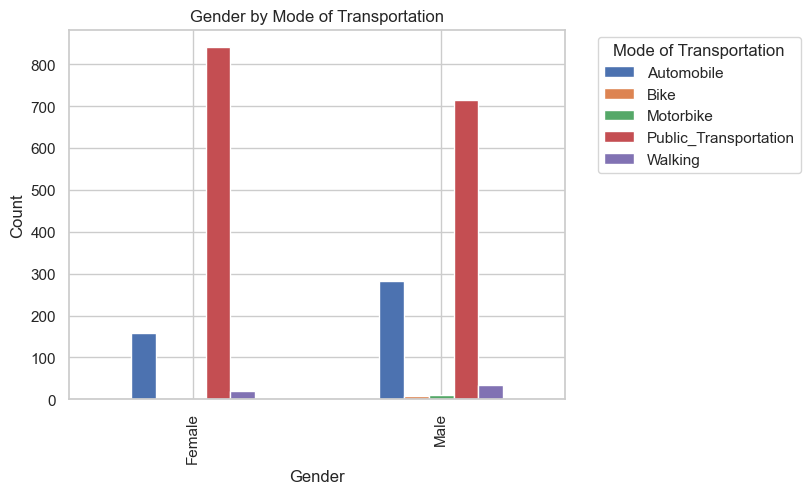

In [957]:
gender_mtrans = pd.crosstab(df.Gender,df.MTRANS)
gender_mtrans.plot.bar()
print(gender_mtrans )
plt.title('Gender by Mode of Transportation')
plt.legend(title='Mode of Transportation',bbox_to_anchor=(1.05, 1),loc='upper left')
plt.ylabel('Count')

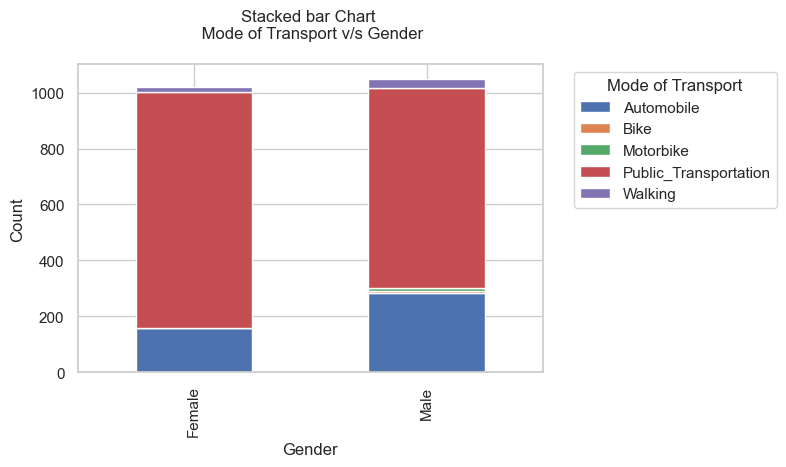

In [958]:
gender_mtrans.plot(kind='bar', stacked=True, figsize=(6, 4))
bar_width=.05
plt.xlabel('Gender')
plt.ylabel('Count')
plt.legend(title='Mode of Transport',bbox_to_anchor=(1.05, 1), loc='upper left')
plt.title('Stacked bar Chart \n Mode of Transport v/s Gender\n ')
plt.show()

In [959]:
chi_square('Gender','MTRANS')

Actual values:

MTRANS  Automobile  Bike  Motorbike  Public_Transportation  Walking
Gender                                                             
Female         159     0          1                    841       20
Male           283     7         10                    715       34
Expected values: 

[[218.01062802   3.452657     5.42560386 767.4763285   26.63478261]
 [223.98937198   3.547343     5.57439614 788.5236715   27.36521739]]

Chi-square is : 62.61639398402559 

p_value is : 8.172134960302233e-13 

degree of freedom is :4

********************************************
******************************************** 


### Family History with Overweight and FAVC(Frequent Consumption of High Caloric Food)

FAVC                             no   yes
family_history_with_overweight           
no                               97   264
yes                             143  1566


Text(0, 0.5, 'Count')

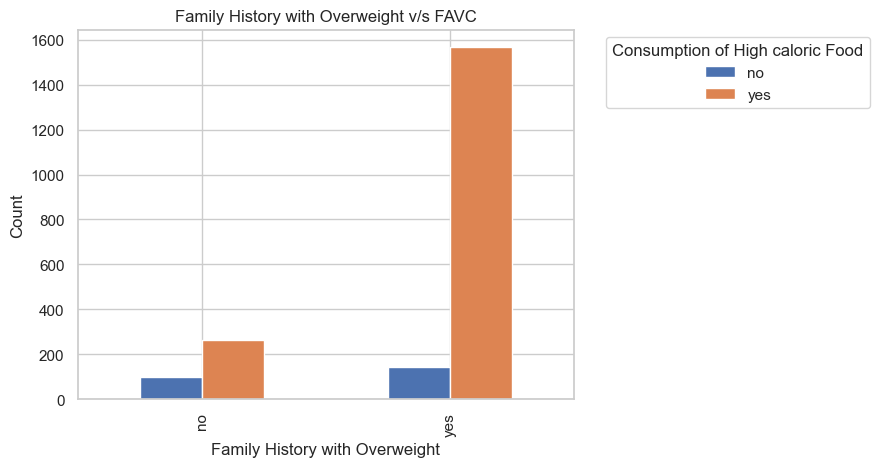

In [960]:
fh_favc = pd.crosstab(df.family_history_with_overweight,df.FAVC)
fh_favc.plot.bar()
print(fh_favc  )
plt.title('Family History with Overweight v/s FAVC')
plt.xlabel('Family History with Overweight')
plt.legend(title='Consumption of High caloric Food',bbox_to_anchor=(1.05, 1),loc='upper left')
plt.ylabel('Count')

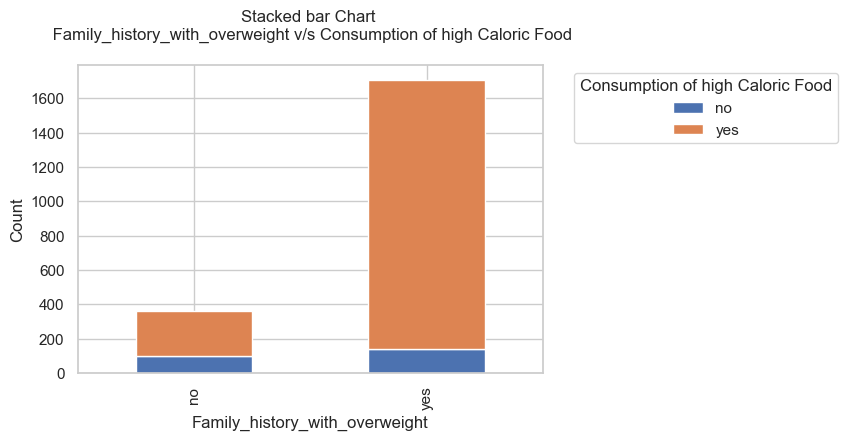

In [961]:
fh_favc.plot(kind='bar', stacked=True, figsize=(6, 4))
bar_width=.05
plt.xlabel('Family_history_with_overweight')
plt.ylabel('Count')
plt.legend(title='Consumption of high Caloric Food',bbox_to_anchor=(1.05, 1), loc='upper left')
plt.title('Stacked bar Chart \n Family_history_with_overweight v/s Consumption of high Caloric Food\n ')
plt.show()

In [962]:
chi_square('family_history_with_overweight','FAVC')

Actual values:

FAVC                             no   yes
family_history_with_overweight           
no                               97   264
yes                             143  1566
Expected values: 

[[  41.85507246  319.14492754]
 [ 198.14492754 1510.85507246]]

Chi-square is : 97.74603488859468 

p_value is : 4.756350971609411e-23 

degree of freedom is :1

There is statistically significant correlation between family_history_with_overweight and FAVC at 0.05 significant level


In [963]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2070 entries, 0 to 2110
Data columns (total 20 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Gender                          2070 non-null   object 
 1   Age                             2070 non-null   float64
 2   Height                          2070 non-null   float64
 3   Weight                          2070 non-null   float64
 4   family_history_with_overweight  2070 non-null   object 
 5   FAVC                            2070 non-null   object 
 6   FCVC                            2070 non-null   float64
 7   NCP                             2070 non-null   float64
 8   CAEC                            2070 non-null   object 
 9   SMOKE                           2070 non-null   object 
 10  CH2O                            2070 non-null   float64
 11  SCC                             2070 non-null   object 
 12  FAF                             2070 no

### Family History with Overweight and CAEC ( Consumption of food between meals)

CAEC                            Always  Frequently  Sometimes  no
family_history_with_overweight                                   
no                                  18         109        215  19
yes                                 34         124       1533  18


Text(0, 0.5, 'Count')

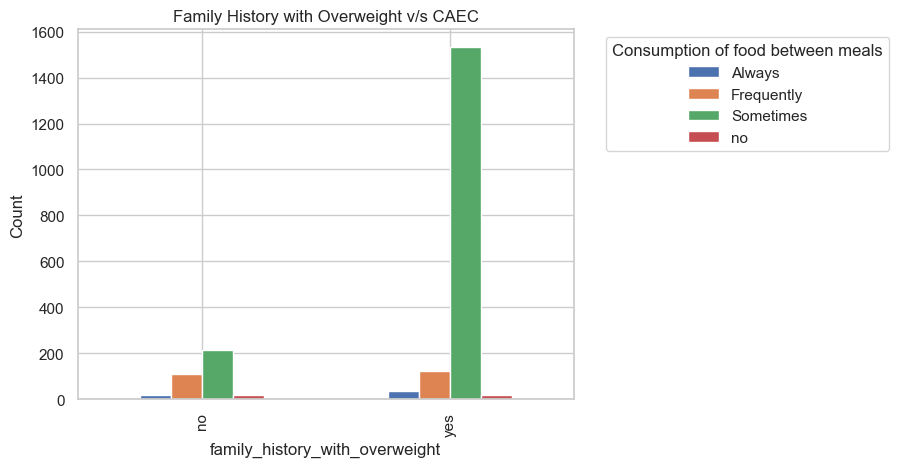

In [964]:
fh = pd.crosstab(df.family_history_with_overweight,df.CAEC)
fh.plot.bar()
print(fh)
plt.title('Family History with Overweight v/s CAEC')
plt.legend(title='Consumption of food between meals',bbox_to_anchor=(1.05, 1),loc='upper left')
plt.ylabel('Count')

Text(0, 0.5, 'Count')

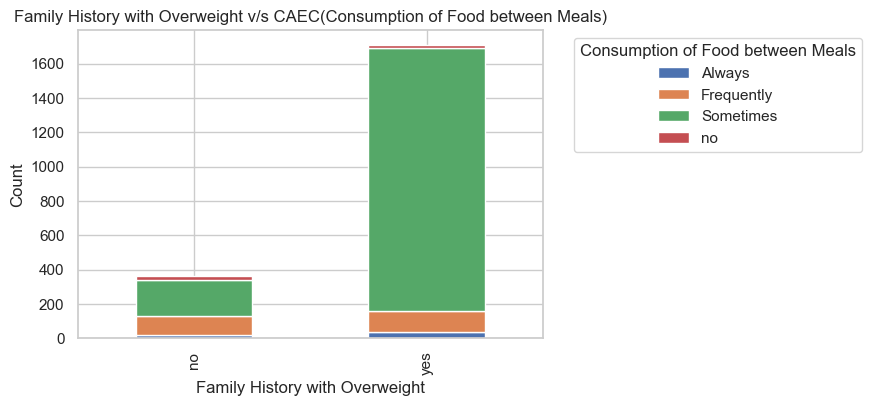

In [965]:
fh.plot(kind='bar', stacked=True, figsize=(6, 4))
plt.title('Family History with Overweight v/s CAEC(Consumption of Food between Meals)')
plt.xlabel('Family History with Overweight')
plt.legend(title='Consumption of Food between Meals',bbox_to_anchor=(1.05, 1),loc='upper left')
plt.ylabel('Count')

In [966]:
chi_square('family_history_with_overweight','CAEC')

Actual values:

CAEC                            Always  Frequently  Sometimes  no
family_history_with_overweight                                   
no                                  18         109        215  19
yes                                 34         124       1533  18
Expected values: 

[[   9.06859903   40.63429952  304.84444444    6.452657  ]
 [  42.93140097  192.36570048 1443.15555556   30.547343  ]]

Chi-square is : 211.59880673258309 

p_value is : 1.314128051516334e-45 

degree of freedom is :3

There is statistically significant correlation between family_history_with_overweight and CAEC at 0.05 significant level


### Family History with Overweight and MTRANS (Transportation Used)

MTRANS                          Automobile  Bike  Motorbike  \
family_history_with_overweight                                
no                                      47     2          5   
yes                                    395     5          6   

MTRANS                          Public_Transportation  Walking  
family_history_with_overweight                                  
no                                                289       18  
yes                                              1267       36  


Text(0, 0.5, 'Count')

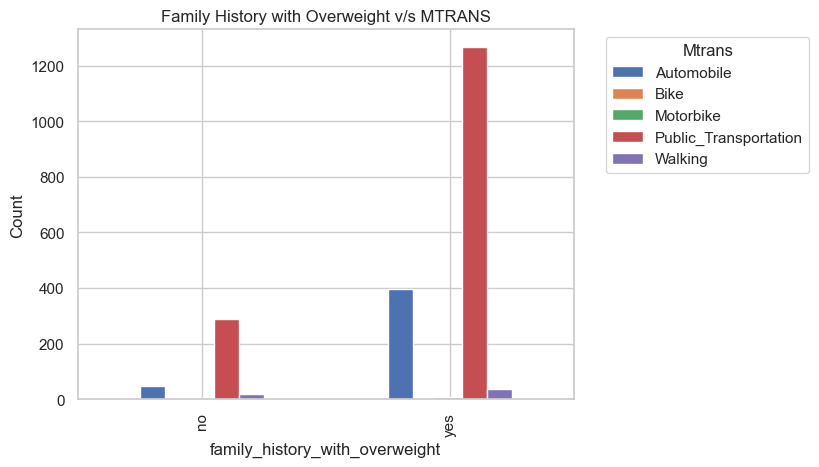

In [967]:
fh = pd.crosstab(df.family_history_with_overweight,df.MTRANS)
fh.plot.bar()
print(fh)
plt.title('Family History with Overweight v/s MTRANS')
plt.legend(title='Mtrans',bbox_to_anchor=(1.05, 1),loc='upper left')
plt.ylabel('Count')

In [968]:
chi_square('family_history_with_overweight','MTRANS')

Actual values:

MTRANS                          Automobile  Bike  Motorbike  \
family_history_with_overweight                                
no                                      47     2          5   
yes                                    395     5          6   

MTRANS                          Public_Transportation  Walking  
family_history_with_overweight                                  
no                                                289       18  
yes                                              1267       36  
Expected values: 

[[7.70830918e+01 1.22077295e+00 1.91835749e+00 2.71360386e+02
  9.41739130e+00]
 [3.64916908e+02 5.77922705e+00 9.08164251e+00 1.28463961e+03
  4.45826087e+01]]

Chi-square is : 31.681876087847098 

p_value is : 2.2219500797910605e-06 

degree of freedom is :4

********************************************
******************************************** 


### FAVC(consumption of high caloric food) and CAEC(Consumption of food between meals)

CAEC  Always  Frequently  Sometimes  no
FAVC                                   
no        12          65        154   9
yes       40         168       1594  28


Text(0, 0.5, 'Count')

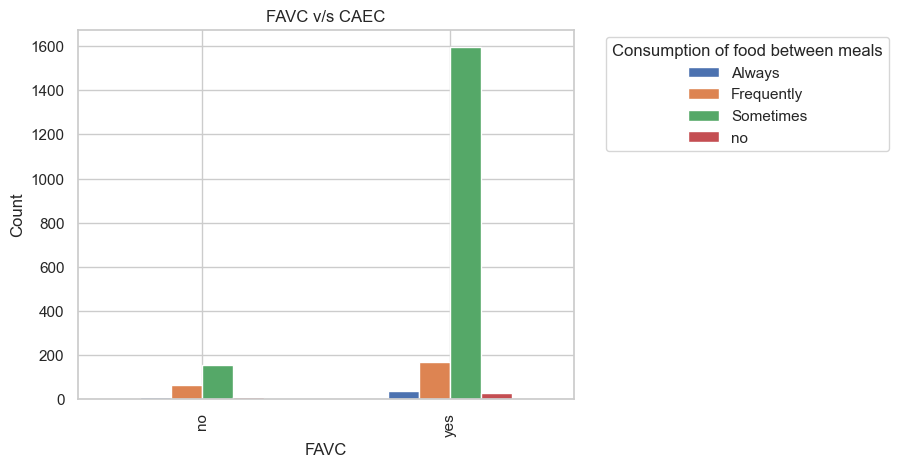

In [969]:
fc = pd.crosstab(df.FAVC,df.CAEC)
fc.plot.bar()
print(fc)
plt.title('FAVC v/s CAEC')
plt.legend(title='Consumption of food between meals',bbox_to_anchor=(1.05, 1),loc='upper left')
plt.ylabel('Count')

In [970]:
chi_square('FAVC','CAEC')

Actual values:

CAEC  Always  Frequently  Sometimes  no
FAVC                                   
no        12          65        154   9
yes       40         168       1594  28
Expected values: 

[[   6.02898551   27.01449275  202.66666667    4.28985507]
 [  45.97101449  205.98550725 1545.33333333   32.71014493]]

Chi-square is : 86.17493837524563 

p_value is : 1.4518949746679941e-18 

degree of freedom is :3

********************************************
******************************************** 


### FAVC and MTRANS

MTRANS  Automobile  Bike  Motorbike  Public_Transportation  Walking
FAVC                                                               
no              36     4          3                    173       24
yes            406     3          8                   1383       30


Text(0, 0.5, 'Count')

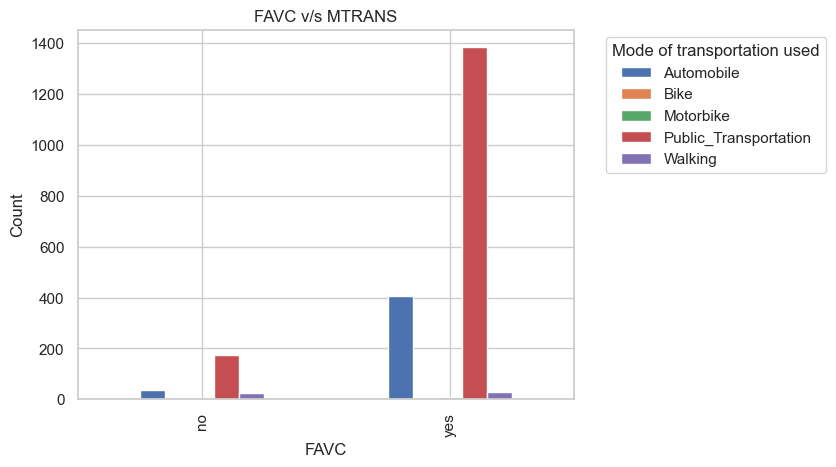

In [971]:
fc = pd.crosstab(df.FAVC,df.MTRANS)
fc.plot.bar()
print(fc)
plt.title('FAVC v/s MTRANS')
plt.legend(title='Mode of transportation used',bbox_to_anchor=(1.05, 1),loc='upper left')
plt.ylabel('Count')

In [972]:
chi_square('FAVC','MTRANS')

Actual values:

MTRANS  Automobile  Bike  Motorbike  Public_Transportation  Walking
FAVC                                                               
no              36     4          3                    173       24
yes            406     3          8                   1383       30
Expected values: 

[[5.12463768e+01 8.11594203e-01 1.27536232e+00 1.80405797e+02
  6.26086957e+00]
 [3.90753623e+02 6.18840580e+00 9.72463768e+00 1.37559420e+03
  4.77391304e+01]]

Chi-square is : 79.13385267821411 

p_value is : 2.657506457724751e-16 

degree of freedom is :4

********************************************
******************************************** 


### CAEC and MTRANS

MTRANS      Automobile  Bike  Motorbike  Public_Transportation  Walking
CAEC                                                                   
Always              12     1          1                     32        6
Frequently          22     0          5                    196       10
Sometimes          405     6          5                   1296       36
no                   3     0          0                     32        2


Text(0, 0.5, 'Count')

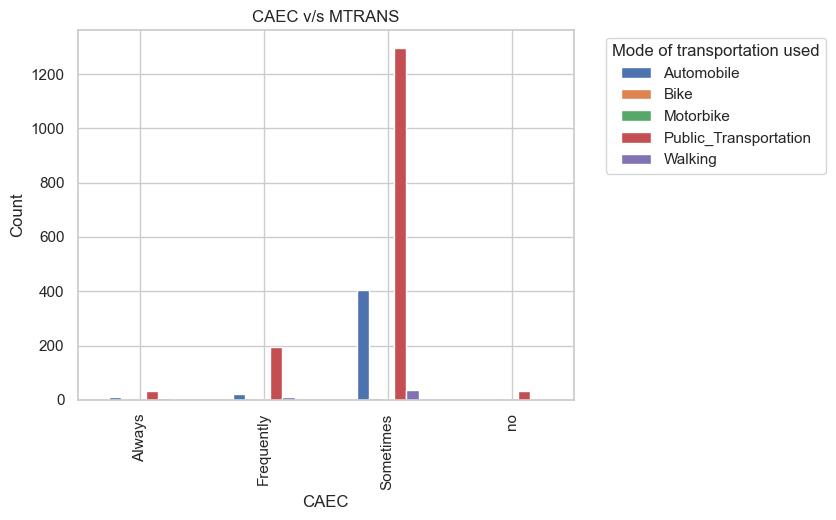

In [973]:
fc = pd.crosstab(df.CAEC,df.MTRANS)
fc.plot.bar()
print(fc)
plt.title('CAEC v/s MTRANS')
plt.legend(title='Mode of transportation used',bbox_to_anchor=(1.05, 1),loc='upper left')
plt.ylabel('Count')

In [974]:
chi_square('CAEC','MTRANS')

Actual values:

MTRANS      Automobile  Bike  Motorbike  Public_Transportation  Walking
CAEC                                                                   
Always              12     1          1                     32        6
Frequently          22     0          5                    196       10
Sometimes          405     6          5                   1296       36
no                   3     0          0                     32        2
Expected values: 

[[1.11033816e+01 1.75845411e-01 2.76328502e-01 3.90879227e+01
  1.35652174e+00]
 [4.97516908e+01 7.87922705e-01 1.23816425e+00 1.75143961e+02
  6.07826087e+00]
 [3.73244444e+02 5.91111111e+00 9.28888889e+00 1.31395556e+03
  4.56000000e+01]
 [7.90048309e+00 1.25120773e-01 1.96618357e-01 2.78125604e+01
  9.65217391e-01]]

Chi-square is : 67.7726620112173 

p_value is : 8.341013006646206e-10 

degree of freedom is :12

********************************************
******************************************** 


### SMOKE and FAVC

Text(0, 0.5, 'Count')

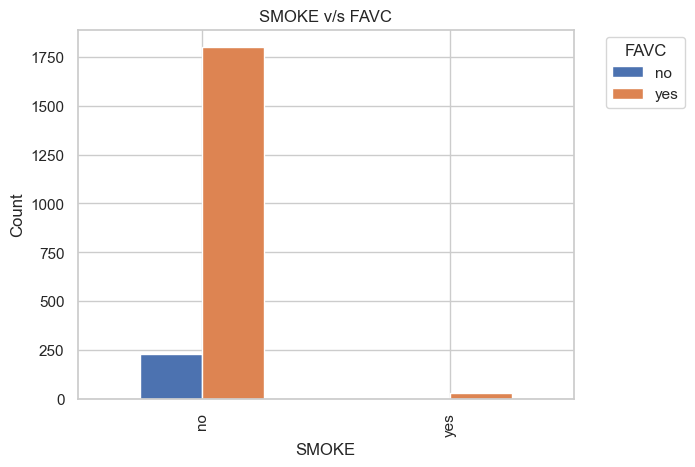

In [975]:
fc=pd.crosstab(df.SMOKE,df.FAVC)
fc.plot.bar()
plt.title('SMOKE v/s FAVC')
plt.legend(title='FAVC',bbox_to_anchor=(1.05, 1),loc='upper left')
plt.ylabel('Count')

In [976]:
chi_square('SMOKE','FAVC')

Actual values:

FAVC    no   yes
SMOKE           
no     232  1797
yes      8    33
Expected values: 

[[ 235.24637681 1793.75362319]
 [   4.75362319   36.24637681]]

Chi-square is : 1.8310619936352717 

p_value is : 0.17600215958561966 

degree of freedom is :1

********************************************
******************************************** 


### Gender and SCC ( Calories Consumption Monitoring )

SCC       no  yes
Gender           
Female   955   66
Male    1021   28


Text(0.5, 0, 'Count')

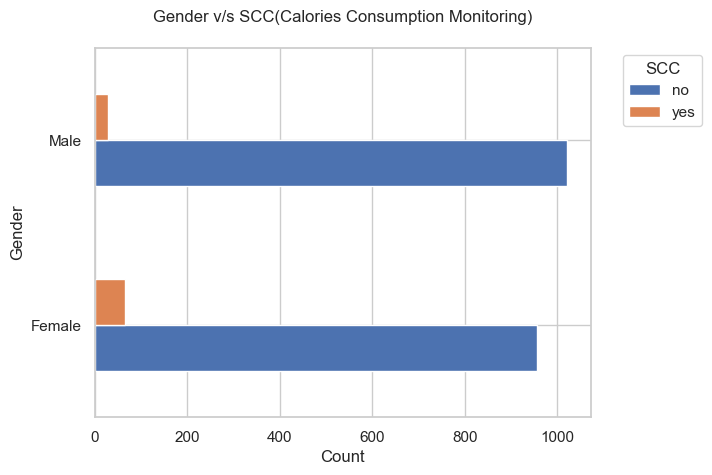

In [977]:
fc = pd.crosstab(df.Gender,df.SCC)
fc.plot.barh()
print(fc)
plt.title('Gender v/s SCC(Calories Consumption Monitoring)\n')
plt.legend(title='SCC',bbox_to_anchor=(1.05, 1),loc='upper left')
plt.ylabel('Gender')
plt.xlabel('Count')

In [978]:
chi_square('Gender','SCC')

Actual values:

SCC       no  yes
Gender           
Female   955   66
Male    1021   28
Expected values: 

[[ 974.63574879   46.36425121]
 [1001.36425121   47.63574879]]

Chi-square is : 16.326230900021628 

p_value is : 5.332074359077816e-05 

degree of freedom is :1

There is statistically significant correlation between Gender and SCC at 0.05 significant level


### Gender and NObeyesdad ( target varaible)

NObeyesdad  Insufficient_Weight  Normal_Weight  Obesity_Type_I  \
Gender                                                           
Female                      169            131             153   
Male                         98            149             196   

NObeyesdad  Obesity_Type_II  Obesity_Type_III  Overweight_Level_I  \
Gender                                                              
Female                    2               323                 145   
Male                    295                 1                 130   

NObeyesdad  Overweight_Level_II  
Gender                           
Female                       98  
Male                        180  


Text(0, 0.5, 'Count')

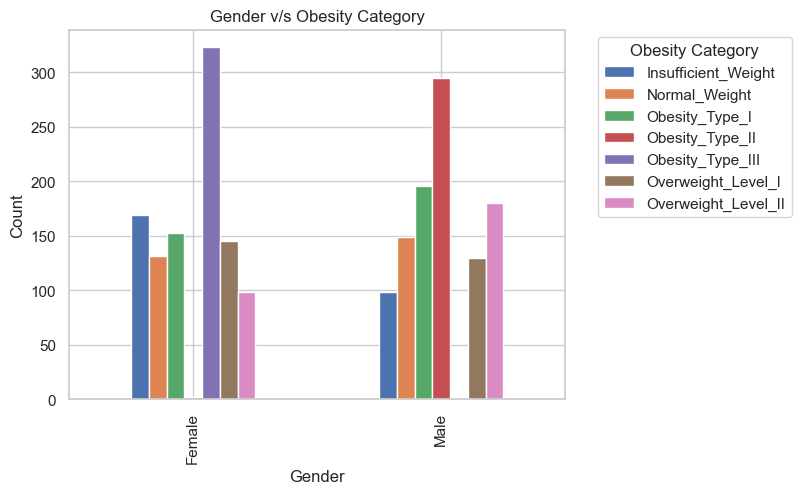

In [979]:
fc = pd.crosstab(df.Gender,df.NObeyesdad)
print(fc)
fc.plot.bar()
plt.title('Gender v/s Obesity Category')
plt.legend(title='Obesity Category',bbox_to_anchor=(1.05, 1),loc='upper left')
plt.ylabel('Count')

In [980]:
chi_square('Gender','NObeyesdad')

Actual values:

NObeyesdad  Insufficient_Weight  Normal_Weight  Obesity_Type_I  \
Gender                                                           
Female                      169            131             153   
Male                         98            149             196   

NObeyesdad  Obesity_Type_II  Obesity_Type_III  Overweight_Level_I  \
Gender                                                              
Female                    2               323                 145   
Male                    295                 1                 130   

NObeyesdad  Overweight_Level_II  
Gender                           
Female                       98  
Male                        180  
Expected values: 

[[131.6942029  138.10628019 172.13961353 146.49130435 159.80869565
  135.64009662 137.11980676]
 [135.3057971  141.89371981 176.86038647 150.50869565 164.19130435
  139.35990338 140.88019324]]

Chi-square is : 659.1485960530829 

p_value is : 4.029147228695315e-139 

degree of freedom i

### Family History with Overweight v/s Obesity category

Text(0, 0.5, 'Count')

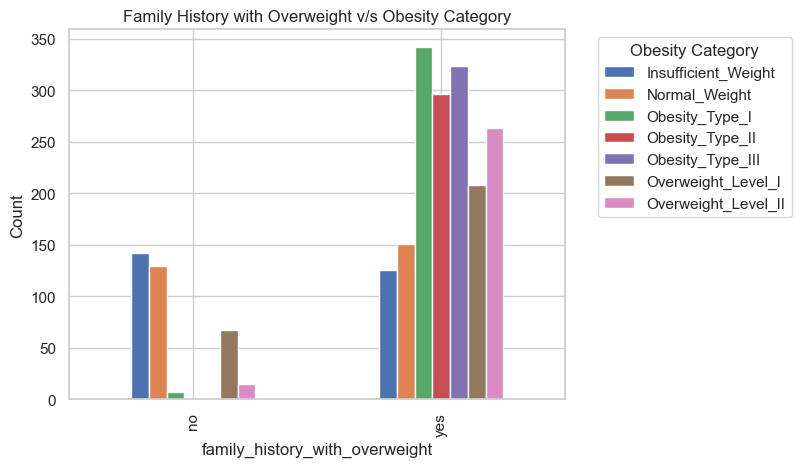

In [981]:
fc=pd.crosstab(df.family_history_with_overweight,df.NObeyesdad)
fc.plot.bar()
plt.title('Family History with Overweight v/s Obesity Category')
plt.legend(title='Obesity Category',bbox_to_anchor=(1.05, 1),loc='upper left')
plt.ylabel('Count')

In [982]:
chi_square('family_history_with_overweight','NObeyesdad')

Actual values:

NObeyesdad                      Insufficient_Weight  Normal_Weight  \
family_history_with_overweight                                       
no                                              142            129   
yes                                             125            151   

NObeyesdad                      Obesity_Type_I  Obesity_Type_II  \
family_history_with_overweight                                    
no                                           7                1   
yes                                        342              296   

NObeyesdad                      Obesity_Type_III  Overweight_Level_I  \
family_history_with_overweight                                         
no                                             0                  67   
yes                                          324                 208   

NObeyesdad                      Overweight_Level_II  
family_history_with_overweight                       
no                                   

### FAVC v/s Obesity Category

Text(0.5, 0, 'FAVC (Consumption of High Caloric Food) ')

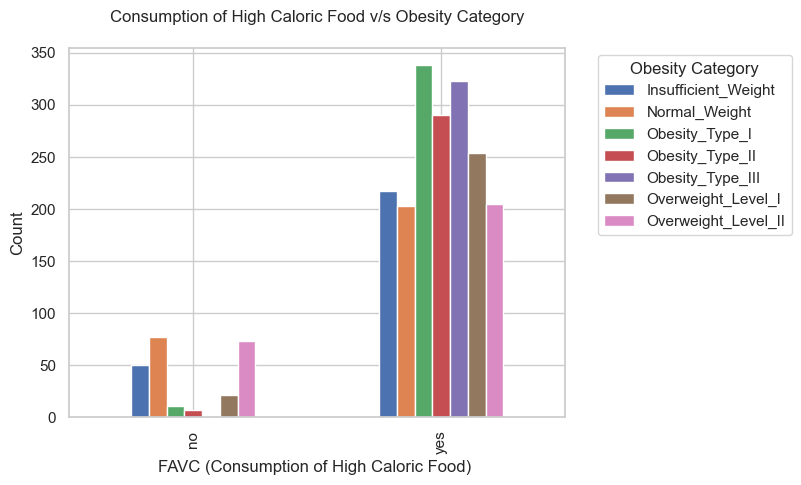

In [983]:
fc=pd.crosstab(df.FAVC,df.NObeyesdad)
fc.plot.bar()
plt.title('Consumption of High Caloric Food v/s Obesity Category\n')
plt.legend(title='Obesity Category',bbox_to_anchor=(1.05, 1),loc='upper left')
plt.ylabel('Count')
plt.xlabel('FAVC (Consumption of High Caloric Food) ')

In [984]:
chi_square('FAVC','NObeyesdad')

Actual values:

NObeyesdad  Insufficient_Weight  Normal_Weight  Obesity_Type_I  \
FAVC                                                             
no                           50             77              11   
yes                         217            203             338   

NObeyesdad  Obesity_Type_II  Obesity_Type_III  Overweight_Level_I  \
FAVC                                                                
no                        7                 1                  21   
yes                     290               323                 254   

NObeyesdad  Overweight_Level_II  
FAVC                             
no                           73  
yes                         205  
Expected values: 

[[ 30.95652174  32.46376812  40.46376812  34.43478261  37.56521739
   31.88405797  32.23188406]
 [236.04347826 247.53623188 308.53623188 262.56521739 286.43478261
  243.11594203 245.76811594]]

Chi-square is : 234.1444628338111 

p_value is : 9.98786374005365e-48 

degree of freedom is 

### CAEC v/s Obesity category

Text(0, 0.5, 'Count')

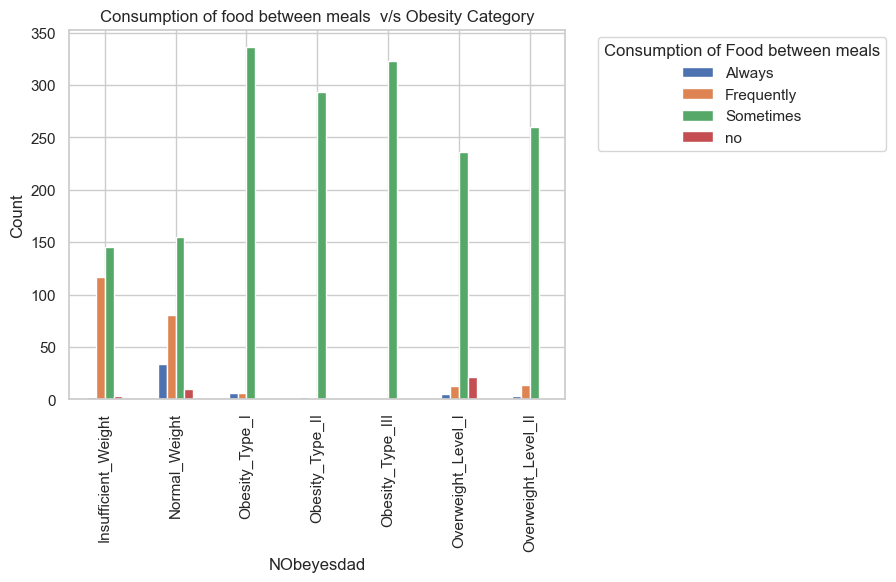

In [985]:
fc=pd.crosstab(df.NObeyesdad,df.CAEC)
fc.plot.bar()
plt.title('Consumption of food between meals  v/s Obesity Category')
plt.legend(title='Consumption of Food between meals',bbox_to_anchor=(1.05, 1),loc='upper left')
plt.ylabel('Count')

In [986]:
chi_square('NObeyesdad','CAEC')

Actual values:

CAEC                 Always  Frequently  Sometimes  no
NObeyesdad                                            
Insufficient_Weight       2         117        145   3
Normal_Weight            34          81        155  10
Obesity_Type_I            6           6        336   1
Obesity_Type_II           2           1        293   1
Obesity_Type_III          0           1        323   0
Overweight_Level_I        5          13        236  21
Overweight_Level_II       3          14        260   1
Expected values: 

[[  6.70724638  30.05362319 225.46666667   4.77246377]
 [  7.03381643  31.51690821 236.44444444   5.00483092]
 [  8.76714976  39.28357488 294.71111111   6.23816425]
 [  7.46086957  33.43043478 250.8          5.30869565]
 [  8.13913043  36.46956522 273.6          5.79130435]
 [  6.90821256  30.95410628 232.22222222   4.91545894]
 [  6.98357488  31.29178744 234.75555556   4.96908213]]

Chi-square is : 722.3379229986759 

p_value is : 1.028433046830188e-141 

degree of

### SMOKE and Obesity Category

Text(0, 0.5, 'Count')

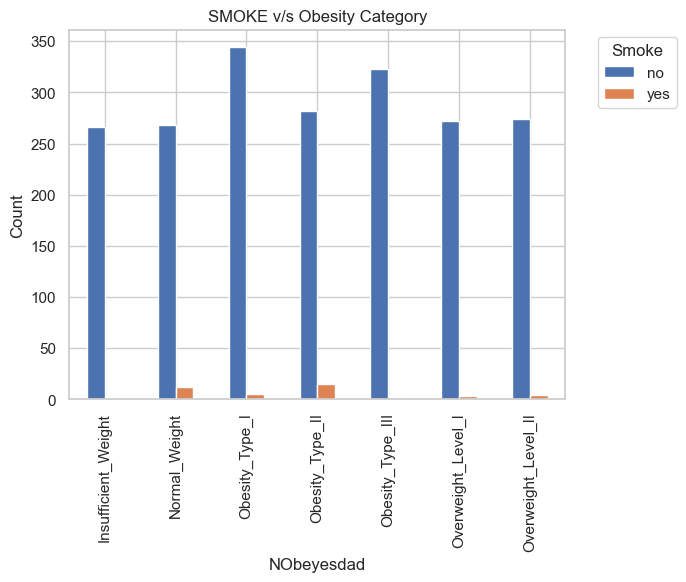

In [987]:
fc=pd.crosstab(df.NObeyesdad,df.SMOKE)
fc.plot.bar()
plt.title('SMOKE v/s Obesity Category')
plt.legend(title='Smoke',bbox_to_anchor=(1.05, 1),loc='upper left')
plt.ylabel('Count')

In [988]:
chi_square('NObeyesdad','SMOKE')

Actual values:

SMOKE                 no  yes
NObeyesdad                   
Insufficient_Weight  266    1
Normal_Weight        268   12
Obesity_Type_I       344    5
Obesity_Type_II      282   15
Obesity_Type_III     323    1
Overweight_Level_I   272    3
Overweight_Level_II  274    4
Expected values: 

[[261.7115942    5.2884058 ]
 [274.45410628   5.54589372]
 [342.08743961   6.91256039]
 [291.1173913    5.8826087 ]
 [317.5826087    6.4173913 ]
 [269.5531401    5.4468599 ]
 [272.49371981   5.50628019]]

Chi-square is : 32.374350415082844 

p_value is : 1.3830753969817096e-05 

degree of freedom is :6

There is statistically significant correlation between NObeyesdad and SMOKE at 0.05 significant level


### SCC v/s Obesity Category

Text(0, 0.5, 'Obesity Category')

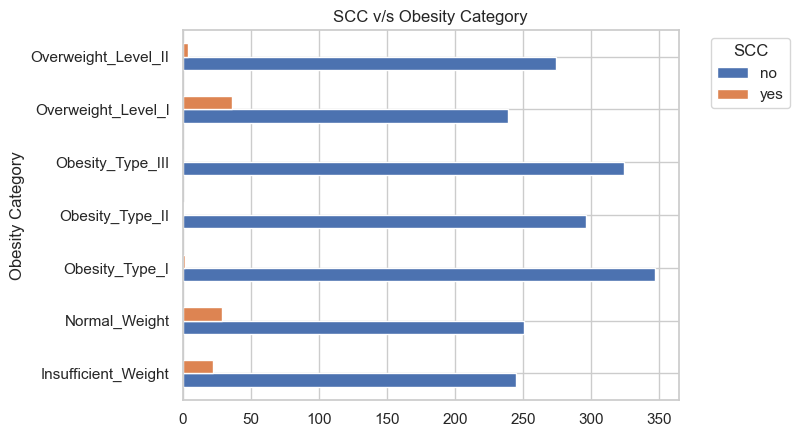

In [989]:
fc=pd.crosstab(df.NObeyesdad,df.SCC)
fc.plot.barh()
plt.title('SCC v/s Obesity Category')
plt.legend(title='SCC',bbox_to_anchor=(1.05, 1),loc='upper left')
plt.ylabel('Obesity Category')

In [990]:
chi_square('NObeyesdad','SCC')

Actual values:

SCC                   no  yes
NObeyesdad                   
Insufficient_Weight  245   22
Normal_Weight        251   29
Obesity_Type_I       347    2
Obesity_Type_II      296    1
Obesity_Type_III     324    0
Overweight_Level_I   239   36
Overweight_Level_II  274    4
Expected values: 

[[254.87536232  12.12463768]
 [267.28502415  12.71497585]
 [333.15169082  15.84830918]
 [283.51304348  13.48695652]
 [309.28695652  14.71304348]
 [262.51207729  12.48792271]
 [265.37584541  12.62415459]]

Chi-square is : 123.02191941028774 

p_value is : 3.776792169602823e-24 

degree of freedom is :6

There is statistically significant correlation between NObeyesdad and SCC at 0.05 significant level


### CALC v/s NObeyesdad

Text(0, 0.5, 'Count')

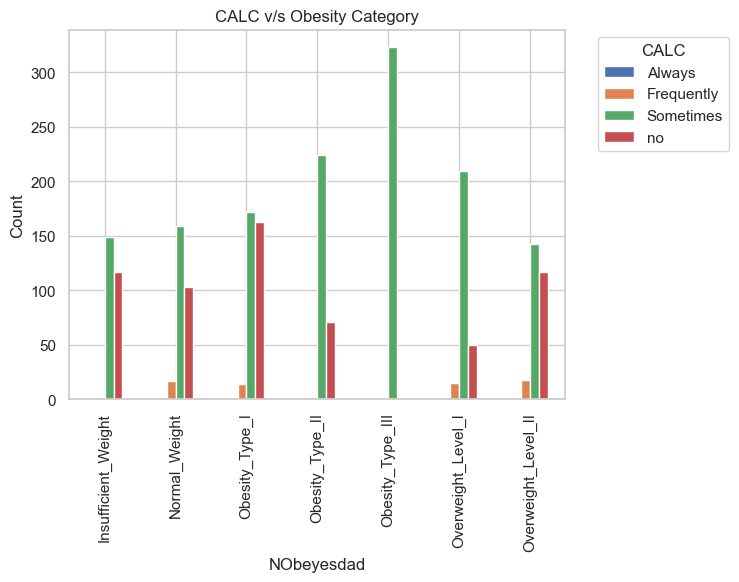

In [991]:
fc=pd.crosstab(df.NObeyesdad,df.CALC)
fc.plot.bar()
plt.title('CALC v/s Obesity Category')
plt.legend(title='CALC',bbox_to_anchor=(1.05, 1),loc='upper left')
plt.ylabel('Count')

In [992]:
chi_square('NObeyesdad','CALC')

Actual values:

CALC                 Always  Frequently  Sometimes   no
NObeyesdad                                             
Insufficient_Weight       0           1        149  117
Normal_Weight             1          17        159  103
Obesity_Type_I            0          14        172  163
Obesity_Type_II           0           2        224   71
Obesity_Type_III          0           0        323    1
Overweight_Level_I        0          15        210   50
Overweight_Level_II       0          18        143  117
Expected values: 

[[1.28985507e-01 8.64202899e+00 1.78000000e+02 8.02289855e+01]
 [1.35265700e-01 9.06280193e+00 1.86666667e+02 8.41352657e+01]
 [1.68599034e-01 1.12961353e+01 2.32666667e+02 1.04868599e+02]
 [1.43478261e-01 9.61304348e+00 1.98000000e+02 8.92434783e+01]
 [1.56521739e-01 1.04869565e+01 2.16000000e+02 9.73565217e+01]
 [1.32850242e-01 8.90096618e+00 1.83333333e+02 8.26328502e+01]
 [1.34299517e-01 8.99806763e+00 1.85333333e+02 8.35342995e+01]]

Chi-square is : 32

### NObeyesdad v/s MTRANS

In [993]:
chi_square('NObeyesdad','MTRANS')

Actual values:

MTRANS               Automobile  Bike  Motorbike  Public_Transportation  \
NObeyesdad                                                                
Insufficient_Weight          46     0          0                    215   
Normal_Weight                44     4          6                    195   
Obesity_Type_I              108     0          3                    236   
Obesity_Type_II              95     1          0                    200   
Obesity_Type_III              1     0          0                    323   
Overweight_Level_I           66     2          1                    198   
Overweight_Level_II          82     0          1                    189   

MTRANS               Walking  
NObeyesdad                    
Insufficient_Weight        6  
Normal_Weight             31  
Obesity_Type_I             2  
Obesity_Type_II            1  
Obesity_Type_III           0  
Overweight_Level_I         8  
Overweight_Level_II        6  
Expected values: 

[[ 57.0115

In [994]:
category_cols=df[['Gender', 'family_history_with_overweight', 'FAVC', 'CAEC', 'SMOKE',
       'SCC', 'CALC', 'MTRANS', 'NObeyesdad']].astype('object')

In [995]:
category_cols

,Gender,family_history_with_overweight,FAVC,CAEC,SMOKE,SCC,CALC,MTRANS,NObeyesdad
0,Male,yes,no,Sometimes,no,no,no,Public_Transportation,Normal_Weight
1,Male,yes,no,Sometimes,yes,yes,Sometimes,Public_Transportation,Normal_Weight
2,Male,yes,no,Sometimes,no,no,Frequently,Public_Transportation,Normal_Weight
3,Male,no,no,Sometimes,no,no,Frequently,Walking,Overweight_Level_I
4,Male,no,no,Sometimes,no,no,Sometimes,Public_Transportation,Overweight_Level_II
...,...,...,...,...,...,...,...,...,...
2106,Female,yes,yes,Sometimes,no,no,Sometimes,Public_Transportation,Obesity_Type_III
2107,Female,yes,yes,Sometimes,no,no,Sometimes,Public_Transportation,Obesity_Type_III
2108,Female,yes,yes,Sometimes,no,no,Sometimes,Public_Transportation,Obesity_Type_III
2109,Female,yes,yes,Sometimes,no,no,Sometimes,Public_Transportation,Obesity_Type_III


In [996]:
def cramers_V(var1,var2) :
    crosstab =np.array(pd.crosstab(var1,var2, rownames=None, colnames=None)) # Cross table building
    stat = chi2_contingency(crosstab)[0] # Keeping of the test statistic of the Chi2 test
    obs = np.sum(crosstab) # Number of observations
    mini = min(crosstab.shape)-1 # Take the minimum value between the columns and the rows of the cross table
    return np.sqrt((stat/(obs*mini)))

In [997]:
rows = []

for var1 in category_cols:
    col = []
    for var2 in category_cols:
        cramers = cramers_V(category_cols[var1], category_cols[var2])  # Cramer's V test
        col.append(round(cramers, 2))  # Keeping of the rounded value of the Cramer's V
    rows.append(col)
rows

[[1.0, 0.12, 0.05, 0.12, 0.06, 0.09, 0.05, 0.17, 0.56],
 [0.12, 1.0, 0.22, 0.32, 0.01, 0.2, 0.03, 0.12, 0.55],
 [0.05, 0.22, 1.0, 0.2, 0.03, 0.18, 0.14, 0.2, 0.34],
 [0.12, 0.32, 0.2, 1.0, 0.07, 0.18, 0.1, 0.1, 0.34],
 [0.06, 0.01, 0.03, 0.07, 0.99, 0.03, 0.11, 0.04, 0.13],
 [0.09, 0.2, 0.18, 0.18, 0.03, 0.99, 0.06, 0.08, 0.24],
 [0.05, 0.03, 0.14, 0.1, 0.11, 0.06, 1.0, 0.1, 0.23],
 [0.17, 0.12, 0.2, 0.1, 0.04, 0.08, 0.1, 1.0, 0.18],
 [0.56, 0.55, 0.34, 0.34, 0.13, 0.24, 0.23, 0.18, 1.0]]

In [998]:
cramers_results = np.array(rows)
df_cramers = pd.DataFrame(cramers_results, columns=category_cols.columns, index=category_cols.columns)
print(df_cramers)

                                Gender  family_history_with_overweight  FAVC  \
Gender                            1.00                            0.12  0.05   
family_history_with_overweight    0.12                            1.00  0.22   
FAVC                              0.05                            0.22  1.00   
CAEC                              0.12                            0.32  0.20   
SMOKE                             0.06                            0.01  0.03   
SCC                               0.09                            0.20  0.18   
CALC                              0.05                            0.03  0.14   
MTRANS                            0.17                            0.12  0.20   
NObeyesdad                        0.56                            0.55  0.34   

                                CAEC  SMOKE  SCC  CALC  MTRANS  NObeyesdad  
Gender                          0.12   0.06 0.09  0.05    0.17        0.56  
family_history_with_overweight  0.32   0.01 0

(array([0.5, 1.5, 2.5, 3.5, 4.5, 5.5, 6.5, 7.5, 8.5]),
 [Text(0, 0.5, 'Gender'),
  Text(0, 1.5, 'family_history_with_overweight'),
  Text(0, 2.5, 'FAVC'),
  Text(0, 3.5, 'CAEC'),
  Text(0, 4.5, 'SMOKE'),
  Text(0, 5.5, 'SCC'),
  Text(0, 6.5, 'CALC'),
  Text(0, 7.5, 'MTRANS'),
  Text(0, 8.5, 'NObeyesdad')])

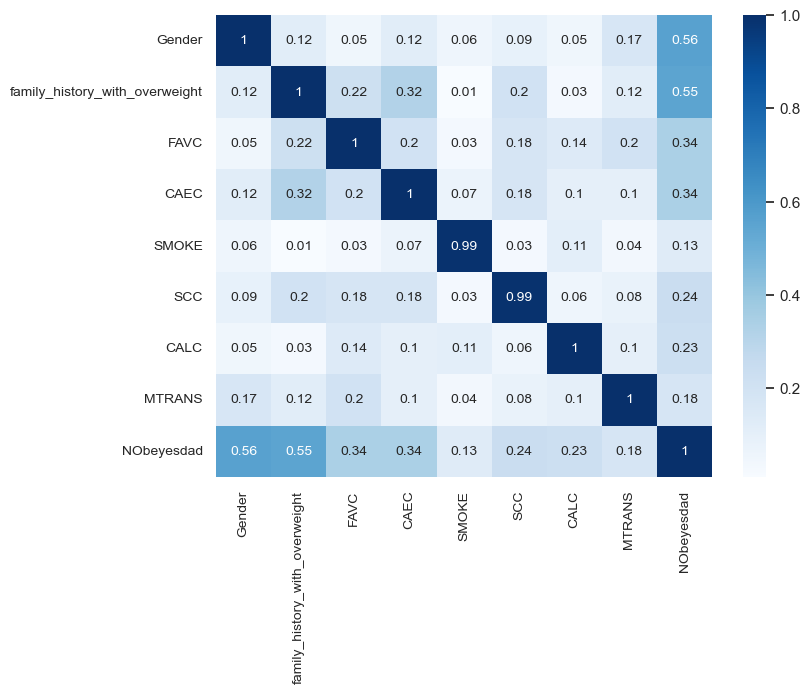

In [999]:
plt.figure(figsize=(8,6))
sns.heatmap(df_cramers, cmap="Blues", annot=True, annot_kws={'size':10})
plt.xticks(fontsize=10)  # Change font size for x-axis labels
plt.yticks(fontsize=10)

In [1000]:
category_cols.nunique()

Gender                            2
family_history_with_overweight    2
FAVC                              2
CAEC                              4
SMOKE                             2
SCC                               2
CALC                              4
MTRANS                            5
NObeyesdad                        7
dtype: int64

#### Correlation Matrix 

In [1001]:
num_corr=df[['Age', 'Height', 'Weight', 'FCVC', 'NCP', 'CH2O', 'FAF', 'TUE']]

In [1002]:
num_corr.corr(method='spearman')

,Age,Height,Weight,FCVC,NCP,CH2O,FAF,TUE
Age,1.00,-0.01,0.36,0.06,-0.12,0.02,-0.21,-0.30
Height,-0.01,1.00,0.46,-0.06,0.19,0.24,0.33,0.07
Weight,0.36,0.46,1.00,0.21,-0.01,0.23,-0.05,-0.06
FCVC,0.06,-0.06,0.21,1.00,0.08,0.08,0.03,-0.10
NCP,-0.12,0.19,-0.01,0.08,1.00,0.09,0.14,0.07
CH2O,0.02,0.24,0.23,0.08,0.09,1.00,0.15,0.03
FAF,-0.21,0.33,-0.05,0.03,0.14,0.15,1.00,0.05
TUE,-0.30,0.07,-0.06,-0.10,0.07,0.03,0.05,1.00


Text(0.5, 1.0, 'Correlation between variables')

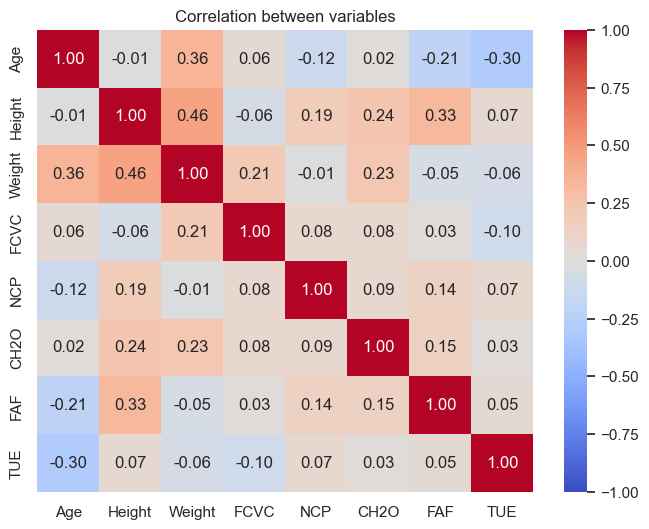

In [1003]:
plt.figure(figsize=(8,6))
sns.heatmap(num_corr.corr(method='spearman'),
           annot = True,
           vmin = -1,
           vmax = 1,
           center = 0,
           cmap = 'coolwarm',
           fmt='.2f')
plt.title('Correlation between variables')

**Comments:**<br>

Height and Weight (0.46): This correlation coefficient indicates a moderate positive correlation between height and weight. As height increases, weight tends to increase as well, and vice versa.<br>

Age and Weight (0.35): This coefficient suggests a moderate positive correlation between age and weight. It implies that as age increases, weight tends to increase, and vice versa, though the relationship might not be as strong as with height.<br>

Height and FAF (0.33): This indicates a moderate positive correlation between height and FAF (Physical Activity Frequency). Taller individuals may engage in physical activity more frequently, and vice versa.<br>

Height and CH2O (0.23): A moderate positive correlation between height and CH2O (Consumption of water daily). Taller individuals may have higher water consumption, and vice versa, though the relationship is not very strong.<br>

Weight and CH2O (0.23): Similar to the correlation between height and CH2O, this suggests a moderate positive correlation between weight and CH2O. Heavier individuals may tend to consume more water, and vice versa.<br>

Height and NCP (0.19): This indicates a positive correlation between height and NCP (Number of main meals). Taller individuals may consume more main meals, and vice versa, but the correlation is not as strong as with some other variables.<br>

Height and FCVC (0.21): A moderate positive correlation between height and FCVC (Frequency of consumption of vegetables). Taller individuals may consume vegetables more frequently, and vice versa.<br>

Age and TUE (-0.31): This indicates a moderate negative correlation between age and TUE (Time using technology devices). As age increases, time spent using technology devices tends to decrease, and vice versa.<br>


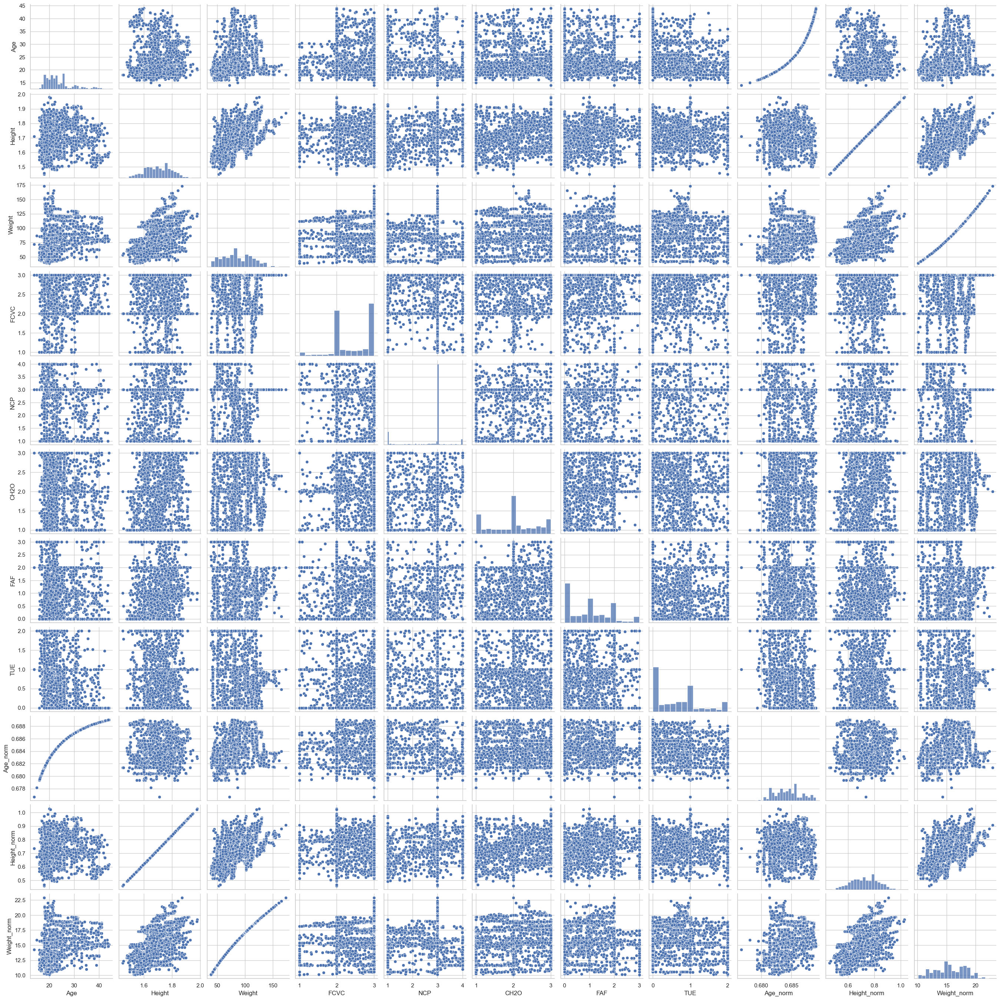

In [1004]:
sns.pairplot(df)

## Feature Engineering

In [1005]:
df.head()

,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad,Age_norm,Height_norm,Weight_norm
0,Male,21.00,1.62,64.00,yes,no,2.00,3.00,Sometimes,no,2.00,no,0.00,1.00,no,Public_Transportation,Normal_Weight,0.68,0.64,13.38
1,Male,21.00,1.52,56.00,yes,no,3.00,3.00,Sometimes,yes,3.00,yes,3.00,0.00,Sometimes,Public_Transportation,Normal_Weight,0.68,0.53,12.41
2,Male,23.00,1.80,77.00,yes,no,2.00,3.00,Sometimes,no,2.00,no,2.00,1.00,Frequently,Public_Transportation,Normal_Weight,0.68,0.83,14.82
3,Male,27.00,1.80,87.00,no,no,3.00,3.00,Sometimes,no,2.00,no,2.00,0.00,Frequently,Walking,Overweight_Level_I,0.69,0.83,15.85
4,Male,22.00,1.78,89.80,no,no,2.00,1.00,Sometimes,no,2.00,no,0.00,0.00,Sometimes,Public_Transportation,Overweight_Level_II,0.68,0.81,16.13


### New Feature, BMI
We often hear about body mass index (BMI) and may have already used it. BMI is commonly used to assess whether our weight is excessive or insufficient. BMI is calculated by dividing body weight (in kilograms) by the square of height (in meters).

Based on the calculated BMI, we can determine if we are underweight, normal weight, overweight, or obese according to the following commonly used scale:

**Underweight: BMI < 18.5<br>
Normal weight: BMI 18.5 - 24.9<br>
Overweight: BMI 25 - 29.9<br>
Obesity: BMI ≥ 30**<br>

These categories help us evaluate our weight status and understand if we fall within a healthy range or if there is a need for attention and possible lifestyle adjustments. Based on the information above, we will compare whether the categorization of obesity based on BMI aligns with the actual outcomes from our data or not.

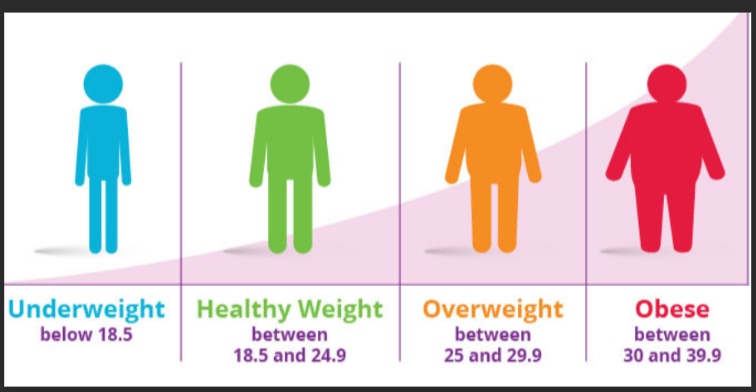

In [1006]:
df['BMI'] = df['Weight']/(df['Height']**2)
df

,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,...,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad,Age_norm,Height_norm,Weight_norm,BMI
0,Male,21.00,1.62,64.00,yes,no,2.00,3.00,Sometimes,no,...,no,0.00,1.00,no,Public_Transportation,Normal_Weight,0.68,0.64,13.38,24.39
1,Male,21.00,1.52,56.00,yes,no,3.00,3.00,Sometimes,yes,...,yes,3.00,0.00,Sometimes,Public_Transportation,Normal_Weight,0.68,0.53,12.41,24.24
2,Male,23.00,1.80,77.00,yes,no,2.00,3.00,Sometimes,no,...,no,2.00,1.00,Frequently,Public_Transportation,Normal_Weight,0.68,0.83,14.82,23.77
3,Male,27.00,1.80,87.00,no,no,3.00,3.00,Sometimes,no,...,no,2.00,0.00,Frequently,Walking,Overweight_Level_I,0.69,0.83,15.85,26.85
4,Male,22.00,1.78,89.80,no,no,2.00,1.00,Sometimes,no,...,no,0.00,0.00,Sometimes,Public_Transportation,Overweight_Level_II,0.68,0.81,16.13,28.34
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2106,Female,20.98,1.71,131.41,yes,yes,3.00,3.00,Sometimes,no,...,no,1.68,0.91,Sometimes,Public_Transportation,Obesity_Type_III,0.68,0.74,19.80,44.90
2107,Female,21.98,1.75,133.74,yes,yes,3.00,3.00,Sometimes,no,...,no,1.34,0.60,Sometimes,Public_Transportation,Obesity_Type_III,0.68,0.78,19.99,43.74
2108,Female,22.52,1.75,133.69,yes,yes,3.00,3.00,Sometimes,no,...,no,1.41,0.65,Sometimes,Public_Transportation,Obesity_Type_III,0.68,0.78,19.99,43.54
2109,Female,24.36,1.74,133.35,yes,yes,3.00,3.00,Sometimes,no,...,no,1.14,0.59,Sometimes,Public_Transportation,Obesity_Type_III,0.69,0.77,19.96,44.07


In [1007]:
val1=df.groupby(['family_history_with_overweight','NObeyesdad'])['BMI'].mean()
val1

family_history_with_overweight  NObeyesdad         
no                              Insufficient_Weight   17.20
                                Normal_Weight         21.78
                                Obesity_Type_I        31.86
                                Obesity_Type_II       35.00
                                Overweight_Level_I    26.09
                                Overweight_Level_II   28.16
yes                             Insufficient_Weight   17.61
                                Normal_Weight         22.20
                                Obesity_Type_I        32.28
                                Obesity_Type_II       36.73
                                Obesity_Type_III      42.27
                                Overweight_Level_I    25.91
                                Overweight_Level_II   28.21
Name: BMI, dtype: float64

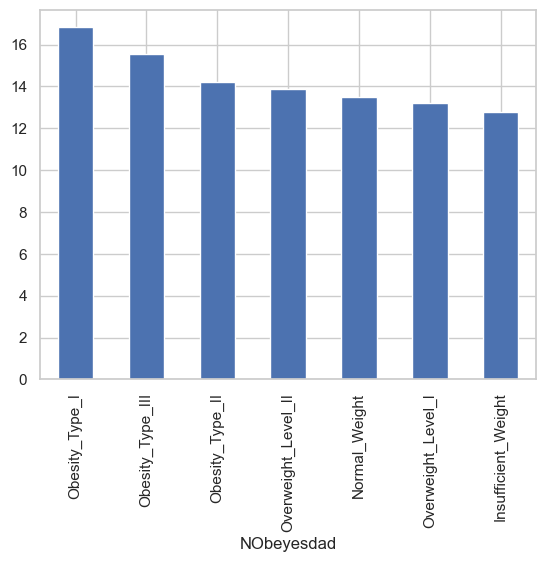

In [1008]:
bar_width=.20
# Plot the bar chart
ax = category_counts.plot.bar()  # You can change the color if desired
bar_width=.20

In [1009]:
df.groupby(['family_history_with_overweight','NObeyesdad'])['NObeyesdad'].count()

family_history_with_overweight  NObeyesdad         
no                              Insufficient_Weight    142
                                Normal_Weight          129
                                Obesity_Type_I           7
                                Obesity_Type_II          1
                                Overweight_Level_I      67
                                Overweight_Level_II     15
yes                             Insufficient_Weight    125
                                Normal_Weight          151
                                Obesity_Type_I         342
                                Obesity_Type_II        296
                                Obesity_Type_III       324
                                Overweight_Level_I     208
                                Overweight_Level_II    263
Name: NObeyesdad, dtype: int64

In [1010]:
df.groupby(['family_history_with_overweight','NObeyesdad'])['BMI'].mean()

family_history_with_overweight  NObeyesdad         
no                              Insufficient_Weight   17.20
                                Normal_Weight         21.78
                                Obesity_Type_I        31.86
                                Obesity_Type_II       35.00
                                Overweight_Level_I    26.09
                                Overweight_Level_II   28.16
yes                             Insufficient_Weight   17.61
                                Normal_Weight         22.20
                                Obesity_Type_I        32.28
                                Obesity_Type_II       36.73
                                Obesity_Type_III      42.27
                                Overweight_Level_I    25.91
                                Overweight_Level_II   28.21
Name: BMI, dtype: float64

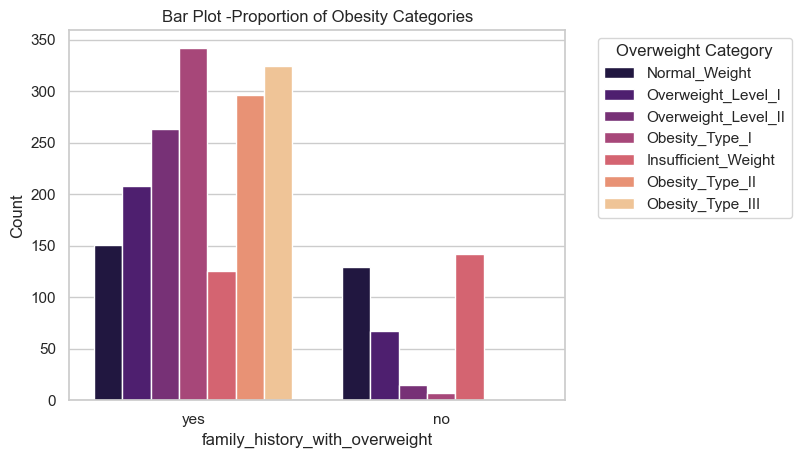

In [1011]:
# Create the countplot
sns.countplot(data=df, x='family_history_with_overweight', hue='NObeyesdad', palette='magma')

# Set the y-label as count
plt.ylabel('Count')
plt.legend(title='Overweight Category',bbox_to_anchor=(1.05, 1),loc='upper left')
plt.title('Bar Plot -Proportion of Obesity Categories')
# Show the plot
plt.show()

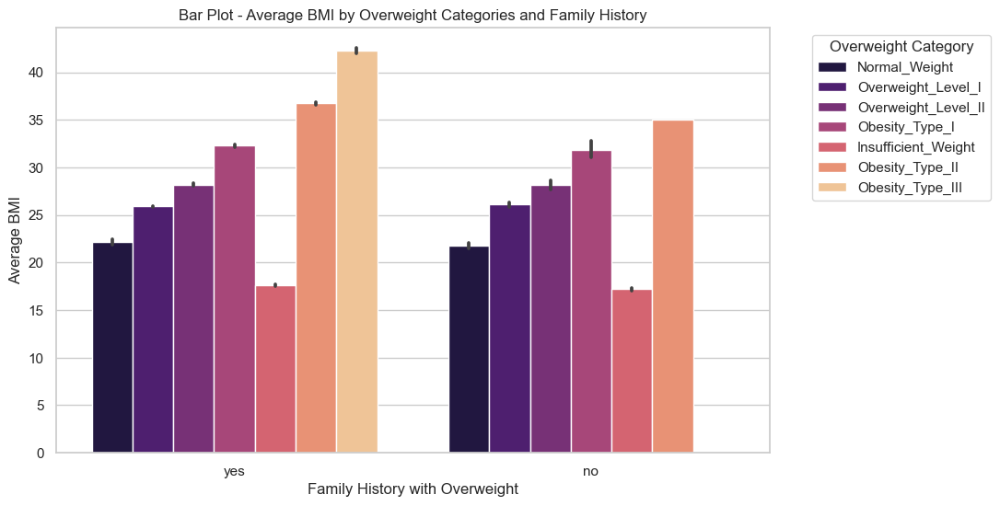

In [1012]:
plt.figure(figsize=(10, 6))
sns.barplot(data=df, x='family_history_with_overweight', y='BMI', hue='NObeyesdad', palette='magma',estimator = 'mean')
plt.title('Bar Plot - Average BMI by Overweight Categories and Family History')
plt.xlabel('Family History with Overweight')
plt.ylabel('Average BMI')
plt.legend(title='Overweight Category',bbox_to_anchor=(1.05, 1),loc='upper left')
plt.show()
for i, val in enumerate(val1):
    ax.text(i, val, f'{val:.2f}%', ha='center', va='bottom', fontsize=8, color='black')

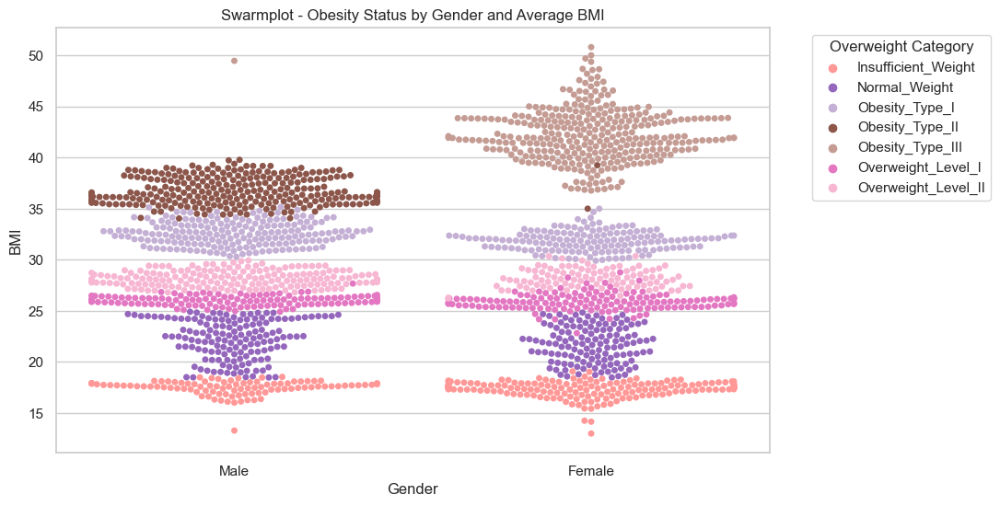

In [1013]:
average_bmi_by_group = df.groupby(['Gender', 'NObeyesdad'])['BMI'].mean().reset_index()
plt.figure(figsize=(10,6))
sns.swarmplot(df,x='Gender',y='BMI',hue='NObeyesdad', palette='tab20',hue_order=average_bmi_by_group['NObeyesdad'])
plt.title('Swarmplot - Obesity Status by Gender and Average BMI')
plt.legend(title='Overweight Category',bbox_to_anchor=(1.05, 1),loc='upper left')
plt.show()

In [1014]:
df.Gender.value_counts()

Gender
Male      1049
Female    1021
Name: count, dtype: int64

In [1015]:
val2 = df.groupby(['Gender', 'NObeyesdad'])['BMI'].agg(['mean', 'count']).reset_index()
val2

,Gender,NObeyesdad,mean,count
0,Female,Insufficient_Weight,17.33,169
1,Female,Normal_Weight,21.71,131
2,Female,Obesity_Type_I,31.87,153
3,Female,Obesity_Type_II,37.13,2
4,Female,Obesity_Type_III,42.25,323
5,Female,Overweight_Level_I,25.90,145
6,Female,Overweight_Level_II,28.22,98
7,Male,Insufficient_Weight,17.50,98
8,Male,Normal_Weight,22.27,149
9,Male,Obesity_Type_I,32.58,196


In [1016]:
average_bmi_by_group_count = df.groupby(['Gender', 'NObeyesdad'])['BMI'].count().reset_index()
average_bmi_by_group_count

,Gender,NObeyesdad,BMI
0,Female,Insufficient_Weight,169
1,Female,Normal_Weight,131
2,Female,Obesity_Type_I,153
3,Female,Obesity_Type_II,2
4,Female,Obesity_Type_III,323
5,Female,Overweight_Level_I,145
6,Female,Overweight_Level_II,98
7,Male,Insufficient_Weight,98
8,Male,Normal_Weight,149
9,Male,Obesity_Type_I,196


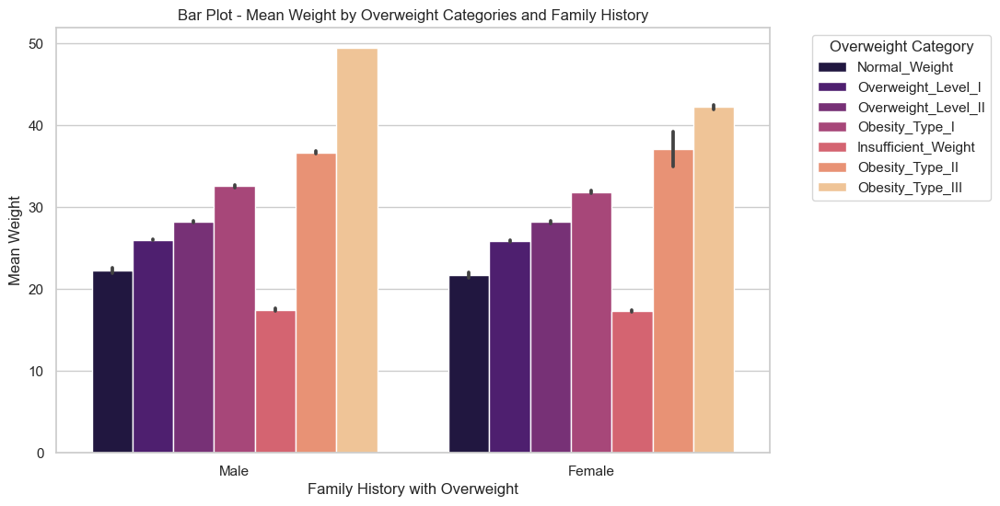

In [1017]:
plt.figure(figsize=(10, 6))
sns.barplot(data=df, x='Gender', y='BMI', hue='NObeyesdad', palette='magma')
plt.title('Bar Plot - Mean Weight by Overweight Categories and Family History')
plt.xlabel('Family History with Overweight')
plt.ylabel('Mean Weight')
plt.legend(title='Overweight Category',bbox_to_anchor=(1.05, 1),loc='upper left')
plt.show()

In [1018]:
app_in= pd.pivot_table(df,index='family_history_with_overweight', columns='FAVC', values='BMI')
app_in 

FAVC,no,yes
family_history_with_overweight,,
no,20.88,21.42
yes,26.61,32.03


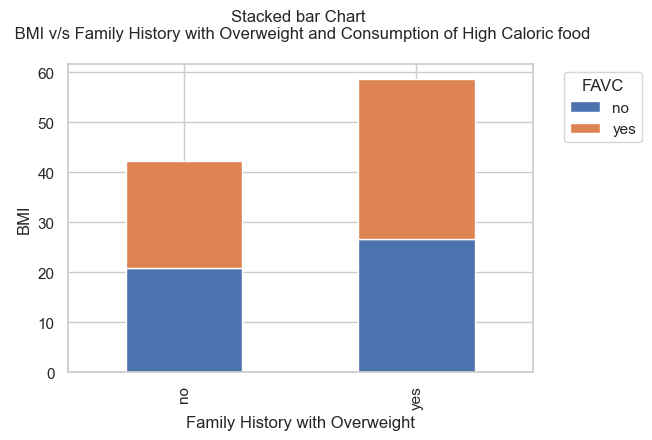

In [1019]:
sns.set(style="whitegrid")
app_in.plot(kind='bar', stacked=True, figsize=(6, 4))
bar_width=.05
plt.xlabel('Family History with Overweight')
plt.ylabel('BMI')
plt.legend(title='FAVC',bbox_to_anchor=(1.05, 1), loc='upper left')
plt.title('Stacked bar Chart \n BMI v/s Family History with Overweight and Consumption of High Caloric food\n ')
plt.show()

In [1020]:
# Create dataframe for BMI categories, df_weight_1 for BMI<18.5, and so on
df_weight_1 = df[df['BMI']<18.5]
# Get the obesity levels for BMI<18.5
df_weight_1['NObeyesdad'].unique()

array(['Insufficient_Weight', 'Normal_Weight'], dtype=object)

It seems that with BMI<18.5, for obesity levels we get Insufficient Weight (align with BMI criteria) and normal weight (almost align with BMI criteria) so, we will compare both.

In [1021]:
# For normal weight
df_weight_2 = df[(df['BMI'] >= 18.5) & (df['BMI'] < 25)]

# For overweight
df_weight_3 = df[(df['BMI'] >= 25) & (df['BMI'] < 29.9)]

# For obesity
df_weight_4 = df[df['BMI'] >= 30]

In [1022]:
import plotly.graph_objects as go
# Create label 
A = ['insufficient', 'normal', 'overweight', 'obesity']

for i in range(2, 5):
    # Create categories
    a_i = globals()[f"df_weight_{i}"]['NObeyesdad'].value_counts()

    # Create bar chart to compare categories
    fig = go.Figure(data=[go.Bar(x=a_i.index, y=a_i)])

    fig.update_layout(
        title='Categories for ' + A[i-1] + ' Weight (BMI)',
        xaxis=dict(title='Weight Categories'),
        yaxis=dict(title='Count'),
        plot_bgcolor='black',
        paper_bgcolor='black',
        font=dict(color='white')
    )

    fig.show()

## One hot encoding 

In [1023]:
col = df[['Gender','family_history_with_overweight','FAVC','CAEC','SMOKE','SCC','CALC','MTRANS']]

In [1024]:
col_onehot=pd.get_dummies(col,drop_first=True).astype(int)

In [1025]:
col_onehot # 15 new columns got generated

,Gender_Male,family_history_with_overweight_yes,FAVC_yes,CAEC_Frequently,CAEC_Sometimes,CAEC_no,SMOKE_yes,SCC_yes,CALC_Frequently,CALC_Sometimes,CALC_no,MTRANS_Bike,MTRANS_Motorbike,MTRANS_Public_Transportation,MTRANS_Walking
0,1,1,0,0,1,0,0,0,0,0,1,0,0,1,0
1,1,1,0,0,1,0,1,1,0,1,0,0,0,1,0
2,1,1,0,0,1,0,0,0,1,0,0,0,0,1,0
3,1,0,0,0,1,0,0,0,1,0,0,0,0,0,1
4,1,0,0,0,1,0,0,0,0,1,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2106,0,1,1,0,1,0,0,0,0,1,0,0,0,1,0
2107,0,1,1,0,1,0,0,0,0,1,0,0,0,1,0
2108,0,1,1,0,1,0,0,0,0,1,0,0,0,1,0
2109,0,1,1,0,1,0,0,0,0,1,0,0,0,1,0


In [1026]:
df=pd.concat([df,col_onehot],axis=1)
df.head()# total 36 columns after One-Hot Encoding

,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,...,CAEC_no,SMOKE_yes,SCC_yes,CALC_Frequently,CALC_Sometimes,CALC_no,MTRANS_Bike,MTRANS_Motorbike,MTRANS_Public_Transportation,MTRANS_Walking
0,Male,21.00,1.62,64.00,yes,no,2.00,3.00,Sometimes,no,...,0,0,0,0,0,1,0,0,1,0
1,Male,21.00,1.52,56.00,yes,no,3.00,3.00,Sometimes,yes,...,0,1,1,0,1,0,0,0,1,0
2,Male,23.00,1.80,77.00,yes,no,2.00,3.00,Sometimes,no,...,0,0,0,1,0,0,0,0,1,0
3,Male,27.00,1.80,87.00,no,no,3.00,3.00,Sometimes,no,...,0,0,0,1,0,0,0,0,0,1
4,Male,22.00,1.78,89.80,no,no,2.00,1.00,Sometimes,no,...,0,0,0,0,1,0,0,0,1,0


In [1027]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2070 entries, 0 to 2110
Data columns (total 36 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   Gender                              2070 non-null   object 
 1   Age                                 2070 non-null   float64
 2   Height                              2070 non-null   float64
 3   Weight                              2070 non-null   float64
 4   family_history_with_overweight      2070 non-null   object 
 5   FAVC                                2070 non-null   object 
 6   FCVC                                2070 non-null   float64
 7   NCP                                 2070 non-null   float64
 8   CAEC                                2070 non-null   object 
 9   SMOKE                               2070 non-null   object 
 10  CH2O                                2070 non-null   float64
 11  SCC                                 2070 non-nul

In [1028]:
df.drop(['Gender','family_history_with_overweight','FAVC','CAEC','SMOKE','SCC','CALC','MTRANS'],axis=1,inplace=True)

In [1029]:
df.head()# 28 columns left, after deleting all Hot encoded columns

,Age,Height,Weight,FCVC,NCP,CH2O,FAF,TUE,NObeyesdad,Age_norm,...,CAEC_no,SMOKE_yes,SCC_yes,CALC_Frequently,CALC_Sometimes,CALC_no,MTRANS_Bike,MTRANS_Motorbike,MTRANS_Public_Transportation,MTRANS_Walking
0,21.00,1.62,64.00,2.00,3.00,2.00,0.00,1.00,Normal_Weight,0.68,...,0,0,0,0,0,1,0,0,1,0
1,21.00,1.52,56.00,3.00,3.00,3.00,3.00,0.00,Normal_Weight,0.68,...,0,1,1,0,1,0,0,0,1,0
2,23.00,1.80,77.00,2.00,3.00,2.00,2.00,1.00,Normal_Weight,0.68,...,0,0,0,1,0,0,0,0,1,0
3,27.00,1.80,87.00,3.00,3.00,2.00,2.00,0.00,Overweight_Level_I,0.69,...,0,0,0,1,0,0,0,0,0,1
4,22.00,1.78,89.80,2.00,1.00,2.00,0.00,0.00,Overweight_Level_II,0.68,...,0,0,0,0,1,0,0,0,1,0


In [1030]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2070 entries, 0 to 2110
Data columns (total 28 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   Age                                 2070 non-null   float64
 1   Height                              2070 non-null   float64
 2   Weight                              2070 non-null   float64
 3   FCVC                                2070 non-null   float64
 4   NCP                                 2070 non-null   float64
 5   CH2O                                2070 non-null   float64
 6   FAF                                 2070 non-null   float64
 7   TUE                                 2070 non-null   float64
 8   NObeyesdad                          2070 non-null   object 
 9   Age_norm                            2070 non-null   float64
 10  Height_norm                         2070 non-null   float64
 11  Weight_norm                         2070 non-nul

In [1031]:
def variable_counts(columns, stage):

    if stage == 'pre':
        print("Pre Conversion to Integer")
    else:
        print("Post Conversion to Integer")

    for col in columns:    
        print("Variable:", col, "| Count Unique:",df[col].nunique(),"| Min: ", df[col].min(), "| Max: ",df[col].max())

In [1032]:
# Convert float variables to integer to the nearest inter
columns = ["FCVC", "NCP", "CH2O", "TUE", "FAF"]

# pre conversion countss
variable_counts(columns, 'pre')

# convert to int / nearest int value
for col in columns:
    #round to nearest whole number
    df[col] = round(df[col]).astype('int')  
    
# post conversion counts
print("")
variable_counts(columns, 'post')

Pre Conversion to Integer
Variable: FCVC | Count Unique: 805 | Min:  1.0 | Max:  3.0
Variable: NCP | Count Unique: 634 | Min:  1.0 | Max:  4.0
Variable: CH2O | Count Unique: 1263 | Min:  1.0 | Max:  3.0
Variable: TUE | Count Unique: 1129 | Min:  0.0 | Max:  2.0
Variable: FAF | Count Unique: 1186 | Min:  0.0 | Max:  3.0

Post Conversion to Integer
Variable: FCVC | Count Unique: 3 | Min:  1 | Max:  3
Variable: NCP | Count Unique: 4 | Min:  1 | Max:  4
Variable: CH2O | Count Unique: 3 | Min:  1 | Max:  3
Variable: TUE | Count Unique: 3 | Min:  0 | Max:  2
Variable: FAF | Count Unique: 4 | Min:  0 | Max:  3


In [1033]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2070 entries, 0 to 2110
Data columns (total 28 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   Age                                 2070 non-null   float64
 1   Height                              2070 non-null   float64
 2   Weight                              2070 non-null   float64
 3   FCVC                                2070 non-null   int32  
 4   NCP                                 2070 non-null   int32  
 5   CH2O                                2070 non-null   int32  
 6   FAF                                 2070 non-null   int32  
 7   TUE                                 2070 non-null   int32  
 8   NObeyesdad                          2070 non-null   object 
 9   Age_norm                            2070 non-null   float64
 10  Height_norm                         2070 non-null   float64
 11  Weight_norm                         2070 non-nul

In [1034]:
df.shape

(2070, 28)

In [1035]:
corr_check = df.drop(columns=['NObeyesdad']).corr()
corr_check

,Age,Height,Weight,FCVC,NCP,CH2O,FAF,TUE,Age_norm,Height_norm,...,CAEC_no,SMOKE_yes,SCC_yes,CALC_Frequently,CALC_Sometimes,CALC_no,MTRANS_Bike,MTRANS_Motorbike,MTRANS_Public_Transportation,MTRANS_Walking
Age,1.00,-0.03,0.23,0.00,-0.07,-0.02,-0.14,-0.28,0.95,-0.03,...,-0.05,0.06,-0.14,0.05,0.04,-0.06,0.01,0.02,-0.56,-0.08
Height,-0.03,1.00,0.46,-0.06,0.23,0.19,0.29,0.05,-0.01,1.00,...,-0.07,0.06,-0.14,0.04,0.11,-0.13,0.03,-0.01,-0.08,0.03
Weight,0.23,0.46,1.00,0.18,0.09,0.19,-0.05,-0.05,0.31,0.46,...,-0.09,0.03,-0.20,-0.04,0.27,-0.26,-0.02,-0.04,0.06,-0.10
FCVC,0.00,-0.06,0.18,1.00,0.00,0.07,0.02,-0.08,0.03,-0.06,...,-0.08,0.00,0.07,-0.02,0.06,-0.06,-0.03,-0.01,0.07,0.01
NCP,-0.07,0.23,0.09,0.00,1.00,0.08,0.13,-0.00,-0.06,0.23,...,-0.06,0.01,-0.02,-0.03,0.12,-0.11,0.02,0.00,-0.05,0.00
CH2O,-0.02,0.19,0.19,0.07,0.08,1.00,0.11,-0.03,0.02,0.19,...,0.09,-0.04,-0.01,0.04,0.07,-0.08,0.02,-0.00,0.03,0.01
FAF,-0.14,0.29,-0.05,0.02,0.13,0.11,1.00,0.05,-0.18,0.29,...,0.03,0.01,0.06,0.05,-0.14,0.12,0.06,-0.02,-0.06,0.10
TUE,-0.28,0.05,-0.05,-0.08,-0.00,-0.03,0.05,1.00,-0.29,0.05,...,-0.09,0.02,-0.01,0.06,-0.09,0.07,-0.02,-0.06,0.13,0.07
Age_norm,0.95,-0.01,0.31,0.03,-0.06,0.02,-0.18,-0.29,1.00,-0.01,...,-0.03,0.07,-0.17,0.04,0.09,-0.10,-0.00,0.02,-0.45,-0.10
Height_norm,-0.03,1.00,0.46,-0.06,0.23,0.19,0.29,0.05,-0.01,1.00,...,-0.07,0.06,-0.14,0.04,0.12,-0.13,0.03,-0.01,-0.08,0.04


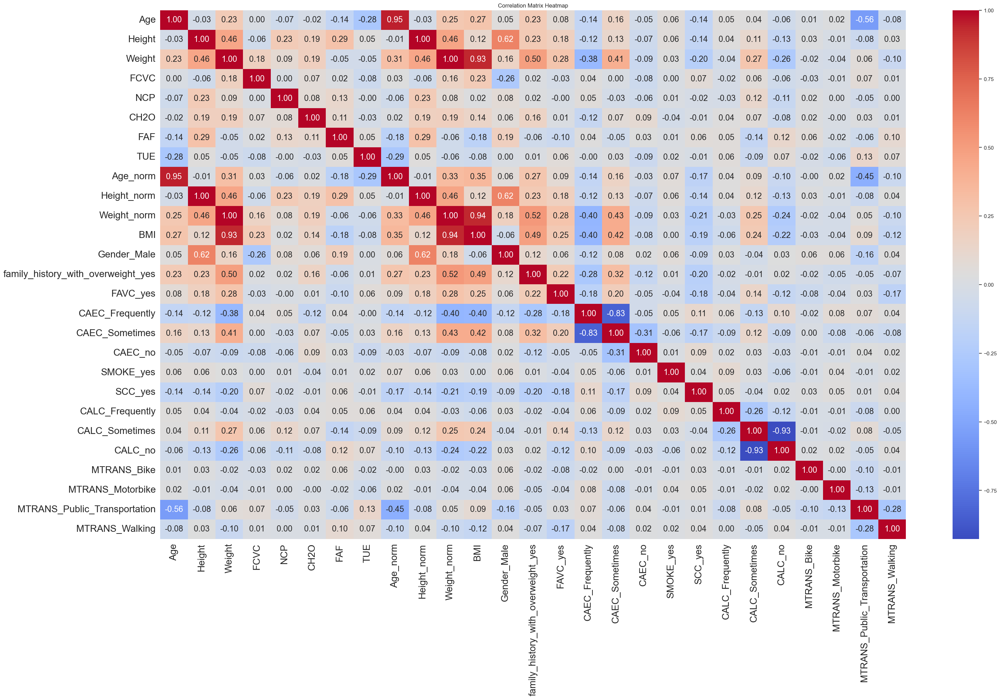

In [1036]:
# Assuming your correlation matrix is named correlation_matrix
# Plot heatmap

fig, ax1 = plt.subplots(figsize=(35,20))
sns.heatmap(corr_check, annot=True, cmap='coolwarm', fmt=".2f",annot_kws={'size':17})
plt.title('Correlation Matrix Heatmap', fontsize=16)

plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

plt.title('Correlation Matrix Heatmap')
plt.show()

In [1037]:
df.drop(['Age','Height','Weight'],axis=1,inplace=True)

## Correlation Matrix 

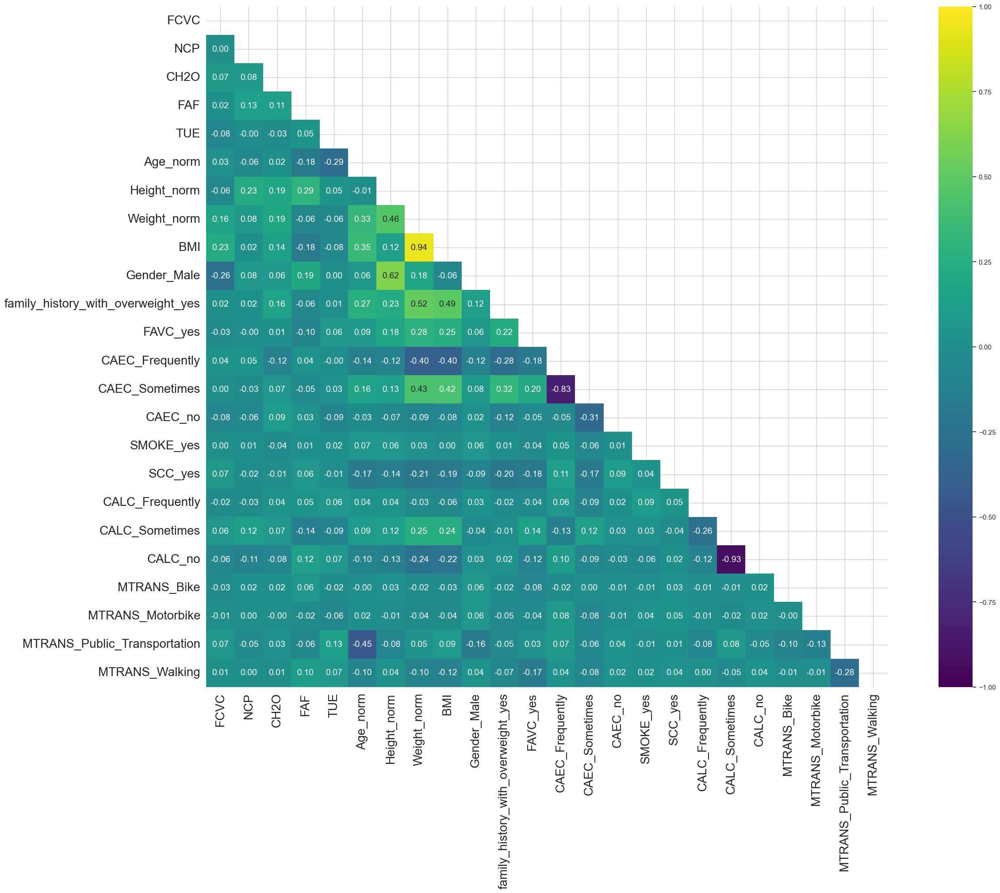

In [1038]:
corr_df = df.drop(columns=['NObeyesdad']).corr()
matrix = np.triu(corr_df)
fig, ax1 = plt.subplots(figsize=(30,20))
sns.heatmap(corr_df, 
            mask=matrix,
            annot=True,  # Set annot to True to display annotations
            fmt='.2f',   # Format annotations to display two decimal places
            cmap="viridis", 
            vmin=-1, vmax=1, center=0,                 
            square=True,
            annot_kws={'size':14},
            ax=ax1)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.show()

In [1039]:
df.drop(['Weight_norm','CAEC_Sometimes','CALC_no'],axis=1,inplace=True)

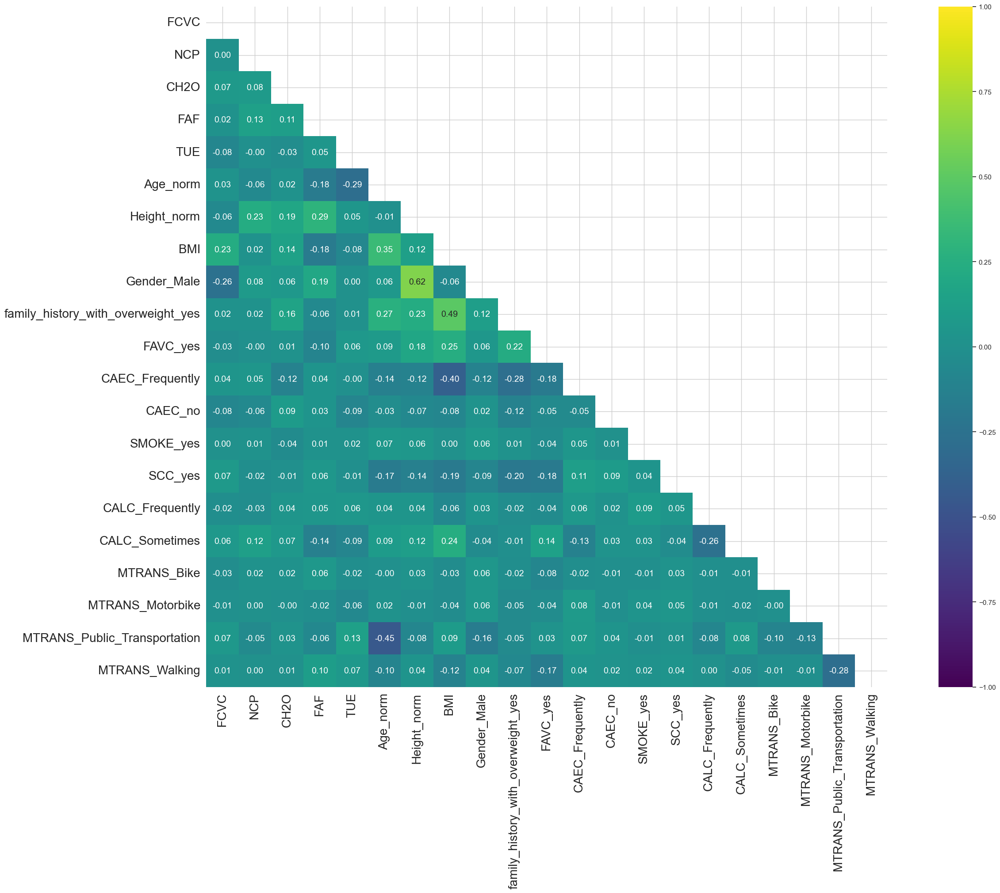

In [1040]:
corr_df = df.drop(columns=['NObeyesdad']).corr()
matrix = np.triu(corr_df)
fig, ax1 = plt.subplots(figsize=(30,20))
sns.heatmap(corr_df, 
            mask=matrix,
            annot=True,  # Set annot to True to display annotations
            fmt='.2f',   # Format annotations to display two decimal places
            cmap="viridis", 
            vmin=-1, vmax=1, center=0,                 
            square=True,
            annot_kws={'size':14},
            ax=ax1)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.show()

In [1041]:
df.shape

(2070, 22)

In [1042]:
df.drop(['Height_norm'],axis=1,inplace=True)

In [1043]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2070 entries, 0 to 2110
Data columns (total 21 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   FCVC                                2070 non-null   int32  
 1   NCP                                 2070 non-null   int32  
 2   CH2O                                2070 non-null   int32  
 3   FAF                                 2070 non-null   int32  
 4   TUE                                 2070 non-null   int32  
 5   NObeyesdad                          2070 non-null   object 
 6   Age_norm                            2070 non-null   float64
 7   BMI                                 2070 non-null   float64
 8   Gender_Male                         2070 non-null   int32  
 9   family_history_with_overweight_yes  2070 non-null   int32  
 10  FAVC_yes                            2070 non-null   int32  
 11  CAEC_Frequently                     2070 non-nul

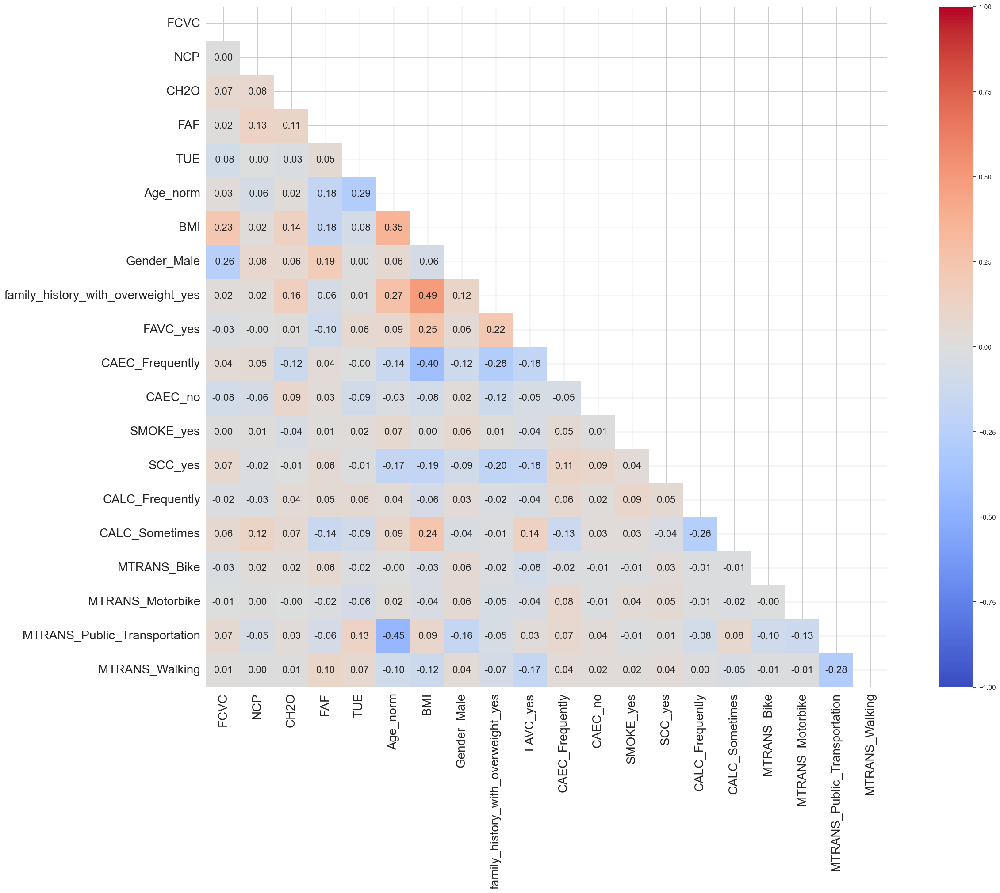

In [1044]:
corr_df = df.drop(columns=['NObeyesdad']).corr()
matrix = np.triu(corr_df)
fig, ax1 = plt.subplots(figsize=(30,20))
sns.heatmap(corr_df, 
            mask=matrix,
            annot=True,  # Set annot to True to display annotations
            fmt='.2f',   # Format annotations to display two decimal places
            cmap="coolwarm", 
            vmin=-1, vmax=1, center=0,                 
            square=True,
            annot_kws={'size':16},
            ax=ax1)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.show()

In [1045]:
df.shape

(2070, 21)

In [1046]:
df.to_csv('df_final.csv')

## Model Building

### 90-10 Split (21 columns)

Target Varible- NObeyesdad / category_mapping  

In [750]:
# import sklearn packages for data treatments
from sklearn.model_selection import train_test_split # Import train_test_split function

In [751]:
value_mapping= {'Insufficient_Weight': 0, 'Normal_Weight': 1, 'Overweight_Level_I': 2,'Overweight_Level_II':3,'Obesity_Type_I':4,'Obesity_Type_II':5,'Obesity_Type_III':6}

In [752]:
df['category_mapping']=df['NObeyesdad'].map(value_mapping)

In [753]:
X = df.drop(columns=["NObeyesdad",'category_mapping'])

# Target variable
y = df['category_mapping'] 

In [754]:
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y,test_size=0.1, random_state=1) 

In [755]:
X_train.shape,y_train.shape,X_test.shape,y_test.shape

((1863, 20), (1863,), (207, 20), (207,))

### Accuracy Score Comparision

In [756]:
# standard scale data
ss = StandardScaler()
X_train_scaled = ss.fit_transform(X_train)
X_test_scaled = ss.transform(X_test)

# tested MinMaxScaler as KNN historically does better with MinMax
mm = MinMaxScaler()
X_train_mm_scaled = ss.fit_transform(X_train)
X_test_mm_scaled = ss.transform(X_test)

models = [    

    ('GaussianNB',GaussianNB()), 
    ('SVC',SVC(class_weight='balanced', probability=True, random_state=2020)),
    ('DecisionTreeClassifier',DecisionTreeClassifier(class_weight='balanced', random_state=2020)),
    ('RandomForestClassifier',RandomForestClassifier(class_weight='balanced', random_state=2020)),
    ('XGBClassifier',XGBClassifier(class_weight='balanced', random_state=2020)),
    ('AdaBoostClassifier',AdaBoostClassifier(random_state=2020)),
]

results = []

for name, model in models:        
    # unscaled data
    clf = model.fit(X_train, y_train)
    y_pred = clf.predict(X_test)

    # scaled data
    clf_scaled = model.fit(X_train_scaled, y_train)
    y_pred_scaled = clf_scaled.predict(X_test_scaled)

    # mm scaled data
    clf_mm_scaled = model.fit(X_train_mm_scaled, y_train)
    y_pred_mm_scaled = clf_mm_scaled.predict(X_test_mm_scaled)

    # accuracy scores
    accuracy = round(accuracy_score(y_test, y_pred), 5)
    scaled_accuracy = round(accuracy_score(y_test, y_pred_scaled), 5)
    scaled_mm_accuracy = round(accuracy_score(y_test, y_pred_mm_scaled), 5)

    
    # output
    print("---------------------------------------------------------------") 
    print(name + ':')             
    print("Accuracy:", accuracy)
    print("Accuracy w/Scaled Data (ss):", scaled_accuracy)
    print("Accuracy w/Scaled Data (mm):", scaled_mm_accuracy)
    # classification report
    if accuracy >= scaled_accuracy and accuracy >= scaled_mm_accuracy:
        print("\nClassification Report:\n", metrics.classification_report(y_test, y_pred))   
        print("                            -----------------------------------               \n")    
    elif scaled_accuracy >= scaled_mm_accuracy:
        print("\nClassification Report:\n", metrics.classification_report(y_test, y_pred_scaled))      
        print("                            -----------------------------------               \n") 
    else:
        print("\nClassification Report:\n", metrics.classification_report(y_test, y_pred_mm_scaled))      
        print("                            -----------------------------------               \n") 
    
    # Get the highest accuracy among the three
    max_accuracy = max(accuracy, scaled_accuracy, scaled_mm_accuracy)

    # Get the corresponding prediction
    if max_accuracy == accuracy:
        y_pred_max_accuracy = y_pred
    elif max_accuracy == scaled_accuracy:
        y_pred_max_accuracy = y_pred_scaled
    else:
        y_pred_max_accuracy = y_pred_mm_scaled

    # Get the classification report
    report = classification_report(y_test, y_pred_max_accuracy, output_dict=True)
 

    # Print F1-score, recall, precision
    # Store results
    results.append({
        'Model': name,
        'Accuracy': max_accuracy,
        'Weighted Avg F1-score': report['weighted avg']['f1-score'],
        'Weighted Avg Recall': report['weighted avg']['recall'],
        'Weighted Avg Precision': report['weighted avg']['precision']
    })

# Create DataFrame
results_df = pd.DataFrame(results)

# Print DataFrame
results_df=results_df.set_index('Model')
results_df

---------------------------------------------------------------
GaussianNB:
Accuracy: 0.76812
Accuracy w/Scaled Data (ss): 0.7343
Accuracy w/Scaled Data (mm): 0.7343

Classification Report:
               precision    recall  f1-score   support

           0       0.69      1.00      0.82        27
           1       0.81      0.46      0.59        28
           2       0.62      0.19      0.29        27
           3       0.52      0.86      0.65        28
           4       0.97      0.83      0.89        35
           5       0.83      1.00      0.91        30
           6       0.97      0.97      0.97        32

    accuracy                           0.77       207
   macro avg       0.77      0.76      0.73       207
weighted avg       0.79      0.77      0.74       207

                            -----------------------------------               

---------------------------------------------------------------
SVC:
Accuracy: 0.93237
Accuracy w/Scaled Data (ss): 0.91304
Accuracy

,Accuracy,Weighted Avg F1-score,Weighted Avg Recall,Weighted Avg Precision
Model,,,,
GaussianNB,0.77,0.74,0.77,0.79
SVC,0.93,0.93,0.93,0.94
DecisionTreeClassifier,0.98,0.98,0.98,0.98
RandomForestClassifier,0.98,0.98,0.98,0.98
XGBClassifier,0.99,0.99,0.99,0.99
AdaBoostClassifier,0.43,0.27,0.43,0.20


### Overfitted or Underfitted Analysis

In [757]:
from sklearn.metrics import f1_score

# List of models
models = [

    ('GaussianNB', GaussianNB()), 
    ('SVC', SVC(class_weight='balanced', probability=True, random_state=2020)),
    ('DecisionTreeClassifier', DecisionTreeClassifier(class_weight='balanced', random_state=2020)),
    ('RandomForestClassifier', RandomForestClassifier(class_weight='balanced', random_state=2020)),
    ('XGBClassifier', XGBClassifier(class_weight='balanced', random_state=2020)),
    ('AdaBoostClassifier', AdaBoostClassifier(random_state=2020)),
]

# Dictionary to store F1 scores
f1_scores = {}
train_f1_scores = []
test_f1_scores = []

# Calculate F1 scores for each model
for model_name, model in models:
    # Train the model
    model.fit(X_train, y_train)
    
    # Predictions on training and testing sets
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    
    # Calculate F1 scores
    train_f1_score = round(f1_score(y_train, y_pred_train,average='macro'), 2)
    test_f1_score = round(f1_score(y_test, y_pred_test,average='macro'), 2)
    
    train_f1_scores.append(train_f1_score)
    test_f1_scores.append(test_f1_score)
    
    # Store F1 scores in dictionary
    f1_scores[model_name] = {'Train F1 Score': train_f1_score, 'Test F1 Score': test_f1_score}
    
    # Print F1 scores
    for model_name, scores in f1_scores.items():
        (f"{model_name}: Train F1 Score = {scores['Train F1 Score']}, Test F1 Score = {scores['Test F1 Score']}")
    
f1_scores= pd.DataFrame(f1_scores)
f1_scores.T

,Train F1 Score,Test F1 Score
GaussianNB,0.75,0.73
SVC,0.92,0.93
DecisionTreeClassifier,1.00,0.98
RandomForestClassifier,1.00,0.97
XGBClassifier,1.00,0.99
AdaBoostClassifier,0.26,0.27


In [ ]:
# Based on Accuracy Score 

# List of models
models = [

    ('GaussianNB', GaussianNB()), 
    ('SVC', SVC(class_weight='balanced', probability=True, random_state=2020)),
    ('DecisionTreeClassifier', DecisionTreeClassifier(class_weight='balanced', random_state=2020)),
    ('RandomForestClassifier', RandomForestClassifier(class_weight='balanced', random_state=2020)),
    ('XGBClassifier', XGBClassifier(class_weight='balanced', random_state=2020)),
    ('AdaBoostClassifier', AdaBoostClassifier(random_state=2020)),
]

# Dictionary to store F1 scores
accuracy_scores = {}
train_accuracy_scores = []
test_accuracy_scores = []

# Calculate F1 scores for each model
for model_name, model in models:
    # Train the model
    model.fit(X_train, y_train)
    
    # Predictions on training and testing sets
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    
    # Calculate F1 scores
    train_accuracy_score = round(accuracy_score(y_train, y_pred_train), 2)
    test_accuracy_score = round(accuracy_score(y_test, y_pred_test), 2)
    
    train_accuracy_scores.append(train_accuracy_score)
    test_accuracy_scores.append(test_accuracy_score)
    
    # Store F1 scores in dictionary
    accuracy_scores[model_name] = {'Train accuracy Score': train_accuracy_score, 'Test accuracy Score': test_accuracy_score}
    
    # Print F1 scores
    for model_name, scores in accuracy_scores.items():
        (f"{model_name}: Train Accuracy Score = {scores['Train accuracy Score']}, Test accuracy Score = {scores['Test accuracy Score']}")
    
accuracy_scores= pd.DataFrame(accuracy_scores)
accuracy_scores.T

### Confusion Matrix Comparision

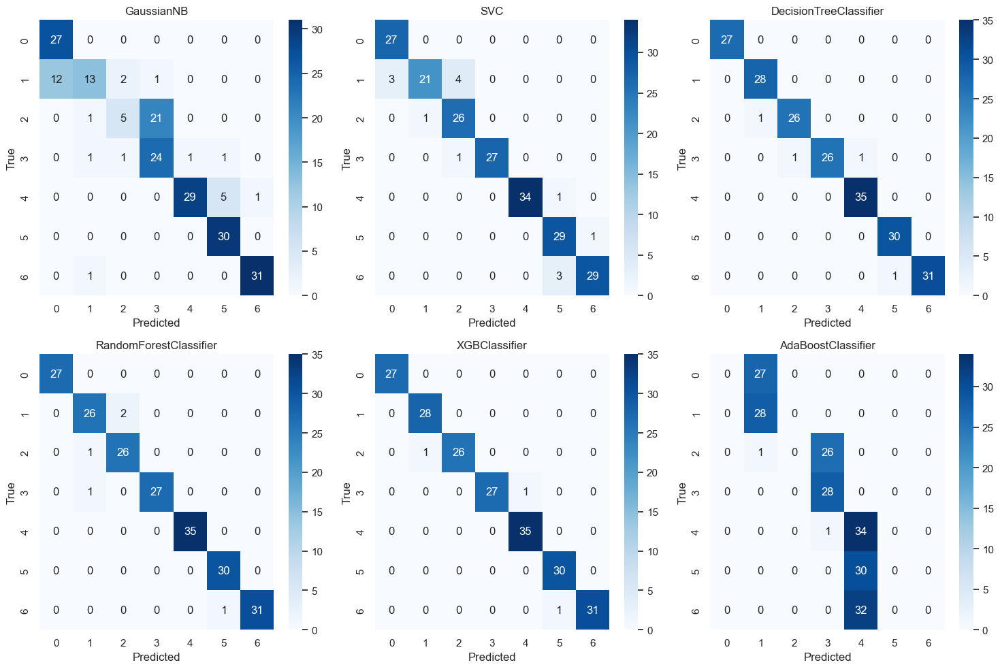

In [758]:
models = [    
    ('GaussianNB', GaussianNB()), 
    ('SVC', SVC(class_weight='balanced', probability=True, random_state=2020)),
    ('DecisionTreeClassifier', DecisionTreeClassifier(class_weight='balanced', random_state=2020)),
    ('RandomForestClassifier', RandomForestClassifier(class_weight='balanced', random_state=2020)),
    ('XGBClassifier', XGBClassifier(class_weight='balanced', random_state=2020)),
    ('AdaBoostClassifier', AdaBoostClassifier(random_state=2020)),
]

# Create a figure and axis for subplots
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 10))

for (name, model), ax in zip(models, axes.flatten()):
    # Fit the model
    clf = model.fit(X_train, y_train)
    y_pred = clf.predict(X_test)

    # Generate confusion matrix
    cm = confusion_matrix(y_test, y_pred)

    # Plot confusion matrix
    sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', ax=ax)
    ax.set_title(name)
    ax.set_xlabel('Predicted')
    ax.set_ylabel('True')

plt.tight_layout()
plt.show()

### ROC- AUC Curve Analysis by Different Classifier

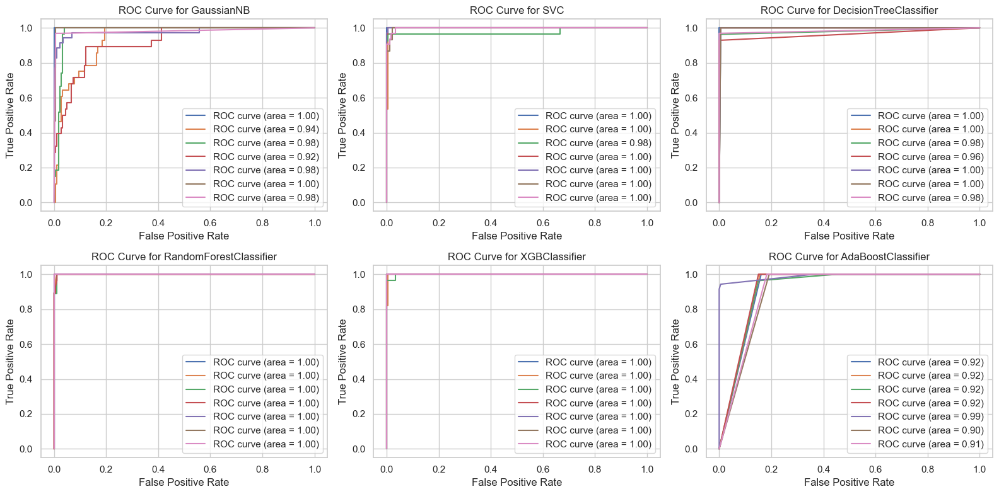

In [759]:
# Define a list of classifiers
classifiers = [
 
    GaussianNB(), 
    SVC(class_weight='balanced', probability=True, random_state=2020),
    DecisionTreeClassifier(class_weight='balanced', random_state=2020),
    RandomForestClassifier(class_weight='balanced', random_state=2020),
    XGBClassifier(class_weight='balanced', random_state=2020),
    AdaBoostClassifier(random_state=2020)
]

# Set up the subplots
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(16, 8))
axes = axes.flatten()

# Train the models and plot ROC curve for each classifier
for i, cls in enumerate(classifiers):
    model = cls.fit(X_train, y_train)
    y_pred_proba = model.predict_proba(X_test)
    
    # Binarize the labels
    y_test_binarized = label_binarize(y_test, classes=np.unique(y_test))
    
    # Compute ROC curve and ROC area for each class
    n_classes = len(np.unique(y_test))
    for j in range(n_classes):
        fpr, tpr, _ = roc_curve(y_test_binarized[:, j], y_pred_proba[:, j])
        roc_auc = auc(fpr, tpr)
        
        # Plot ROC curve
        axes[i].plot(fpr, tpr, label='ROC curve (area = {:.2f})'.format(roc_auc))
        axes[i].set_xlabel('False Positive Rate')
        axes[i].set_ylabel('True Positive Rate')
        axes[i].set_title('ROC Curve for {}'.format(cls.__class__.__name__))
        axes[i].legend(loc='lower right')

# Adjust layout
plt.tight_layout()
plt.show()

## K Fold CrossValidation

In [760]:
# Define a list of classifiers
classifiers = [
 
    GaussianNB(), 
    SVC(class_weight='balanced', probability=True, random_state=2020),
    DecisionTreeClassifier(class_weight='balanced', random_state=2020),
    RandomForestClassifier(class_weight='balanced', random_state=2020),
    XGBClassifier(class_weight='balanced', random_state=2020),
    AdaBoostClassifier(random_state=2020)
]

results_table = {'Mean Accuracy': [], 'CrossVal1(f1)': [], 'CrossVal2(f1)': [], 'CrossVal3(f1)': [], 'CrossVal4(f1)': [], 'CrossVal5(f1)': []}

# Iterate over all classifiers
for clf_name, clf in models:
    # Perform cross-validation
    scores = cross_val_score(clf, X_train, y_train, cv=5)
    
    # Append mean accuracy to results_table
    results_table['Mean Accuracy'].append(scores.mean())
    
    # Append individual cross-validation scores to results_table
    for i, score in enumerate(scores, 1):
        results_table[f'CrossVal{i}(f1)'].append(score)

# Create a DataFrame
results_df_cvs = pd.DataFrame(results_table, index=[clf_name for clf_name, _ in models])

# Print the DataFrame
results_df_cvs

,Mean Accuracy,CrossVal1(f1),CrossVal2(f1),CrossVal3(f1),CrossVal4(f1),CrossVal5(f1)
GaussianNB,0.72,0.73,0.76,0.69,0.67,0.77
SVC,0.91,0.91,0.90,0.91,0.94,0.91
DecisionTreeClassifier,0.96,0.95,0.97,0.97,0.98,0.95
RandomForestClassifier,0.98,0.98,0.98,0.99,0.97,0.98
XGBClassifier,0.98,0.97,0.97,0.98,0.98,0.98
AdaBoostClassifier,0.48,0.43,0.54,0.56,0.44,0.43


Text(0.5, 1.0, 'Grouped Bar plot of Models Build\n (Cross Val Score)\n')

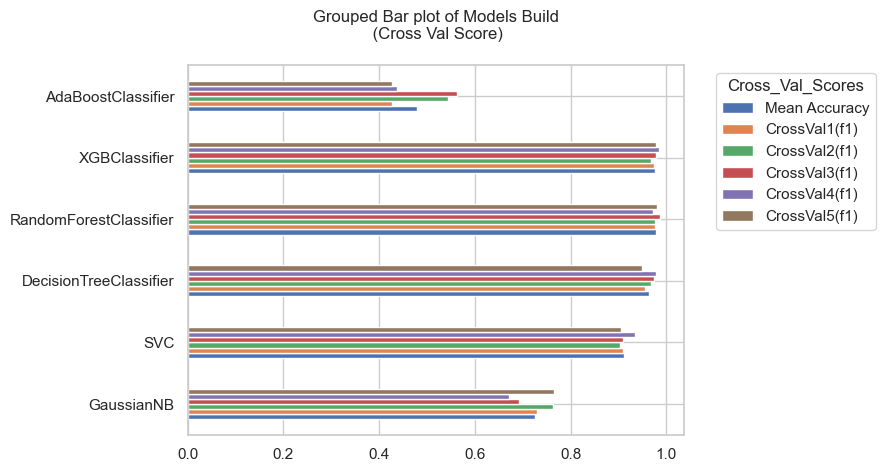

In [761]:
results_df_cvs.plot.barh()
plt.legend(title='Cross_Val_Scores',bbox_to_anchor=(1.05, 1), loc='upper left')
plt.title('Grouped Bar plot of Models Build\n (Cross Val Score)\n')

In [762]:
final_model = pd.concat([results_df['Accuracy'],f1_scores.T,results_df_cvs],axis=1)
final_model

,Accuracy,Train F1 Score,Test F1 Score,Mean Accuracy,CrossVal1(f1),CrossVal2(f1),CrossVal3(f1),CrossVal4(f1),CrossVal5(f1)
GaussianNB,0.77,0.75,0.73,0.72,0.73,0.76,0.69,0.67,0.77
SVC,0.93,0.92,0.93,0.91,0.91,0.90,0.91,0.94,0.91
DecisionTreeClassifier,0.98,1.00,0.98,0.96,0.95,0.97,0.97,0.98,0.95
RandomForestClassifier,0.98,1.00,0.97,0.98,0.98,0.98,0.99,0.97,0.98
XGBClassifier,0.99,1.00,0.99,0.98,0.97,0.97,0.98,0.98,0.98
AdaBoostClassifier,0.43,0.26,0.27,0.48,0.43,0.54,0.56,0.44,0.43


## XGBoost - Train and Test Score Analysis

In [763]:
from sklearn.metrics import accuracy_score

train_scores = []
test_scores = []

for i in range(10, 201, 10):
    # Fit XGBoost classifier
    xgb_classifier = XGBClassifier(class_weight='balanced', n_estimators=i, random_state=2020)
    xgb_classifier.fit(X_train, y_train)
    
    # Predictions on training and testing sets
    y_train_pred = xgb_classifier.predict(X_train)
    y_test_pred = xgb_classifier.predict(X_test)
    
    # Calculate macro-average accuracy scores
    train_score = accuracy_score(y_train, y_train_pred)
    train_scores.append(train_score)
    
    test_score = accuracy_score(y_test, y_test_pred)
    test_scores.append(test_score)

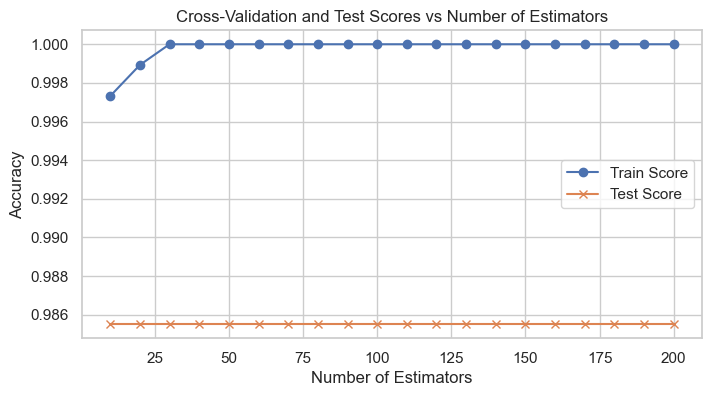

In [764]:
# Plot results

plt.figure(figsize=(8, 4))
plt.plot(range(10, 201, 10), train_scores, label='Train Score', marker='o')
plt.plot(range(10, 201, 10), test_scores, label='Test Score', marker='x')
plt.xlabel('Number of Estimators')
plt.ylabel('Accuracy')
plt.title('Cross-Validation and Test Scores vs Number of Estimators')
plt.legend()
plt.grid(True)
plt.show()

## Performance Evaluation Matrix 

In [765]:
performance_result= results_df[:]

In [766]:
performance_result

,Accuracy,Weighted Avg F1-score,Weighted Avg Recall,Weighted Avg Precision
Model,,,,
GaussianNB,0.77,0.74,0.77,0.79
SVC,0.93,0.93,0.93,0.94
DecisionTreeClassifier,0.98,0.98,0.98,0.98
RandomForestClassifier,0.98,0.98,0.98,0.98
XGBClassifier,0.99,0.99,0.99,0.99
AdaBoostClassifier,0.43,0.27,0.43,0.20


Text(0.5, 1.0, 'Performance Evaluation Matrix')

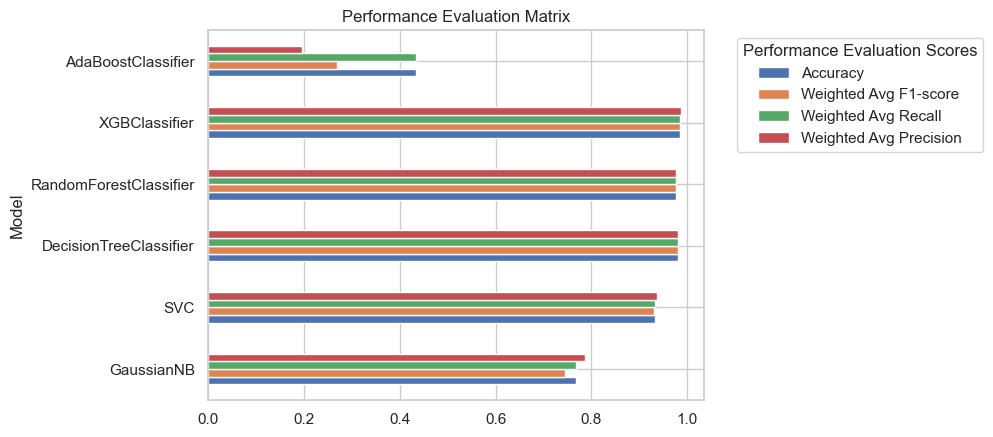

In [767]:
performance_result.plot.barh()
plt.legend(title='Performance Evaluation Scores',bbox_to_anchor=(1.05, 1), loc='upper left')
plt.title('Performance Evaluation Matrix')

## Feature importance - XGB Classifier 

In [768]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((1863, 20), (207, 20), (1863,), (207,))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        27
           1       0.97      1.00      0.98        28
           2       1.00      0.96      0.98        27
           3       1.00      0.96      0.98        28
           4       0.97      1.00      0.99        35
           5       0.97      1.00      0.98        30
           6       1.00      0.97      0.98        32

    accuracy                           0.99       207
   macro avg       0.99      0.99      0.99       207
weighted avg       0.99      0.99      0.99       207



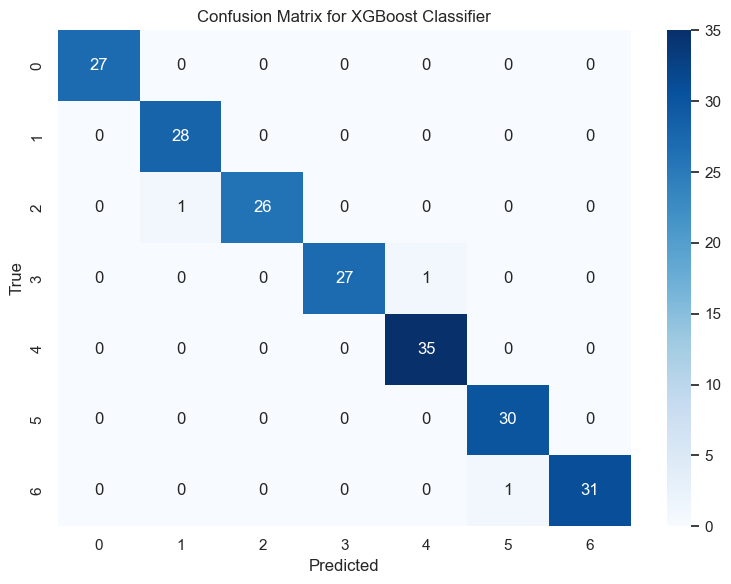

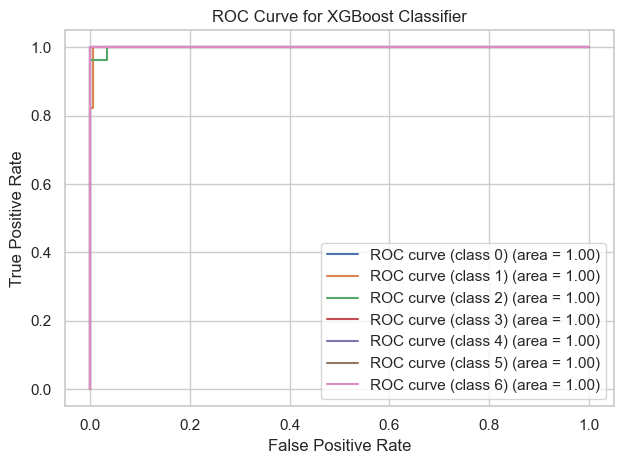

BMI                                  0.59
Gender_Male                          0.24
FAVC_yes                             0.03
CALC_Sometimes                       0.02
family_history_with_overweight_yes   0.02
MTRANS_Public_Transportation         0.01
NCP                                  0.01
FAF                                  0.01
CH2O                                 0.01
SCC_yes                              0.01
TUE                                  0.01
FCVC                                 0.01
Age_norm                             0.01
CAEC_Frequently                      0.01
CALC_Frequently                      0.00
SMOKE_yes                            0.00
MTRANS_Bike                          0.00
MTRANS_Motorbike                     0.00
CAEC_no                              0.00
MTRANS_Walking                       0.00
dtype: float32


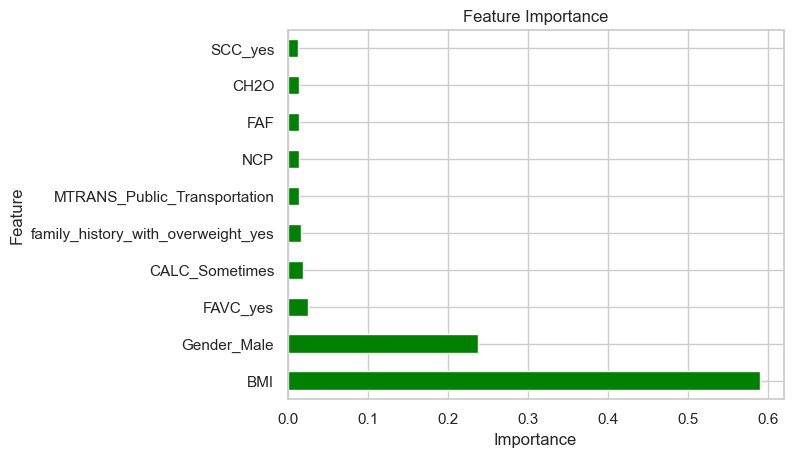

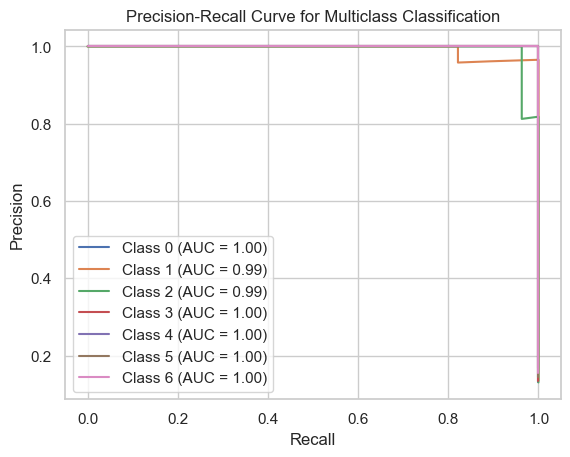

In [769]:
# Assuming you have already trained your XGBoost classifier
xgb_classifier = XGBClassifier(class_weight='balanced', random_state=2020)

# Fit the classifier to the data
xgb_classifier.fit(X_train, y_train)
y_pred = xgb_classifier.predict(X_test)

# Classification Report
print(classification_report(y_test,y_pred))

# Generate confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Plot confusion matrix
fig, ax = plt.subplots(figsize=(8, 6))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', ax=ax)
ax.set_title('Confusion Matrix for XGBoost Classifier')
ax.set_xlabel('Predicted')
ax.set_ylabel('True')
plt.tight_layout()
plt.show()

## ROC- AUC Curve

# Get predicted probabilities
y_pred_proba = xgb_classifier.predict_proba(X_test)

# Binarize the labels
y_test_binarized = label_binarize(y_test, classes=np.unique(y_test))

# Compute ROC curve and ROC area for each class
n_classes = len(np.unique(y_test))
for j in range(n_classes):
    fpr, tpr, _ = roc_curve(y_test_binarized[:, j], y_pred_proba[:, j])
    roc_auc = auc(fpr, tpr)
        
    # Plot ROC curve
    plt.plot(fpr, tpr, label='ROC curve (class {}) (area = {:.2f})'.format(j, roc_auc))

# Set labels and legend
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for XGBoost Classifier')
plt.legend(loc='lower right')

# Adjust layout
plt.tight_layout()
plt.show()

# Get feature importances
importance = xgb_classifier.feature_importances_

# Create a Series for plotting
feat_importances = pd.Series(importance, index=X.columns)
print(feat_importances.sort_values(ascending=False))

# Plot feature importances
feat_importances.nlargest(10).plot(kind='barh', title='Feature Importance',color='green')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()

from sklearn.metrics import precision_recall_curve, average_precision_score

# Assuming y_test is your true labels and y_score contains the predicted probabilities for each class
precision = dict()
recall = dict()
thresholds = dict()
auc_pr = average_precision_score(y_test_binarized, y_pred_proba, average=None)

for i in range(n_classes):
    precision[i], recall[i], thresholds[i] = precision_recall_curve(y_test_binarized[:, i], y_pred_proba[:, i])
    plt.plot(recall[i], precision[i], label='Class {} (AUC = {:.2f})'.format(i, auc_pr[i]))

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve for Multiclass Classification')
plt.legend()
plt.grid(True)
plt.show()

### Conclusion

    
Based on the feature importance analysis:

 BMI (Body Mass Index): BMI is a direct measure of body fat based on an individual's height and weight. A higher BMI generally indicates a higher likelihood of obesity. Therefore, as BMI increases, the probability of being classified as obese also increases.

Gender_Male: Gender can influence obesity due to differences in body composition, metabolism, and hormonal factors between males and females. For instance, males tend to have higher muscle mass and metabolic rates compared to females, which can affect their susceptibility to obesity.

FAVC_yes (Consumption of High Calorie Foods): Consuming high-calorie foods is associated with weight gain and obesity. Therefore, individuals who consume high-calorie foods (FAVC_yes) are more likely to be classified as obese compared to those who do not.

CALC_Sometimes (Frequency of Certain Activities/Behaviors): Depending on the context, CALC_Sometimes might represent the frequency of certain activities or behaviors. If these activities or behaviors contribute to sedentary lifestyles or unhealthy dietary habits, they could increase the risk of obesity.

family_history_with_overweight_yes (Family History of Overweight): Genetics play a significant role in obesity risk. Individuals with a family history of overweight or obesity are more likely to inherit genetic predispositions to weight gain and obesity, increasing their likelihood of being classified as obese.

MTRANS_Public_Transportation (Mode of Transportation): The mode of transportation can indirectly influence obesity risk. Individuals who rely on public transportation may have fewer opportunities for physical activity, leading to a sedentary lifestyle, which is a risk factor for obesity.

NCP (Number of Main Meals): Dietary habits, including the number of main meals consumed per day, can impact obesity risk. Irregular eating patterns or excessive consumption of main meals may contribute to weight gain and obesity.

FAF (Frequency of Physical Activity): Regular physical activity is essential for maintaining a healthy weight and reducing the risk of obesity. Individuals who engage in frequent physical activity (higher FAF) are less likely to be obese compared to those with sedentary lifestyles.

CH2O (Consumption of Water Daily): Adequate hydration is important for overall health and can indirectly impact weight management. Drinking sufficient water may help control appetite and calorie intake, potentially reducing the risk of obesity.

SCC_yes (Some Categorical Variable): Depending on the context, SCC_yes might represent a categorical variable related to health or lifestyle habits that could influence obesity risk. For example, it could indicate the presence of certain medical conditions or behaviors associated with obesity.

In summary, the analysis indicates that BMI, gender, and certain dietary behaviors are the most important factors influencing the target variable, while other lifestyle factors such as transportation mode and snacking habits also contribute to a lesser extent.

                                                        Thank you